<a href="https://colab.research.google.com/github/japabon216/Trabajo_de_grado_SM_Para_Clasificacion_ADL_Algoritmos_SL/blob/main/Parte_6_Prueba_de_algoritmos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
import os
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
drive.mount('/content/drive')

Mounted at /content/drive


#Separación de Code

In [ ]:
Dataset = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_Caracteristicas.csv')

In [ ]:
Dataset['Dataset'].unique()

array([ 1,  2,  9,  5,  6,  7,  8, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21,
       23])

In [ ]:
Dataset

,segmento,Dataset,Activity,Code,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,...,Z_Acc_abslt,X_Gyro_abslt,Y_Gyro_abslt,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy
0,1,1,3,312,0.556724,0.239285,0.264039,NaN,NaN,NaN,...,0.253334,NaN,NaN,NaN,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000
1,2,1,3,312,0.537785,0.214547,0.238416,NaN,NaN,NaN,...,0.333458,NaN,NaN,NaN,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000
2,3,1,3,312,0.637531,0.214326,0.386845,NaN,NaN,NaN,...,0.325268,NaN,NaN,NaN,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000
3,4,1,3,312,0.438566,0.235876,0.325491,NaN,NaN,NaN,...,0.374976,NaN,NaN,NaN,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000
4,5,1,3,312,0.146831,0.931747,0.136279,NaN,NaN,NaN,...,0.103557,NaN,NaN,NaN,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,202,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,...,0.834971,0.020929,0.012904,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474
238986,255440,14,92,202,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,...,0.834528,0.021803,0.011714,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699
238987,255441,14,92,202,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,...,0.836455,0.021248,0.010453,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226
238988,255442,14,92,202,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,...,0.834824,0.021746,0.013049,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974


In [ ]:
Dataset['Code'] = Dataset['Code'].astype(str)

Dataset['Sensor_Type'] = ''
Dataset['Left_Right'] = ''
Dataset['Ubication'] = ''

# Utilizando str.slice separamos el código en 3
Dataset['Sensor_Type'] = Dataset['Code'].str.slice(0, 1)
Dataset['Left_Right'] = Dataset['Code'].str.slice(1, 2)
Dataset['Ubication'] = Dataset['Code'].str.slice(2, 3)

In [ ]:
Dataset

,segmento,Dataset,Activity,Code,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,1,1,3,312,0.556724,0.239285,0.264039,NaN,NaN,NaN,...,NaN,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,2,1,3,312,0.537785,0.214547,0.238416,NaN,NaN,NaN,...,NaN,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,1,3,312,0.637531,0.214326,0.386845,NaN,NaN,NaN,...,NaN,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,4,1,3,312,0.438566,0.235876,0.325491,NaN,NaN,NaN,...,NaN,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,5,1,3,312,0.146831,0.931747,0.136279,NaN,NaN,NaN,...,NaN,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,202,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,255440,14,92,202,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,255441,14,92,202,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,255442,14,92,202,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


In [ ]:
Dataset.drop(columns=['Code'], inplace=True)

Dataset['Sensor_Type'] = Dataset['Sensor_Type'].astype(int)
Dataset['Left_Right'] = Dataset['Left_Right'].astype(int)
Dataset['Ubication'] = Dataset['Ubication'].astype(int)

In [ ]:
Dataset

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,1,1,3,0.556724,0.239285,0.264039,NaN,NaN,NaN,-0.128850,...,NaN,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,2,1,3,0.537785,0.214547,0.238416,NaN,NaN,NaN,-0.079838,...,NaN,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,1,3,0.637531,0.214326,0.386845,NaN,NaN,NaN,-0.263432,...,NaN,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,4,1,3,0.438566,0.235876,0.325491,NaN,NaN,NaN,-0.156160,...,NaN,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,5,1,3,0.146831,0.931747,0.136279,NaN,NaN,NaN,0.069386,...,NaN,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,255440,14,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,255441,14,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,255442,14,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


In [ ]:
Dataset.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_Codigo_Separado.csv',index=False)

#Carga de datasets

##Carga del dataset final para batch

Este dataset es basicamente el dataset definitivo

In [ ]:
Dataset = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_Codigo_Separado.csv')

In [ ]:
Dataset

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,1,1,3,0.556724,0.239285,0.264039,NaN,NaN,NaN,-0.128850,...,NaN,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,2,1,3,0.537785,0.214547,0.238416,NaN,NaN,NaN,-0.079838,...,NaN,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,1,3,0.637531,0.214326,0.386845,NaN,NaN,NaN,-0.263432,...,NaN,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,4,1,3,0.438566,0.235876,0.325491,NaN,NaN,NaN,-0.156160,...,NaN,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,5,1,3,0.146831,0.931747,0.136279,NaN,NaN,NaN,0.069386,...,NaN,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,255440,14,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,255441,14,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,255442,14,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


##Carga del dataset sin 16 para batch

Es el dataset completo excluyendo el dataset 16

In [ ]:
Datasetsin16 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_batch_sin_16.csv')

Vemos las actividades que quedan en este dataset

In [ ]:
conteo_por_actividad = Datasetsin16['Activity'].value_counts()

print(conteo_por_actividad)

6     8707
61    3454
16    3027
9     2884
18    2816
17    2668
13    2204
14    2021
37    1976
59    1733
3     1436
35    1371
11    1111
8     1063
53     958
56     957
50     957
52     956
51     956
49     956
27     854
29     853
60     831
92     752
30     465
34     461
33     459
32     446
22     400
31     369
46     360
48     321
21     238
5      188
28     188
15     174
25     167
19     165
20     165
24     164
39      75
12      54
Name: Activity, dtype: int64


In [ ]:
unique_datasets = Datasetsin16['Dataset'].unique()
unique_datasets

array([ 1,  2,  9,  5,  6,  7,  8, 11, 12, 13, 14, 23])

##Carga del dataset solo 16 para batch

Es el dataset completo, PERO solo incluye al dataset 16 y excluye al resto

In [ ]:
Datasetsolo16 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_batch_solo_16.csv')

In [ ]:
unique_datasets = Datasetsolo16['Dataset'].unique()
unique_datasets

array([16, 17, 18, 19, 20, 21])

##Dataset sin NaN para stream

A diferencia de Batch que podemos quitarle los NaN despue´s, para Stream hay que hacerlo antes, lo hacemos aquí

In [ ]:
Dataset

NameError: ignored

In [ ]:
Datasetnan = Dataset.fillna(0)

In [ ]:
Datasetnan

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,1,1,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,...,0.000000,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,2,1,3,0.537785,0.214547,0.238416,0.000000,0.000000,0.000000,-0.079838,...,0.000000,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,1,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,...,0.000000,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,4,1,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,...,0.000000,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,5,1,3,0.146831,0.931747,0.136279,0.000000,0.000000,0.000000,0.069386,...,0.000000,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,255440,14,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,255441,14,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,255442,14,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


In [ ]:
Datasetnan.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_sin_nan.csv',index=False)

In [ ]:
Dataset = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_sin_nan.csv')

In [ ]:
Dataset

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,1,1,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,...,0.000000,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,2,1,3,0.537785,0.214547,0.238416,0.000000,0.000000,0.000000,-0.079838,...,0.000000,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,1,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,...,0.000000,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,4,1,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,...,0.000000,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,5,1,3,0.146831,0.931747,0.136279,0.000000,0.000000,0.000000,0.069386,...,0.000000,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,255440,14,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,255441,14,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,255442,14,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


In [ ]:
Dataset.drop(["segmento", "Dataset"], axis=1, inplace=True)

En Stream también qutamos el segmento y dataset desde aquí.

In [ ]:
Dataset.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_stream.csv',index=False)

##Dataset sin 16

In [ ]:
valores_a_eliminar = [16, 17, 18, 19, 20, 21]

Datasetsin16 = Dataset[~Dataset['Dataset'].isin(valores_a_eliminar)]

In [ ]:
Datasetsin16

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,1,1,3,0.556724,0.239285,0.264039,NaN,NaN,NaN,-0.128850,...,NaN,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,2,1,3,0.537785,0.214547,0.238416,NaN,NaN,NaN,-0.079838,...,NaN,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,1,3,0.637531,0.214326,0.386845,NaN,NaN,NaN,-0.263432,...,NaN,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,4,1,3,0.438566,0.235876,0.325491,NaN,NaN,NaN,-0.156160,...,NaN,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,5,1,3,0.146831,0.931747,0.136279,NaN,NaN,NaN,0.069386,...,NaN,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,255439,14,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,255440,14,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,255441,14,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,255442,14,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


In [ ]:
Datasetsin16.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_batch_sin_16.csv',index=False)

In [ ]:
Datasetsin16.drop(["segmento", "Dataset"], axis=1, inplace=True)

<ipython-input-7-42e4c6f3ce61>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Datasetsin16.drop(["segmento", "Dataset"], axis=1, inplace=True)


In [ ]:
Datasetsin16.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_stream_sin_16.csv',index=False)

In [ ]:
#Aqui vamos a dividir este dataset sin 16 en el 70 por ciento y en 30 por ciento para stream

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

# Crear una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Crear una nueva columna en tu DataFrame para la categorización
Datasetsin16['Split'] = ''

# Iterar sobre cada valor único en la columna 'Dataset'
for dataset_id in Datasetsin16['Dataset'].unique():
    # Obtener los índices de las filas correspondientes a este valor
    indices = Datasetsin16[Datasetsin16['Dataset'] == dataset_id].index

    # Realizar la división estratificada para este valor único
    for train_index, test_index in sss.split(indices, Datasetsin16.loc[indices]['Dataset']):
        train_indices = indices[train_index]
        test_indices = indices[test_index]

        # Asignar 'Setenta' a las filas de entrenamiento y 'Treinta' a las filas de prueba
        Datasetsin16.loc[train_indices, 'Split'] = 'Setenta'
        Datasetsin16.loc[test_indices, 'Split'] = 'Treinta'

# Ver el resultado en el DataFrame
dataset_setenta = Datasetsin16[Datasetsin16['Split'] == 'Setenta']
dataset_treinta = Datasetsin16[Datasetsin16['Split'] == 'Treinta']

<ipython-input-7-cfe62e6fda1d>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Datasetsin16['Split'] = ''


In [ ]:
dataset_setenta

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication,Split
0,1,1,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,...,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2,Setenta
2,3,1,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,...,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2,Setenta
3,4,1,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,...,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2,Setenta
5,6,1,3,0.797596,0.700223,0.153502,0.000000,0.000000,0.000000,-0.076669,...,8.835745,8.833255,8.760726,-0.000000,-0.000000,-0.000000,3,1,2,Setenta
6,7,1,3,0.461303,0.772700,0.230196,0.000000,0.000000,0.000000,-0.160516,...,8.751745,8.631667,8.715745,-0.000000,-0.000000,-0.000000,3,1,2,Setenta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238983,255437,14,92,0.007126,0.003812,0.003829,0.007097,0.015925,0.008371,0.387136,...,7.066523,6.894714,6.936189,4.625078,5.169618,4.680251,2,0,2,Setenta
238985,255439,14,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,...,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2,Setenta
238986,255440,14,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,...,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2,Setenta
238988,255442,14,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,...,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2,Setenta


In [ ]:
#Verificacion para saber si el dataset tiene el 70 por ciento

In [ ]:
# Calcular el número total de filas en cada dataset
total_filas_dataset = len(Datasetsin16)
total_filas_X_train= len(dataset_setenta)

# Calcular la cantidad de filas para cada ID en ambos datasets
conteo_ids_dataset = Datasetsin16['Dataset'].value_counts().sort_index()
conteo_ids_X_train = dataset_setenta['Dataset'].value_counts().sort_index()

# Calcular el porcentaje para cada ID en dataset_70 con respecto a Dataset
porcentaje_por_id = (conteo_ids_X_train / conteo_ids_dataset) * 100

# Calcular la cantidad de filas para cada ID en el dataset original (df_dataset)
conteo_ids_dataset_original = Datasetsin16['Dataset'].value_counts().sort_index()

# Calcular el porcentaje para cada ID en el dataset original (df_dataset) con respecto al total de filas en ese dataset
porcentaje_por_id_original = (conteo_ids_dataset_original / total_filas_dataset) * 100

df_resultados = pd.DataFrame({
    'ID': porcentaje_por_id.index,
    '% Activity': porcentaje_por_id.values,
    'Peso': porcentaje_por_id_original.values
})

# Formatear las columnas de porcentaje
df_resultados['% Activity'] = df_resultados['% Activity'].apply(lambda x: f'{x:.2f}%')
df_resultados['Peso'] = df_resultados['Peso'].apply(lambda x: f'{x:.2f}%')
df_resultados

,ID,% Activity,Peso
0,1,69.97%,1.56%
1,2,69.97%,1.50%
2,5,69.97%,5.57%
3,6,70.00%,10.88%
4,7,70.00%,4.85%
5,8,70.00%,9.00%
6,9,70.00%,11.08%
7,11,69.99%,2.83%
8,12,70.00%,28.48%
9,13,69.98%,3.83%


In [ ]:
dataset_setenta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)
dataset_treinta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)

<ipython-input-11-28d7382a0225>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_setenta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)
<ipython-input-11-28d7382a0225>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_treinta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)


In [ ]:

dataset_setenta.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_sin_16_70_para_stream.csv',index=False)
dataset_treinta.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_sin_16_30_para_stream.csv',index=False)

##Dataset solo 16

In [ ]:
valores_a_conservar = [16, 17, 18, 19, 20, 21]

Datasetsolo16 = Dataset[Dataset['Dataset'].isin(valores_a_conservar)]

In [ ]:
Datasetsolo16

,segmento,Dataset,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
10221,11330,16,6,0.768259,0.341723,0.296355,NaN,NaN,NaN,0.700180,...,NaN,6.796139,6.760220,6.561676,-0.0,-0.0,-0.0,3,0,1
10222,11331,16,6,0.590258,0.338025,0.534820,NaN,NaN,NaN,0.638336,...,NaN,6.943163,6.437963,6.994281,-0.0,-0.0,-0.0,3,0,1
10223,11332,16,6,0.647866,0.363862,0.428734,NaN,NaN,NaN,-0.044239,...,NaN,7.003860,6.677935,6.863402,-0.0,-0.0,-0.0,3,0,1
10224,11333,16,6,0.801103,0.240020,0.288062,NaN,NaN,NaN,0.308438,...,NaN,6.921371,6.485536,6.582586,-0.0,-0.0,-0.0,3,0,1
10225,11334,16,6,0.877275,0.342181,0.395677,NaN,NaN,NaN,0.296869,...,NaN,7.252737,6.746646,6.748526,-0.0,-0.0,-0.0,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238233,253873,18,91,0.236488,0.210463,0.230039,NaN,NaN,NaN,0.727505,...,NaN,6.156838,6.246388,6.394606,-0.0,-0.0,-0.0,3,0,1
238234,253874,18,91,0.396077,0.365081,0.347200,NaN,NaN,NaN,0.739125,...,NaN,6.894078,6.502284,6.878477,-0.0,-0.0,-0.0,3,0,1
238235,253875,18,91,0.386269,0.414624,0.499523,NaN,NaN,NaN,0.733178,...,NaN,6.627664,6.770595,6.971354,-0.0,-0.0,-0.0,3,0,1
238236,253876,18,91,0.672756,0.287076,0.509691,NaN,NaN,NaN,0.429888,...,NaN,6.737628,6.506142,6.798969,-0.0,-0.0,-0.0,3,0,1


In [ ]:
Datasetsolo16.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_batch_solo_16.csv',index=False)

In [ ]:
Datasetsolo16.drop(["segmento", "Dataset"], axis=1, inplace=True)

<ipython-input-18-b1ddb46ffa96>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Datasetsolo16.drop(["segmento", "Dataset"], axis=1, inplace=True)


In [ ]:
Datasetsolo16.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_stream_solo_16.csv',index=False)

In [ ]:
#Ahora dividiremos el dataset solo 16 entre 70 y 30

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

# Crear una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Crear una nueva columna en tu DataFrame para la categorización
Datasetsolo16['Split'] = ''

# Iterar sobre cada valor único en la columna 'Dataset'
for dataset_id in Datasetsolo16['Dataset'].unique():
    # Obtener los índices de las filas correspondientes a este valor
    indices = Datasetsolo16[Datasetsolo16['Dataset'] == dataset_id].index

    # Realizar la división estratificada para este valor único
    for train_index, test_index in sss.split(indices, Datasetsolo16.loc[indices]['Dataset']):
        train_indices = indices[train_index]
        test_indices = indices[test_index]

        # Asignar 'Setenta' a las filas de entrenamiento y 'Treinta' a las filas de prueba
        Datasetsolo16.loc[train_indices, 'Split'] = 'Setenta'
        Datasetsolo16.loc[test_indices, 'Split'] = 'Treinta'

# Ver el resultado en el DataFrame
dataset_setenta = Datasetsolo16[Datasetsolo16['Split'] == 'Setenta']
dataset_treinta = Datasetsolo16[Datasetsolo16['Split'] == 'Treinta']
dataset_setenta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)
dataset_treinta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)
dataset_setenta.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_solo_16_70_para_stream.csv',index=False)
dataset_treinta.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_solo_16_30_para_stream.csv',index=False)

<ipython-input-16-ea74a89391c6>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Datasetsolo16['Split'] = ''
<ipython-input-16-ea74a89391c6>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_setenta.drop(["segmento", "Dataset", "Split"], axis=1, inplace=True)
<ipython-input-16-ea74a89391c6>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_treinta.drop(["segmento"

##Carga del dataset final solo 16 y sin nan

Este es el dataset solo 16 que se usará en Strem, ya no tiene las columnas segmento ni Dataset

In [ ]:
Datasetsolo16 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_stream_solo_16.csv')

In [ ]:
Datasetsolo16

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,6,0.768259,0.341723,0.296355,0.0,0.0,0.0,0.700180,0.171229,0.114857,...,0.0,6.796139,6.760220,6.561676,-0.0,-0.0,-0.0,3,0,1
1,6,0.590258,0.338025,0.534820,0.0,0.0,0.0,0.638336,0.072104,0.409968,...,0.0,6.943163,6.437963,6.994281,-0.0,-0.0,-0.0,3,0,1
2,6,0.647866,0.363862,0.428734,0.0,0.0,0.0,-0.044239,0.345033,-0.080843,...,0.0,7.003860,6.677935,6.863402,-0.0,-0.0,-0.0,3,0,1
3,6,0.801103,0.240020,0.288062,0.0,0.0,0.0,0.308438,0.312270,-0.029000,...,0.0,6.921371,6.485536,6.582586,-0.0,-0.0,-0.0,3,0,1
4,6,0.877275,0.342181,0.395677,0.0,0.0,0.0,0.296869,0.270541,-0.119423,...,0.0,7.252737,6.746646,6.748526,-0.0,-0.0,-0.0,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188625,91,0.236488,0.210463,0.230039,0.0,0.0,0.0,0.727505,0.301101,-0.320870,...,0.0,6.156838,6.246388,6.394606,-0.0,-0.0,-0.0,3,0,1
188626,91,0.396077,0.365081,0.347200,0.0,0.0,0.0,0.739125,0.294461,0.016889,...,0.0,6.894078,6.502284,6.878477,-0.0,-0.0,-0.0,3,0,1
188627,91,0.386269,0.414624,0.499523,0.0,0.0,0.0,0.733178,0.315776,0.067111,...,0.0,6.627664,6.770595,6.971354,-0.0,-0.0,-0.0,3,0,1
188628,91,0.672756,0.287076,0.509691,0.0,0.0,0.0,0.429888,0.220870,0.191633,...,0.0,6.737628,6.506142,6.798969,-0.0,-0.0,-0.0,3,0,1


In [ ]:
unique_activities = Datasetsolo16['Activity'].unique()

num_activities = len(unique_activities)
print("\nNúmero de actividades únicas:", num_activities)

# Calcular el número de filas por cada actividad
activity_counts = Datasetsolo16['Activity'].value_counts()

print("\nNúmero de filas por actividad:")
print(activity_counts)


Número de actividades únicas: 30

Número de filas por actividad:
16    55580
18    52149
66    16341
6     12982
68    11611
61     9764
12     5766
17     4781
24     4027
67     2358
77     2349
91     1961
84     1696
72     1569
75     1267
64      828
85      729
13      492
9       466
73      455
71      308
32      255
30      208
69      201
50      128
46      127
62      101
14       55
51       49
49       27
Name: Activity, dtype: int64


##Carga del dataset final sin 16 y sin nan

Este es el dataset sin 16 que se usará en Strem, pues no tiene valores NaN, ni las columnas segmento ni Dataset

In [ ]:
Datasetsin16 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_stream_sin_16.csv')

In [ ]:
Datasetsin16

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,0.458371,0.140565,...,0.000000,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,3,0.537785,0.214547,0.238416,0.000000,0.000000,0.000000,-0.079838,0.447208,0.325525,...,0.000000,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,0.339554,0.221761,...,0.000000,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,0.449531,0.362703,...,0.000000,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,3,0.146831,0.931747,0.136279,0.000000,0.000000,0.000000,0.069386,-0.053622,0.055953,...,0.000000,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50355,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,-0.393525,-0.834971,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
50356,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,-0.392699,-0.834528,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
50357,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,-0.391607,-0.836455,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
50358,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,-0.391641,-0.834824,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


In [ ]:
unique_activities = Datasetsin16['Activity'].unique()

num_activities = len(unique_activities)
print("\nNúmero de actividades únicas:", num_activities)

# Calcular el número de filas por cada actividad
activity_counts = Datasetsin16['Activity'].value_counts()

print("\nNúmero de filas por actividad:")
print(activity_counts)


Número de actividades únicas: 42

Número de filas por actividad:
6     8707
61    3454
16    3027
9     2884
18    2816
17    2668
13    2204
14    2021
37    1976
59    1733
3     1436
35    1371
11    1111
8     1063
53     958
56     957
50     957
52     956
51     956
49     956
27     854
29     853
60     831
92     752
30     465
34     461
33     459
32     446
22     400
31     369
46     360
48     321
21     238
5      188
28     188
15     174
25     167
19     165
20     165
24     164
39      75
12      54
Name: Activity, dtype: int64


##Carga del dataset para stream

Este es el dataset completo que se usará en Strem, no tiene los valores nan, y no tiene las columnas segmento y Dataset

In [ ]:
Dataset = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_Final_para_stream.csv')

In [ ]:
Dataset

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,0.458371,0.140565,...,0.000000,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,3,0.537785,0.214547,0.238416,0.000000,0.000000,0.000000,-0.079838,0.447208,0.325525,...,0.000000,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
2,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,0.339554,0.221761,...,0.000000,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
3,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,0.449531,0.362703,...,0.000000,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
4,3,0.146831,0.931747,0.136279,0.000000,0.000000,0.000000,0.069386,-0.053622,0.055953,...,0.000000,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238985,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,-0.393525,-0.834971,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
238986,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,-0.392699,-0.834528,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
238987,92,0.006443,0.003205,0.003226,0.006427,0.010841,0.006824,0.386389,-0.391607,-0.836455,...,0.005570,7.109361,6.709386,6.822272,4.544186,4.999300,4.535226,2,0,2
238988,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,-0.391641,-0.834824,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


##Carga de los datasets sin 16, 70 y 30 por ciento

Es el dataset sin 16 separado en 70 y 30 para entrenamiento y evaluación

In [ ]:
Datasetsin16_70 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_sin_16_70_para_stream.csv')
Datasetsin16_30 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_sin_16_30_para_stream.csv')

##Carga de los datasets solo 16, 70 y 30 por ciento

Es el dataset solo 16 separado en 70 y 30 para entrenamiento y evaluación

In [ ]:
Datasetsolo16_70 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_solo_16_70_para_stream.csv')
Datasetsolo16_30 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Dataset_solo_16_30_para_stream.csv')

##Dataset del 30 por ciento para Stream

In [ ]:
treinta = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/dataset30.csv')

In [ ]:
treinta

,segmento,Dataset,Activity,Code,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,...,X_Gyro_abslt,Y_Gyro_abslt,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Split
0,2,1,3,312,0.537785,0.214547,0.238416,NaN,NaN,NaN,...,NaN,NaN,NaN,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,Treinta
1,5,1,3,312,0.146831,0.931747,0.136279,NaN,NaN,NaN,...,NaN,NaN,NaN,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,Treinta
2,9,1,3,312,0.730725,0.684227,0.181553,NaN,NaN,NaN,...,NaN,NaN,NaN,8.515138,8.476950,8.439441,-0.000000,-0.000000,-0.000000,Treinta
3,14,1,3,312,0.279110,0.848683,0.116995,NaN,NaN,NaN,...,NaN,NaN,NaN,8.237375,8.065286,8.369879,-0.000000,-0.000000,-0.000000,Treinta
4,15,1,3,312,0.617520,0.192193,0.268963,NaN,NaN,NaN,...,NaN,NaN,NaN,8.673874,8.671138,8.624196,-0.000000,-0.000000,-0.000000,Treinta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71719,255346,14,92,202,0.003398,0.003450,0.003360,0.006508,0.007829,0.004744,...,0.028840,0.007263,0.024128,6.693707,6.806711,6.855483,4.480221,4.465995,4.068032,Treinta
71720,255352,14,92,202,0.008138,0.015497,0.006541,0.012326,0.014271,0.031242,...,0.029563,0.012343,0.032241,7.200994,7.317142,7.182600,5.392926,5.323004,6.303971,Treinta
71721,255432,14,92,202,0.006371,0.003290,0.002713,0.005254,0.011685,0.005888,...,0.021571,0.010528,0.004958,7.010564,6.806376,6.727816,4.245103,5.034033,4.327928,Treinta
71722,255437,14,92,202,0.007126,0.003812,0.003829,0.007097,0.015925,0.008371,...,0.020897,0.012172,0.006488,7.066523,6.894714,6.936189,4.625078,5.169618,4.680251,Treinta


In [ ]:
treinta = treinta.fillna(0)

In [ ]:
treinta.drop(["segmento", "Dataset"], axis=1, inplace=True)

In [ ]:
treinta = treinta.fillna(0)
treinta.drop(["segmento", "Dataset"], axis=1, inplace=True)
treinta['Code'] = treinta['Code'].astype(str)

# Crear tres nuevas columnas vacías en el DataFrame
treinta['Sensor_Type'] = ''
treinta['Left_Right'] = ''
treinta['Ubication'] = ''

# Utilizar el método str.slice para separar los dígitos y asignarlos a las nuevas columnas
treinta['Sensor_Type'] = treinta['Code'].str.slice(0, 1)
treinta['Left_Right'] = treinta['Code'].str.slice(1, 2)
treinta['Ubication'] = treinta['Code'].str.slice(2, 3)

treinta.drop(columns=['Code'], inplace=True)

# Convertir las nuevas columnas a tipo int
treinta['Sensor_Type'] = treinta['Sensor_Type'].astype(int)
treinta['Left_Right'] = treinta['Left_Right'].astype(int)
treinta['Ubication'] = treinta['Ubication'].astype(int)

In [ ]:
treinta

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Split,Sensor_Type,Left_Right,Ubication
0,3,0.537785,0.214547,0.238416,0.000000,0.000000,0.000000,-0.079838,0.447208,0.325525,...,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,Treinta,3,1,2
1,3,0.146831,0.931747,0.136279,0.000000,0.000000,0.000000,0.069386,-0.053622,0.055953,...,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,Treinta,3,1,2
2,3,0.730725,0.684227,0.181553,0.000000,0.000000,0.000000,-0.258809,-0.241150,0.140762,...,8.515138,8.476950,8.439441,-0.000000,-0.000000,-0.000000,Treinta,3,1,2
3,3,0.279110,0.848683,0.116995,0.000000,0.000000,0.000000,0.302856,-0.623030,0.079638,...,8.237375,8.065286,8.369879,-0.000000,-0.000000,-0.000000,Treinta,3,1,2
4,3,0.617520,0.192193,0.268963,0.000000,0.000000,0.000000,-0.090725,0.466656,0.195675,...,8.673874,8.671138,8.624196,-0.000000,-0.000000,-0.000000,Treinta,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71719,92,0.003398,0.003450,0.003360,0.006508,0.007829,0.004744,0.667611,-0.795821,-0.490942,...,6.693707,6.806711,6.855483,4.480221,4.465995,4.068032,Treinta,2,0,2
71720,92,0.008138,0.015497,0.006541,0.012326,0.014271,0.031242,0.681951,-0.780431,-0.493143,...,7.200994,7.317142,7.182600,5.392926,5.323004,6.303971,Treinta,2,0,2
71721,92,0.006371,0.003290,0.002713,0.005254,0.011685,0.005888,0.381591,-0.402140,-0.836287,...,7.010564,6.806376,6.727816,4.245103,5.034033,4.327928,Treinta,2,0,2
71722,92,0.007126,0.003812,0.003829,0.007097,0.015925,0.008371,0.387136,-0.395767,-0.835672,...,7.066523,6.894714,6.936189,4.625078,5.169618,4.680251,Treinta,2,0,2


In [ ]:
treinta.drop(columns=['Split'], inplace=True)

In [ ]:
treinta.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Treinta_para_stream.csv',index=False)

##Dataset del 70 por ciento para Stream

In [ ]:
setenta = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/dataset70.csv')

In [ ]:
setenta

,segmento,Dataset,Activity,Code,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,...,X_Gyro_abslt,Y_Gyro_abslt,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Split
0,1,1,3,312,0.556724,0.239285,0.264039,NaN,NaN,NaN,...,NaN,NaN,NaN,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,Setenta
1,3,1,3,312,0.637531,0.214326,0.386845,NaN,NaN,NaN,...,NaN,NaN,NaN,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,Setenta
2,4,1,3,312,0.438566,0.235876,0.325491,NaN,NaN,NaN,...,NaN,NaN,NaN,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,Setenta
3,6,1,3,312,0.797596,0.700223,0.153502,NaN,NaN,NaN,...,NaN,NaN,NaN,8.835745,8.833255,8.760726,-0.000000,-0.000000,-0.000000,Setenta
4,7,1,3,312,0.461303,0.772700,0.230196,NaN,NaN,NaN,...,NaN,NaN,NaN,8.751745,8.631667,8.715745,-0.000000,-0.000000,-0.000000,Setenta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167261,255438,14,92,202,0.007988,0.004164,0.003417,0.006838,0.014063,0.008177,...,0.021659,0.012237,0.006536,7.216335,6.956820,6.845188,4.574885,5.283495,4.762337,Setenta
167262,255439,14,92,202,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,...,0.020929,0.012904,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,Setenta
167263,255440,14,92,202,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,...,0.021803,0.011714,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,Setenta
167264,255442,14,92,202,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,...,0.021746,0.013049,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,Setenta


In [ ]:
setenta = setenta.fillna(0)
setenta.drop(["segmento", "Dataset"], axis=1, inplace=True)
setenta['Code'] = setenta['Code'].astype(str)

# Crear tres nuevas columnas vacías en el DataFrame
setenta['Sensor_Type'] = ''
setenta['Left_Right'] = ''
setenta['Ubication'] = ''

# Utilizar el método str.slice para separar los dígitos y asignarlos a las nuevas columnas
setenta['Sensor_Type'] = setenta['Code'].str.slice(0, 1)
setenta['Left_Right'] = setenta['Code'].str.slice(1, 2)
setenta['Ubication'] = setenta['Code'].str.slice(2, 3)

setenta.drop(columns=['Code'], inplace=True)

# Convertir las nuevas columnas a tipo int
setenta['Sensor_Type'] = setenta['Sensor_Type'].astype(int)
setenta['Left_Right'] = setenta['Left_Right'].astype(int)
setenta['Ubication'] = setenta['Ubication'].astype(int)

In [ ]:
setenta

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Split,Sensor_Type,Left_Right,Ubication
0,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,0.458371,0.140565,...,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,Setenta,3,1,2
1,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,0.339554,0.221761,...,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,Setenta,3,1,2
2,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,0.449531,0.362703,...,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,Setenta,3,1,2
3,3,0.797596,0.700223,0.153502,0.000000,0.000000,0.000000,-0.076669,-0.308604,0.124671,...,8.835745,8.833255,8.760726,-0.000000,-0.000000,-0.000000,Setenta,3,1,2
4,3,0.461303,0.772700,0.230196,0.000000,0.000000,0.000000,-0.160516,-0.617380,0.029821,...,8.751745,8.631667,8.715745,-0.000000,-0.000000,-0.000000,Setenta,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167261,92,0.007988,0.004164,0.003417,0.006838,0.014063,0.008177,0.388996,-0.394938,-0.835420,...,7.216335,6.956820,6.845188,4.574885,5.283495,4.762337,Setenta,2,0,2
167262,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,-0.393525,-0.834971,...,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,Setenta,2,0,2
167263,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,-0.392699,-0.834528,...,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,Setenta,2,0,2
167264,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,-0.391641,-0.834824,...,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,Setenta,2,0,2


In [ ]:
setenta.drop(columns=['Split'], inplace=True)

In [ ]:
setenta.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Setenta_para_stream.csv',index=False)

##Carga del 70 y 30 para stream

Es el dataset completo separado en 70 y 30 para entrenamiento y evaluación

In [ ]:
Dataset_70 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Setenta_para_stream.csv')
Dataset_30 = pd.read_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/Treinta_para_stream.csv')

In [ ]:
Dataset_70

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,3,0.556724,0.239285,0.264039,0.000000,0.000000,0.000000,-0.128850,0.458371,0.140565,...,0.000000,8.869784,8.814765,8.825255,-0.000000,-0.000000,-0.000000,3,1,2
1,3,0.637531,0.214326,0.386845,0.000000,0.000000,0.000000,-0.263432,0.339554,0.221761,...,0.000000,8.917784,8.854765,8.877784,-0.000000,-0.000000,-0.000000,3,1,2
2,3,0.438566,0.235876,0.325491,0.000000,0.000000,0.000000,-0.156160,0.449531,0.362703,...,0.000000,8.838765,8.800726,8.878765,-0.000000,-0.000000,-0.000000,3,1,2
3,3,0.797596,0.700223,0.153502,0.000000,0.000000,0.000000,-0.076669,-0.308604,0.124671,...,0.000000,8.835745,8.833255,8.760726,-0.000000,-0.000000,-0.000000,3,1,2
4,3,0.461303,0.772700,0.230196,0.000000,0.000000,0.000000,-0.160516,-0.617380,0.029821,...,0.000000,8.751745,8.631667,8.715745,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167261,92,0.007988,0.004164,0.003417,0.006838,0.014063,0.008177,0.388996,-0.394938,-0.835420,...,0.006536,7.216335,6.956820,6.845188,4.574885,5.283495,4.762337,2,0,2
167262,92,0.010366,0.004910,0.004387,0.007087,0.015720,0.008609,0.391500,-0.393525,-0.834971,...,0.006779,7.350722,6.991137,6.989265,4.667774,5.354898,4.776474,2,0,2
167263,92,0.007642,0.003709,0.003556,0.006685,0.012076,0.007662,0.393547,-0.392699,-0.834528,...,0.006353,7.122322,6.852866,6.811416,4.588092,5.159502,4.690699,2,0,2
167264,92,0.008432,0.004333,0.003977,0.007940,0.015388,0.010053,0.391080,-0.391641,-0.834824,...,0.008189,7.208515,6.932490,6.969884,4.821762,5.335375,5.025974,2,0,2


#-->**ALGORITMOS DE BATCH LEARNIGN**

### (Batch) Decision Tree '/

#####Dataset completo

Precisión del modelo (Decision Tree): 0.59
Precisión del modelo (Decision Tree): 0.59
AUC del modelo (Decision Tree): 0.76
F1-score del modelo (Decision Tree): 0.59


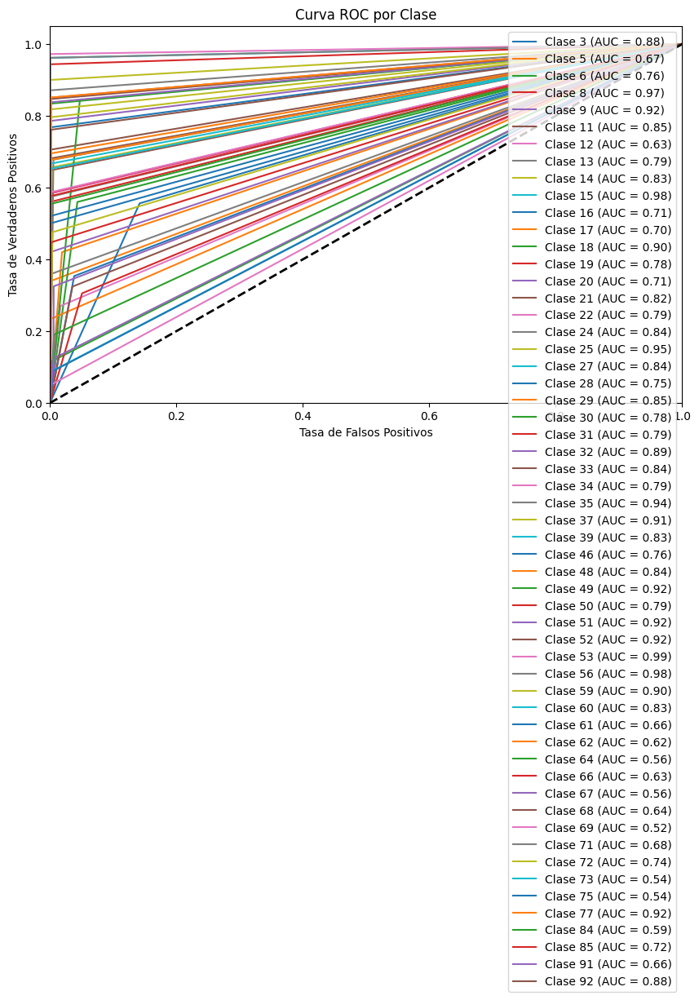

Precisión para la clase Clase 3: 0.77
Precisión para la clase Clase 5: 0.34
Precisión para la clase Clase 6: 0.56
Precisión para la clase Clase 8: 0.94
Precisión para la clase Clase 9: 0.85
Precisión para la clase Clase 11: 0.71
Precisión para la clase Clase 12: 0.27
Precisión para la clase Clase 13: 0.58
Precisión para la clase Clase 14: 0.66
Precisión para la clase Clase 15: 0.96
Precisión para la clase Clase 16: 0.56
Precisión para la clase Clase 17: 0.42
Precisión para la clase Clase 18: 0.84
Precisión para la clase Clase 19: 0.56
Precisión para la clase Clase 20: 0.42
Precisión para la clase Clase 21: 0.65
Precisión para la clase Clase 22: 0.58
Precisión para la clase Clase 24: 0.68
Precisión para la clase Clase 25: 0.90
Precisión para la clase Clase 27: 0.68
Precisión para la clase Clase 28: 0.50
Precisión para la clase Clase 29: 0.70
Precisión para la clase Clase 30: 0.55
Precisión para la clase Clase 31: 0.59
Precisión para la clase Clase 32: 0.79
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
import joblib
from sklearn.model_selection import cross_val_score

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset'], axis=1) # En este momento aún conservamos la actividad para que se tenga en cuenta durante la división del dataset
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

#Dividimos de manera equitativa, funcina tanto para actividades como para datasets
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

dt_classifier = DecisionTreeClassifier(random_state=42)

dt_classifier.fit(X_train, y_train)

joblib.dump(dt_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/hoeffdingtree.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred_dt = dt_classifier.predict(X_test)

# Calcular la exactitud del modelo en el conjunto de prueba
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Precisión del modelo (Decision Tree): {accuracy_dt:.2f}')

# Calcular la precisión del modelo
precision_dt = precision_score(y_test, y_pred_dt, average='weighted')
print(f'Precisión del modelo (Decision Tree): {precision_dt:.2f}')

# Calcular el AUC (Área bajo la curva ROC)
y_prob_dt = dt_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score_dt = roc_auc_score(y_test, y_prob_dt, average='weighted', multi_class='ovr')
print(f'AUC del modelo (Decision Tree): {auc_score_dt:.2f}')

# Calcular la puntuación F1
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
print(f'F1-score del modelo (Decision Tree): {f1_dt:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr_dt = dict()
tpr_dt = dict()
roc_auc_dt = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr_dt[i], tpr_dt[i], _ = roc_curve(y_test, y_prob_dt[:, i], pos_label=class_val)
    roc_auc_dt[i] = auc(fpr_dt[i], tpr_dt[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr_dt[i], tpr_dt[i], label=f'{class_name} (AUC = {roc_auc_dt[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Decision_Tree_batch.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred_dt[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


######Validación cruzada del dataset completo

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

np.random.seed(30)

# Aleatoriza el DataFrame
df = Dataset.sample(frac=1)

X = df.drop(['Activity'], axis=1)
y = df['Activity']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

modelo = DecisionTreeClassifier(random_state=42)

# Realizar validación cruzada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # Aquí usamos StratifiedKFold para mantener la proporción de clases en cada fold

# Especifica las métricas que deseas evaluar durante la validación cruzada
scoring = {'accuracy': 'accuracy', 'precision': 'precision_weighted', 'roc_auc': 'roc_auc_ovo_weighted', 'f1': 'f1_weighted'}

# Realiza la validación cruzada y almacena los resultados en un diccionario
cv_results = cross_validate(modelo, X_train, y_train, cv=cv, scoring=scoring)

print(f'Accuracy promedio: {np.mean(cv_results["test_accuracy"]):.2f}')
print(f'Precision promedio: {np.mean(cv_results["test_precision"]):.2f}')
print(f'AUC promedio: {np.mean(cv_results["test_roc_auc"]):.2f}')
print(f'F1-score promedio: {np.mean(cv_results["test_f1"]):.2f}')

modelo.fit(X_train, y_train)

y_pred = modelo.predict(X_test)

Accuracy promedio: 0.58
Precision promedio: 0.58
AUC promedio: 0.78
F1-score promedio: 0.58
Puntaje F1 para la clase Clase 3: 0.06
Puntaje F1 para la clase Clase 5: 0.06
Puntaje F1 para la clase Clase 6: 0.02
Puntaje F1 para la clase Clase 8: 0.12
Puntaje F1 para la clase Clase 9: 0.04
Puntaje F1 para la clase Clase 11: 0.05
Puntaje F1 para la clase Clase 12: 0.01
Puntaje F1 para la clase Clase 13: 0.02
Puntaje F1 para la clase Clase 14: 0.03
Puntaje F1 para la clase Clase 15: 0.32
Puntaje F1 para la clase Clase 16: 0.02
Puntaje F1 para la clase Clase 17: 0.02
Puntaje F1 para la clase Clase 18: 0.03
Puntaje F1 para la clase Clase 19: 0.34
Puntaje F1 para la clase Clase 20: 0.17
Puntaje F1 para la clase Clase 21: 0.07
Puntaje F1 para la clase Clase 22: 0.04
Puntaje F1 para la clase Clase 24: 0.03
Puntaje F1 para la clase Clase 25: 0.19
Puntaje F1 para la clase Clase 27: 0.05
Puntaje F1 para la clase Clase 28: 0.05
Puntaje F1 para la clase Clase 29: 0.05
Puntaje F1 para la clase Clase 30

####Prueba quitando el 16

Precisión del modelo (Decision Tree): 0.82
Precisión del modelo (Decision Tree): 0.82
AUC del modelo (Decision Tree): 0.90
F1-score del modelo (Decision Tree): 0.82


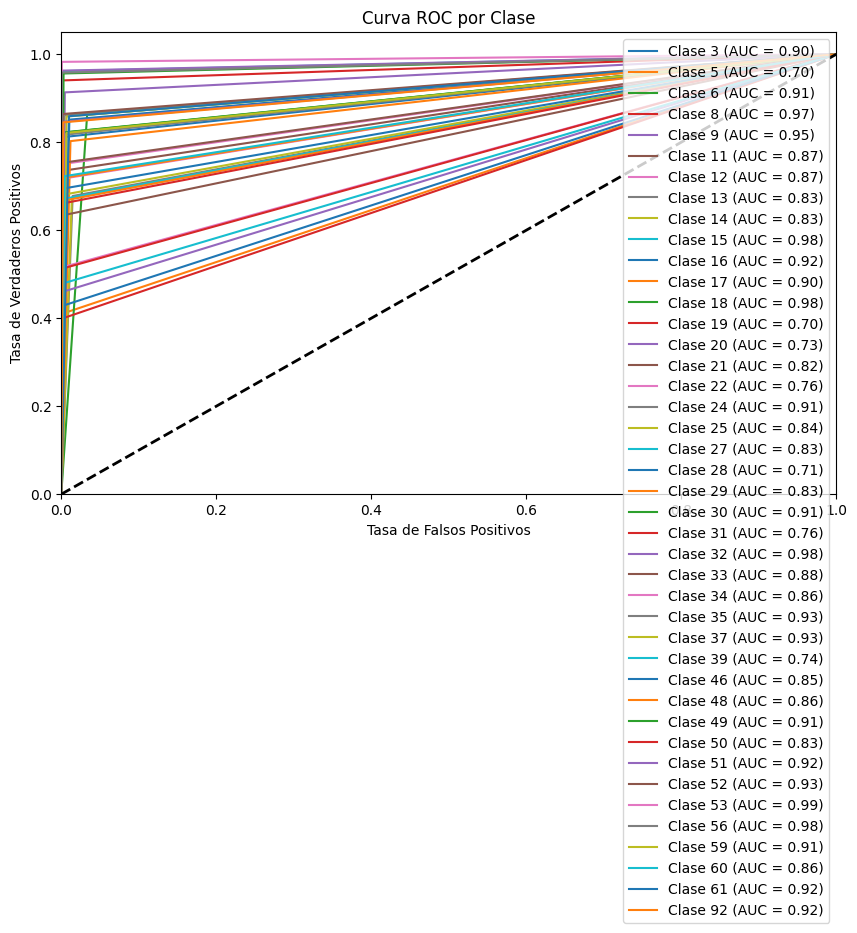

Precisión para la clase Clase 3: 0.81
Precisión para la clase Clase 5: 0.41
Precisión para la clase Clase 6: 0.86
Precisión para la clase Clase 8: 0.94
Precisión para la clase Clase 9: 0.91
Precisión para la clase Clase 11: 0.74
Precisión para la clase Clase 12: 0.75
Precisión para la clase Clase 13: 0.68
Precisión para la clase Clase 14: 0.67
Precisión para la clase Clase 15: 0.96
Precisión para la clase Clase 16: 0.85
Precisión para la clase Clase 17: 0.80
Precisión para la clase Clase 18: 0.96
Precisión para la clase Clase 19: 0.40
Precisión para la clase Clase 20: 0.46
Precisión para la clase Clase 21: 0.63
Precisión para la clase Clase 22: 0.52
Precisión para la clase Clase 24: 0.82
Precisión para la clase Clase 25: 0.68
Precisión para la clase Clase 27: 0.67
Precisión para la clase Clase 28: 0.43
Precisión para la clase Clase 29: 0.67
Precisión para la clase Clase 30: 0.82
Precisión para la clase Clase 31: 0.51
Precisión para la clase Clase 32: 0.96
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Datasetsin16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

dt_classifier = DecisionTreeClassifier(random_state=42)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

# Entrenar el modelo en el conjunto de entrenamiento
dt_classifier.fit(X_train, y_train)

joblib.dump(dt_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/hoeffdingtree_sin_16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred_dt = dt_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Precisión del modelo (Decision Tree): {accuracy_dt:.2f}')

# Calcular la precisión del modelo
precision_dt = precision_score(y_test, y_pred_dt, average='weighted')
print(f'Precisión del modelo (Decision Tree): {precision_dt:.2f}')

# Calcular el AUC (Área bajo la curva ROC)
y_prob_dt = dt_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score_dt = roc_auc_score(y_test, y_prob_dt, average='weighted', multi_class='ovr')
print(f'AUC del modelo (Decision Tree): {auc_score_dt:.2f}')

# Calcular la puntuación F1
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
print(f'F1-score del modelo (Decision Tree): {f1_dt:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr_dt = dict()
tpr_dt = dict()
roc_auc_dt = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr_dt[i], tpr_dt[i], _ = roc_curve(y_test, y_prob_dt[:, i], pos_label=class_val)
    roc_auc_dt[i] = auc(fpr_dt[i], tpr_dt[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr_dt[i], tpr_dt[i], label=f'{class_name} (AUC = {roc_auc_dt[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Decision_Tree_batch_sin_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred_dt[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')

####Solo el 16

Precisión del modelo (Decision Tree): 0.52
Precisión del modelo (Decision Tree): 0.52


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


AUC del modelo (Decision Tree): 0.71
F1-score del modelo (Decision Tree): 0.52


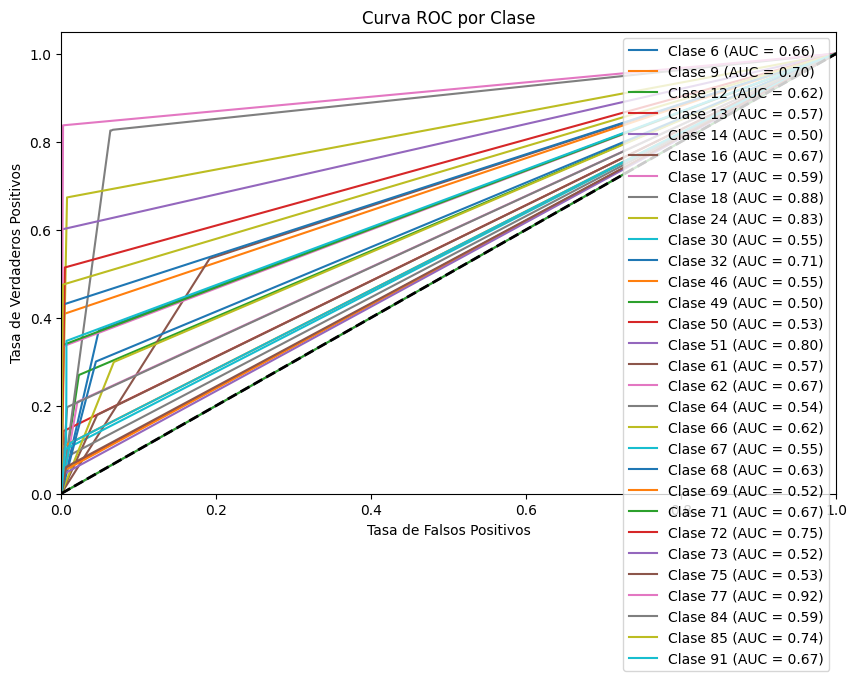

Precisión para la clase Clase 6: 0.37
Precisión para la clase Clase 9: 0.41
Precisión para la clase Clase 12: 0.27
Precisión para la clase Clase 13: 0.14
Precisión para la clase Clase 14: 0.00
Precisión para la clase Clase 16: 0.53
Precisión para la clase Clase 17: 0.21
Precisión para la clase Clase 18: 0.83
Precisión para la clase Clase 24: 0.67
Precisión para la clase Clase 30: 0.10
Precisión para la clase Clase 32: 0.43
Precisión para la clase Clase 46: 0.11
Precisión para la clase Clase 49: 0.00
Precisión para la clase Clase 50: 0.05
Precisión para la clase Clase 51: 0.60
Precisión para la clase Clase 61: 0.18
Precisión para la clase Clase 62: 0.33
Precisión para la clase Clase 64: 0.08
Precisión para la clase Clase 66: 0.30
Precisión para la clase Clase 67: 0.11
Precisión para la clase Clase 68: 0.30
Precisión para la clase Clase 69: 0.05
Precisión para la clase Clase 71: 0.34
Precisión para la clase Clase 72: 0.51
Precisión para la clase Clase 73: 0.04
Precisión para la clase Cla

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Datasetsolo16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

dt_classifier = DecisionTreeClassifier(random_state=42)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

# Entrenar el modelo en el conjunto de entrenamiento
dt_classifier.fit(X_train, y_train)

joblib.dump(dt_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/hoeffdingtree_solo_16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred_dt = dt_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Precisión del modelo (Decision Tree): {accuracy_dt:.2f}')

# Calcular la precisión del modelo
precision_dt = precision_score(y_test, y_pred_dt, average='weighted')
print(f'Precisión del modelo (Decision Tree): {precision_dt:.2f}')

# Calcular el AUC (Área bajo la curva ROC)
y_prob_dt = dt_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score_dt = roc_auc_score(y_test, y_prob_dt, average='weighted', multi_class='ovr')
print(f'AUC del modelo (Decision Tree): {auc_score_dt:.2f}')

# Calcular la puntuación F1
f1_dt = f1_score(y_test, y_pred_dt, average='weighted')
print(f'F1-score del modelo (Decision Tree): {f1_dt:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr_dt = dict()
tpr_dt = dict()
roc_auc_dt = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr_dt[i], tpr_dt[i], _ = roc_curve(y_test, y_prob_dt[:, i], pos_label=class_val)
    roc_auc_dt[i] = auc(fpr_dt[i], tpr_dt[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr_dt[i], tpr_dt[i], label=f'{class_name} (AUC = {roc_auc_dt[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Decision_Tree_batch_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred_dt[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')

#####Validación cruzada solo 16

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

np.random.seed(30)

# Aleatoriza el DataFrame
df = Datasetsolo16.sample(frac=1)

X = df.drop(['Activity'], axis=1)  # Features de acelerómetro y giroscopio
y = df['Activity']  # Variable objetivo

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

modelo = DecisionTreeClassifier(random_state=42)

# Realizar validación cruzada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # Aquí usamos StratifiedKFold para mantener la proporción de clases en cada fold

# Especifica las métricas que deseas evaluar durante la validación cruzada
scoring = {'accuracy': 'accuracy', 'precision': 'precision_weighted', 'roc_auc': 'roc_auc_ovo_weighted', 'f1': 'f1_weighted'}

# Realiza la validación cruzada y almacena los resultados en un diccionario
cv_results = cross_validate(modelo, X_train, y_train, cv=cv, scoring=scoring)

# Imprime los resultados promediados de las métricas
print(f'Accuracy promedio: {np.mean(cv_results["test_accuracy"]):.2f}')
print(f'Precision promedio: {np.mean(cv_results["test_precision"]):.2f}')
print(f'AUC promedio: {np.mean(cv_results["test_roc_auc"]):.2f}')
print(f'F1-score promedio: {np.mean(cv_results["test_f1"]):.2f}')

# Ajusta el modelo en todo el conjunto de entrenamiento (si lo deseas)
modelo.fit(X_train, y_train)

# Realiza predicciones en el conjunto de prueba
y_pred = modelo.predict(X_test)

Accuracy promedio: 0.52
Precision promedio: 0.52
AUC promedio: 0.67
F1-score promedio: 0.52


### (Batch) Random Forest '/

####Por Dataset

Precisión del modelo: 0.70
Precisión del modelo: 0.73
AUC del modelo: 0.93
F1-score del modelo: 0.68


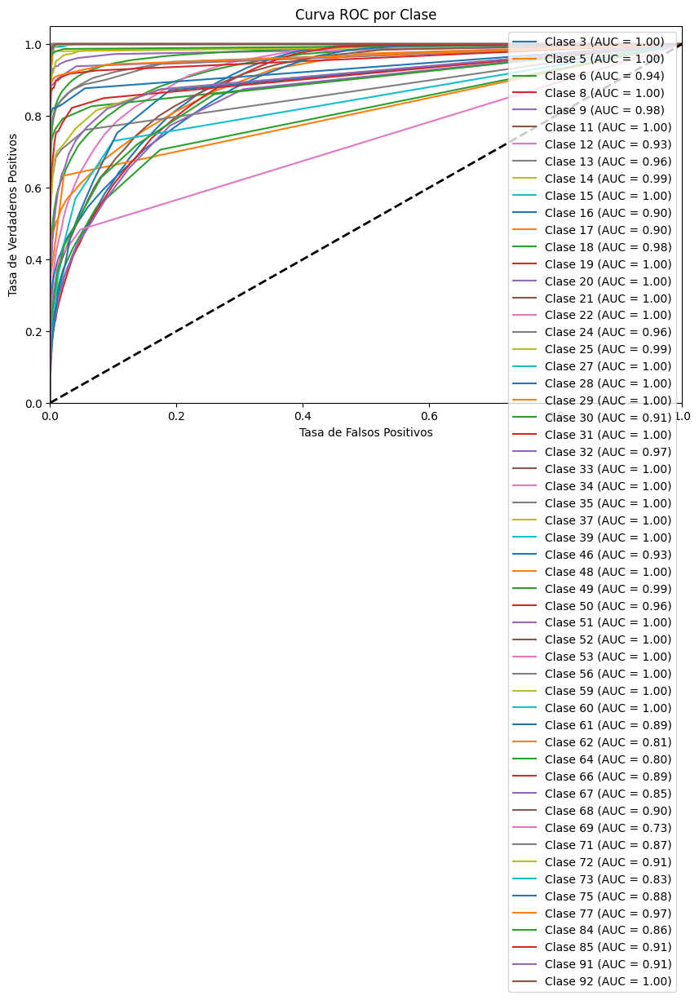

Precisión para la clase Clase 3: 0.90
Precisión para la clase Clase 5: 0.55
Precisión para la clase Clase 6: 0.69
Precisión para la clase Clase 8: 0.99
Precisión para la clase Clase 9: 0.90
Precisión para la clase Clase 11: 0.96
Precisión para la clase Clase 12: 0.34
Precisión para la clase Clase 13: 0.66
Precisión para la clase Clase 14: 0.80
Precisión para la clase Clase 15: 0.98
Precisión para la clase Clase 16: 0.86
Precisión para la clase Clase 17: 0.45
Precisión para la clase Clase 18: 0.89
Precisión para la clase Clase 19: 0.62
Precisión para la clase Clase 20: 0.48
Precisión para la clase Clase 21: 0.82
Precisión para la clase Clase 22: 0.79
Precisión para la clase Clase 24: 0.76
Precisión para la clase Clase 25: 0.96
Precisión para la clase Clase 27: 0.87
Precisión para la clase Clase 28: 0.73
Precisión para la clase Clase 29: 0.89
Precisión para la clase Clase 30: 0.66
Precisión para la clase Clase 31: 0.81
Precisión para la clase Clase 32: 0.81
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset', 'Activity'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo en el conjunto de entrenamiento
rf_classifier.fit(X_train, y_train)

joblib.dump(rf_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/randomforest.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = rf_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

########################3 Calcular el AUC (Área bajo la curva ROC)#############################################################3
y_prob = rf_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#############################33# Calcular la puntuación F1######################################################################33
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Ramdom_forest_batch.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')

######Validación cruzada

In [ ]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.ensemble import RandomForestClassifier

np.random.seed(30)

# Aleatoriza el DataFrame
df = Dataset.sample(frac=1)

X = df.drop(['Activity'], axis=1)  # Features de acelerómetro y giroscopio
y = df['Activity']  # Variable objetivo

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

modelo = RandomForestClassifier(n_estimators=100, random_state=42)

# Realizar validación cruzada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # Aquí usamos StratifiedKFold para mantener la proporción de clases en cada fold

# Especifica las métricas que deseas evaluar durante la validación cruzada
scoring = {'accuracy': 'accuracy', 'precision': 'precision_weighted', 'roc_auc': 'roc_auc_ovo_weighted', 'f1': 'f1_weighted'}

# Realiza la validación cruzada y almacena los resultados en un diccionario
cv_results = cross_validate(modelo, X_train, y_train, cv=cv, scoring=scoring)

# Imprime los resultados promediados de las métricas
print(f'Accuracy promedio: {np.mean(cv_results["test_accuracy"]):.2f}')
print(f'Precision promedio: {np.mean(cv_results["test_precision"]):.2f}')
print(f'AUC promedio: {np.mean(cv_results["test_roc_auc"]):.2f}')
print(f'F1-score promedio: {np.mean(cv_results["test_f1"]):.2f}')

# Ajusta el modelo en todo el conjunto de entrenamiento (si lo deseas)
modelo.fit(X_train, y_train)

# Realiza predicciones en el conjunto de prueba
y_pred = modelo.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy promedio: 0.70
Precision promedio: 0.72
AUC promedio: 0.95
F1-score promedio: 0.68


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
import joblib
from sklearn.model_selection import cross_val_score


df = Dataset.copy()
# Supongamos que tienes tus datos en el DataFrame 'df'
X = df.drop(['Activity','segmento', 'Dataset'], axis=1) # Features de acelerómetro y giroscopio
y = df['Activity']  # Variable objetivo

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X = X.fillna(0)

sss = StratifiedShuffleSplit(n_splits=10, test_size=0.3, random_state=42)

# Creamos un clasificador de árbol de decisión
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Realizamos la validación cruzada estratificada
scores = cross_val_score(rf_classifier, X, y, cv=sss, scoring='accuracy')

# Imprime los resultados de validación cruzada
print("Resultados de Validación Cruzada:")
print("Puntuaciones por pliegue:", scores)
print("Precisión promedio:", scores.mean())

# Entrenar el modelo en el conjunto de entrenamiento
rf_classifier.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_dt = rf_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Precisión del modelo (Decision Tree): {accuracy_dt:.2f}')

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

class_f1_scores = {}

for class_val in unique_classes:
    mask = y_test == class_val
    f1 = f1_score(y_test[mask], y_pred_dt[mask], average=None)
    class_f1_scores[class_val] = f1

# Imprimir el puntaje F1 de cada clase
for class_val, f1_array in class_f1_scores.items():
    class_name = class_names[class_val]
    f1_mean = f1_array.mean()
    print(f'Puntaje F1 para la clase {class_name}: {f1_mean:.2f}')

Resultados de Validación Cruzada:
Puntuaciones por pliegue: [0.70068483 0.69983402 0.70412988 0.70086615 0.70103352 0.70100562
 0.70138221 0.70090799 0.70125668 0.70260959]
Precisión promedio: 0.7013710476031075
Precisión del modelo (Decision Tree): 0.70
Puntaje F1 para la clase Clase 3: 0.11
Puntaje F1 para la clase Clase 5: 0.14
Puntaje F1 para la clase Clase 6: 0.02
Puntaje F1 para la clase Clase 8: 0.33
Puntaje F1 para la clase Clase 9: 0.08
Puntaje F1 para la clase Clase 11: 0.12
Puntaje F1 para la clase Clase 12: 0.04
Puntaje F1 para la clase Clase 13: 0.04
Puntaje F1 para la clase Clase 14: 0.07
Puntaje F1 para la clase Clase 15: 0.50
Puntaje F1 para la clase Clase 16: 0.03
Puntaje F1 para la clase Clase 17: 0.03
Puntaje F1 para la clase Clase 18: 0.05
Puntaje F1 para la clase Clase 19: 0.26
Puntaje F1 para la clase Clase 20: 0.22
Puntaje F1 para la clase Clase 21: 0.15
Puntaje F1 para la clase Clase 22: 0.13
Puntaje F1 para la clase Clase 24: 0.09
Puntaje F1 para la clase Clase

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, f1_score

df = Datasetsin16.copy()

# Establecer una semilla aleatoria para reproducibilidad
np.random.seed(30)

# Aleatoriza el DataFrame
df = df.sample(frac=1)

# Supongamos que tienes tus datos en el DataFrame 'df'
X = df.drop(['Activity'], axis=1)  # Features de acelerómetro y giroscopio
y = df['Activity']  # Variable objetivo

# Definir el número de divisiones (en este caso, 10)
n_splits = 10

# Crear el objeto StratifiedShuffleSplit para la evaluación cruzada
sss = StratifiedShuffleSplit(n_splits=n_splits, test_size=0.3, random_state=42)

# Inicializar listas para almacenar las métricas de rendimiento en cada iteración
accuracy_scores = []
precision_scores = []
f1_scores = []

# Iterar a través de las divisiones
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

    # Entrenar el modelo en el conjunto de entrenamiento actual
    rf_classifier.fit(X_train, y_train)

    # Realizar predicciones en el conjunto de prueba actual
    y_pred = rf_classifier.predict(X_test)

    # Calcular las métricas de rendimiento y almacenarlas
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    f1_scores.append(f1)

# Calcular las métricas promedio de todas las divisiones
avg_accuracy = sum(accuracy_scores) / n_splits
avg_precision = sum(precision_scores) / n_splits
avg_f1 = sum(f1_scores) / n_splits

# Imprimir las métricas promedio
print(f'Precisión promedio en {n_splits} divisiones: {avg_accuracy:.2f}')
print(f'Precisión promedio ponderada en {n_splits} divisiones: {avg_precision:.2f}')
print(f'F1-score promedio ponderado en {n_splits} divisiones: {avg_f1:.2f}')


Precisión promedio en 10 divisiones: 0.92
Precisión promedio ponderada en 10 divisiones: 0.92
F1-score promedio ponderado en 10 divisiones: 0.92


####Prueba quitando el 16

Precisión del modelo: 0.92
Precisión del modelo: 0.92
AUC del modelo: 1.00
F1-score del modelo: 0.92


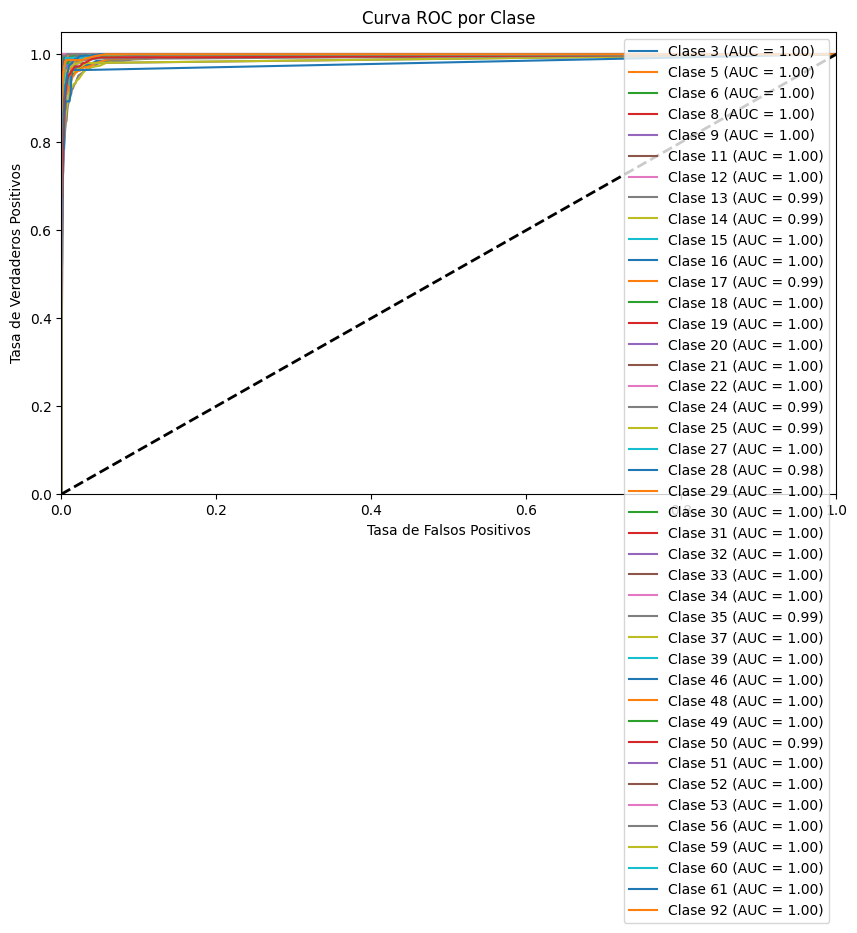

Precisión para la clase Clase 3: 0.90
Precisión para la clase Clase 5: 0.62
Precisión para la clase Clase 6: 0.96
Precisión para la clase Clase 8: 1.00
Precisión para la clase Clase 9: 0.98
Precisión para la clase Clase 11: 0.96
Precisión para la clase Clase 12: 0.69
Precisión para la clase Clase 13: 0.83
Precisión para la clase Clase 14: 0.78
Precisión para la clase Clase 15: 0.98
Precisión para la clase Clase 16: 0.90
Precisión para la clase Clase 17: 0.90
Precisión para la clase Clase 18: 0.98
Precisión para la clase Clase 19: 0.58
Precisión para la clase Clase 20: 0.52
Precisión para la clase Clase 21: 0.82
Precisión para la clase Clase 22: 0.73
Precisión para la clase Clase 24: 0.92
Precisión para la clase Clase 25: 0.92
Precisión para la clase Clase 27: 0.86
Precisión para la clase Clase 28: 0.66
Precisión para la clase Clase 29: 0.87
Precisión para la clase Clase 30: 0.96
Precisión para la clase Clase 31: 0.74
Precisión para la clase Clase 32: 1.00
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Datasetsin16.copy()

X = df.drop(['segmento', 'Dataset', 'Activity'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo en el conjunto de entrenamiento
rf_classifier.fit(X_train, y_train)

joblib.dump(rf_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/randomforestsin16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = rf_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

########################3 Calcular el AUC (Área bajo la curva ROC)#############################################################3
y_prob = rf_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#############################33# Calcular la puntuación F1######################################################################33
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Ramdom_forest_batch_sin_16.png', dpi=300, bbox_inches='tight')
plt.show()


class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')

####Prueba solo el 16

Precisión del modelo: 0.64
Precisión del modelo: 0.66


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


AUC del modelo: 0.90
F1-score del modelo: 0.61


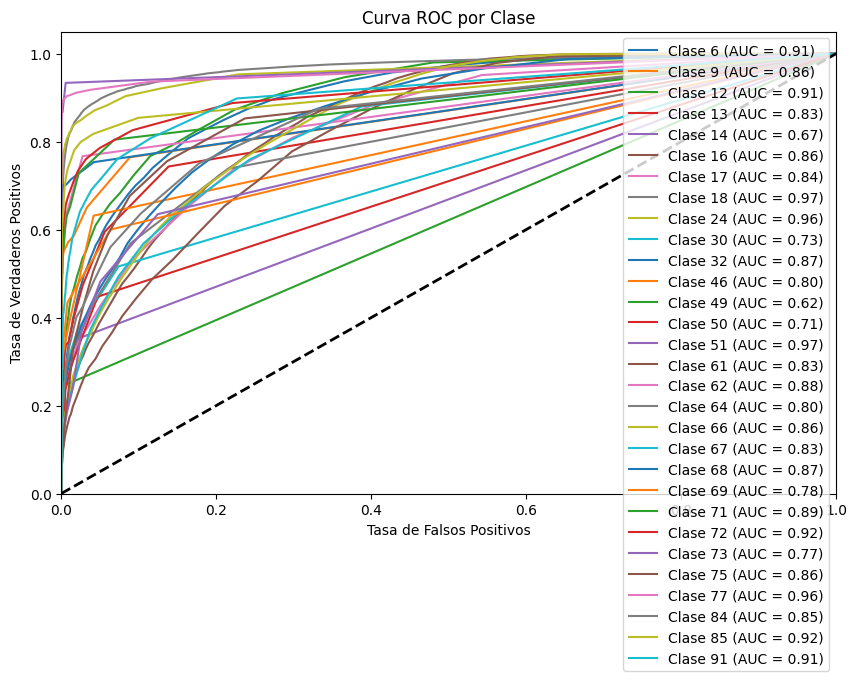

Precisión para la clase Clase 6: 0.53
Precisión para la clase Clase 9: 0.41
Precisión para la clase Clase 12: 0.36
Precisión para la clase Clase 13: 0.08
Precisión para la clase Clase 14: 0.00
Precisión para la clase Clase 16: 0.86
Precisión para la clase Clase 17: 0.21
Precisión para la clase Clase 18: 0.89
Precisión para la clase Clase 24: 0.76
Precisión para la clase Clase 30: 0.08
Precisión para la clase Clase 32: 0.47
Precisión para la clase Clase 46: 0.05
Precisión para la clase Clase 49: 0.00
Precisión para la clase Clase 50: 0.00
Precisión para la clase Clase 51: 0.67
Precisión para la clase Clase 61: 0.11
Precisión para la clase Clase 62: 0.33
Precisión para la clase Clase 64: 0.07
Precisión para la clase Clase 66: 0.25
Precisión para la clase Clase 67: 0.08
Precisión para la clase Clase 68: 0.33
Precisión para la clase Clase 69: 0.05
Precisión para la clase Clase 71: 0.33
Precisión para la clase Clase 72: 0.50
Precisión para la clase Clase 73: 0.03
Precisión para la clase Cla

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Datasetsolo16.copy()

X = df.drop(['segmento', 'Dataset', 'Activity'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo en el conjunto de entrenamiento
rf_classifier.fit(X_train, y_train)

joblib.dump(rf_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/randomforestsolo16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = rf_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

########################3 Calcular el AUC (Área bajo la curva ROC)#############################################################3
y_prob = rf_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#############################33# Calcular la puntuación F1######################################################################33
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Ramdom_forest_batch_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')

#####Random

Con esta prueba y otras que no se muestran corroboramos que randomizar no afecta en Batch. debido a que toma todo el dataset para su aprendizaje.

In [ ]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.ensemble import RandomForestClassifier

np.random.seed(30)

df = Datasetsolo16.sample(frac=1)

X = df.drop(['Activity'], axis=1)
y = df['Activity']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

modelo = RandomForestClassifier(n_estimators=100, random_state=42)

# Realizar validación cruzada
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)  # Aquí usamos StratifiedKFold para mantener la proporción de clases en cada fold

# Especifica las métricas que deseas evaluar durante la validación cruzada
scoring = {'accuracy': 'accuracy', 'precision': 'precision_weighted', 'roc_auc': 'roc_auc_ovo_weighted', 'f1': 'f1_weighted'}

# Realiza la validación cruzada y almacena los resultados en un diccionario
cv_results = cross_validate(modelo, X_train, y_train, cv=cv, scoring=scoring)

# Imprime los resultados promediados de las métricas
print(f'Accuracy promedio: {np.mean(cv_results["test_accuracy"]):.2f}')
print(f'Precision promedio: {np.mean(cv_results["test_precision"]):.2f}')
print(f'AUC promedio: {np.mean(cv_results["test_roc_auc"]):.2f}')
print(f'F1-score promedio: {np.mean(cv_results["test_f1"]):.2f}')

# Ajusta el modelo en todo el conjunto de entrenamiento (si lo deseas)
modelo.fit(X_train, y_train)

# Realiza predicciones en el conjunto de prueba
y_pred = modelo.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

Accuracy promedio: 0.64
Precision promedio: 0.66
AUC promedio: 0.85
F1-score promedio: 0.60


### (Batch) Naive Bayes (No es apto)

Hicimos un acercamiento con este algoritmo, sin embargo después de varios intentos no se logró obtener un resultado, llegando a la conclusión que no era apto, además se usa en casos donde los datos son discretos, lo que no es nuestro caso, por lo que mejor usamos Gaussian Naive Bayes, auqneu esto solo como prueba debido a que nuestros datos no siguen una distribución normal, aunque si son continuos, por lo que veremos que pasa

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset', 'Activity'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

nb_classifier = MultinomialNB()

# Entrena el modelo en el conjunto de entrenamiento
nb_classifier.fit(X_train, y_train)

# Realiza predicciones en el conjunto de prueba
y_pred_nb = nb_classifier.predict(X_test)

# Calcular la precisión del modelo
accuracy_nb = accuracy_score(y_test, y_pred_nb)
print(f'Precisión del modelo (Naive Bayes): {accuracy_nb:.2f}')

# Calcular la precisión del modelo
precision_nb = precision_score(y_test, y_pred_nb, average='weighted')
print(f'Precisión del modelo (Naive Bayes): {precision_nb:.2f}')

# Calcular la puntuación F1
f1_nb = f1_score(y_test, y_pred_nb, average='weighted')
print(f'F1-score del modelo (Naive Bayes): {f1_nb:.2f}')

# Calcular la curva ROC y trazarla

# Obtener las probabilidades de predicción del clasificador Naive Bayes
y_prob_nb = nb_classifier.predict_proba(X_test)

# Calcular la curva ROC y AUC para Naive Bayes
fpr_nb, tpr_nb, _ = roc_curve(y_test, y_prob_nb[:, 1], pos_label=1)  # Utiliza las probabilidades de la clase positiva

# Calcular el AUC para Naive Bayes
auc_nb = auc(fpr_nb, tpr_nb)
print(f'AUC del modelo (Naive Bayes): {auc_nb:.2f}')
# Trazar la curva ROC para Naive Bayes
plt.figure(figsize=(8, 6))
plt.plot(fpr_nb, tpr_nb, lw=2, label=f'Naive Bayes (AUC = {auc_nb:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC (Naive Bayes)')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_batch.png', dpi=300, bbox_inches='tight')
plt.show()

ValueError: ignored

### (Batch) GaussianNB '/

####Dataset completo

Precisión del modelo: 0.11
Precisión del modelo: 0.19
F1-score del modelo: 0.06


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


AUC del modelo: 0.73


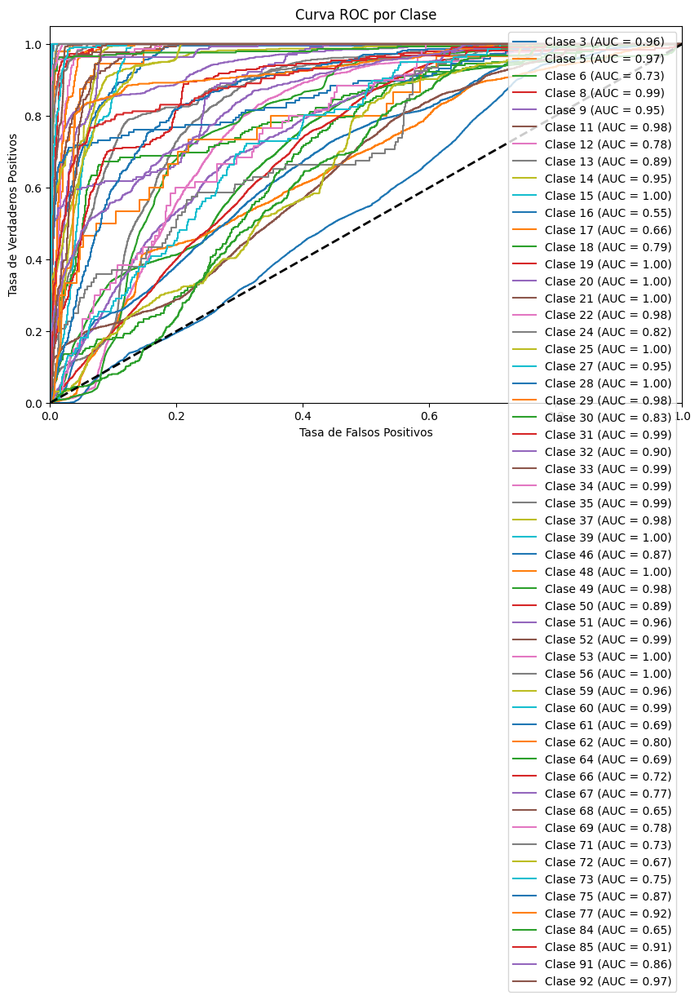

Precisión para la clase Clase 3: 0.21
Precisión para la clase Clase 5: 0.04
Precisión para la clase Clase 6: 0.00
Precisión para la clase Clase 8: 0.65
Precisión para la clase Clase 9: 0.02
Precisión para la clase Clase 11: 0.43
Precisión para la clase Clase 12: 0.00
Precisión para la clase Clase 13: 0.05
Precisión para la clase Clase 14: 0.13
Precisión para la clase Clase 15: 0.92
Precisión para la clase Clase 16: 0.00
Precisión para la clase Clase 17: 0.01
Precisión para la clase Clase 18: 0.01
Precisión para la clase Clase 19: 0.84
Precisión para la clase Clase 20: 0.12
Precisión para la clase Clase 21: 0.97
Precisión para la clase Clase 22: 0.18
Precisión para la clase Clase 24: 0.04
Precisión para la clase Clase 25: 0.92
Precisión para la clase Clase 27: 0.12
Precisión para la clase Clase 28: 0.77
Precisión para la clase Clase 29: 0.17
Precisión para la clase Clase 30: 0.10
Precisión para la clase Clase 31: 0.50
Precisión para la clase Clase 32: 0.13
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize
import joblib

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

gnb_classifier = GaussianNB()

# Entrenar el modelo en el conjunto de entrenamiento
gnb_classifier.fit(X_train, y_train)

joblib.dump(gnb_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/gaussianNB.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = gnb_classifier.predict(X_test)

# Calcular el accuracy del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

#Accuracy por cada clase
class_accuracy = accuracy_score(y_test, y_pred, normalize=False)

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')


# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = gnb_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/GaussianNB.png', dpi=300, bbox_inches='tight')
plt.show()


class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


#####Validación cruzada

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
import joblib
from sklearn.model_selection import cross_val_score


df = Dataset.copy()

X = df.drop(['Activity','segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X = X.fillna(0)

sss = StratifiedShuffleSplit(n_splits=10, test_size=0.3, random_state=42)

# Creamos un clasificador de árbol de decisión
modelo = GaussianNB()

# Realizamos la validación cruzada estratificada
scores = cross_val_score(modelo, X, y, cv=sss, scoring='accuracy')

# Imprime los resultados de validación cruzada
print("Resultados de Validación Cruzada:")
print("Puntuaciones por pliegue:", scores)
print("Precisión promedio:", scores.mean())

# Entrenar el modelo en el conjunto de entrenamiento
modelo.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_dt = modelo.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Precisión del modelo (Decision Tree): {accuracy_dt:.2f}')

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

class_f1_scores = {}

for class_val in unique_classes:
    mask = y_test == class_val
    f1 = f1_score(y_test[mask], y_pred_dt[mask], average=None)
    class_f1_scores[class_val] = f1

# Imprimir el puntaje F1 de cada clase
for class_val, f1_array in class_f1_scores.items():
    class_name = class_names[class_val]
    f1_mean = f1_array.mean()
    print(f'Puntaje F1 para la clase {class_name}: {f1_mean:.2f}')

Resultados de Validación Cruzada:
Puntuaciones por pliegue: [0.11206885 0.1155139  0.11395177 0.11421677 0.11357518 0.11262675
 0.11420283 0.11430046 0.11244543 0.11388203]
Precisión promedio: 0.1136783965856312
Precisión del modelo (Decision Tree): 0.11
Puntaje F1 para la clase Clase 3: 0.01
Puntaje F1 para la clase Clase 5: 0.01
Puntaje F1 para la clase Clase 6: 0.00
Puntaje F1 para la clase Clase 8: 0.09
Puntaje F1 para la clase Clase 9: 0.00
Puntaje F1 para la clase Clase 11: 0.05
Puntaje F1 para la clase Clase 12: 0.00
Puntaje F1 para la clase Clase 13: 0.00
Puntaje F1 para la clase Clase 14: 0.01
Puntaje F1 para la clase Clase 15: 0.32
Puntaje F1 para la clase Clase 16: 0.00
Puntaje F1 para la clase Clase 17: 0.00
Puntaje F1 para la clase Clase 18: 0.00
Puntaje F1 para la clase Clase 19: 0.46
Puntaje F1 para la clase Clase 20: 0.07
Puntaje F1 para la clase Clase 21: 0.49
Puntaje F1 para la clase Clase 22: 0.04
Puntaje F1 para la clase Clase 24: 0.00
Puntaje F1 para la clase Clase

####Prueba quitando el 16

Precisión del modelo: 0.35
Precisión del modelo: 0.47
F1-score del modelo: 0.31
AUC del modelo: 0.90


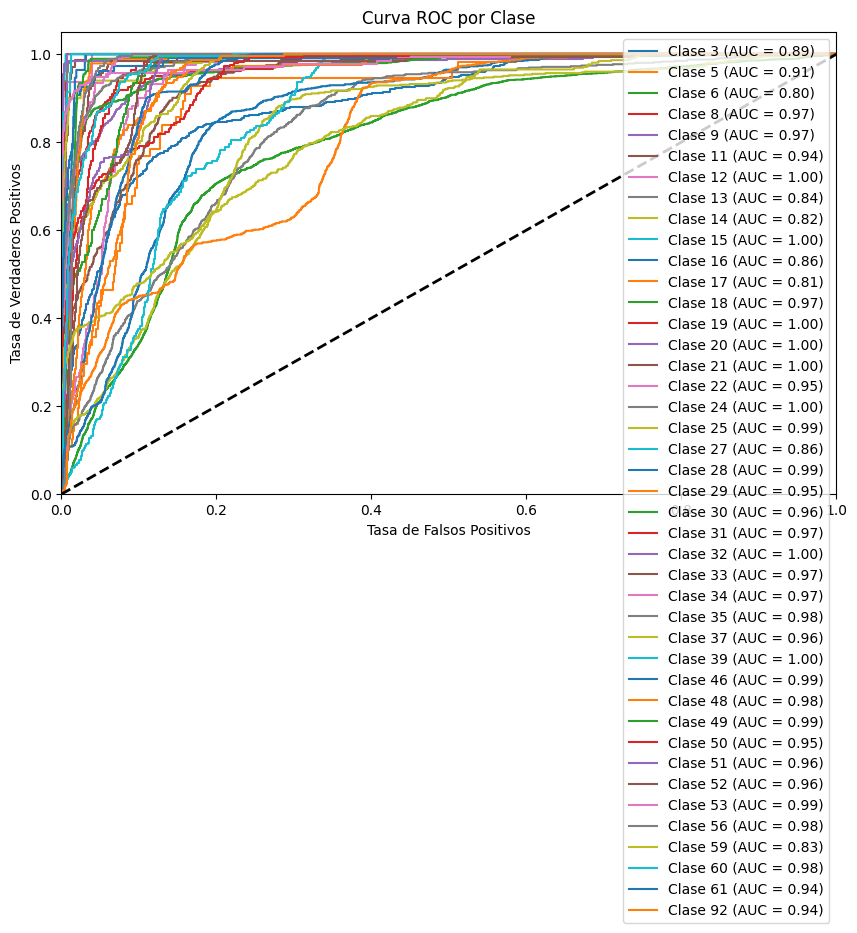

Precisión para la clase Clase 3: 0.20
Precisión para la clase Clase 5: 0.29
Precisión para la clase Clase 6: 0.01
Precisión para la clase Clase 8: 0.59
Precisión para la clase Clase 9: 0.18
Precisión para la clase Clase 11: 0.67
Precisión para la clase Clase 12: 0.81
Precisión para la clase Clase 13: 0.12
Precisión para la clase Clase 14: 0.14
Precisión para la clase Clase 15: 0.85
Precisión para la clase Clase 16: 0.14
Precisión para la clase Clase 17: 0.19
Precisión para la clase Clase 18: 0.86
Precisión para la clase Clase 19: 0.84
Precisión para la clase Clase 20: 0.12
Precisión para la clase Clase 21: 0.76
Precisión para la clase Clase 22: 0.18
Precisión para la clase Clase 24: 0.90
Precisión para la clase Clase 25: 0.76
Precisión para la clase Clase 27: 0.10
Precisión para la clase Clase 28: 0.64
Precisión para la clase Clase 29: 0.23
Precisión para la clase Clase 30: 0.29
Precisión para la clase Clase 31: 0.61
Precisión para la clase Clase 32: 0.86
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Datasetsin16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

gnb_classifier = GaussianNB()

# Entrenar el modelo en el conjunto de entrenamiento
gnb_classifier.fit(X_train, y_train)

joblib.dump(gnb_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/gaussianNBsin16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = gnb_classifier.predict(X_test)

# Calcular el accuracy del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

#Accuracy por cada clase
class_accuracy = accuracy_score(y_test, y_pred, normalize=False)

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')


# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = gnb_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/GaussianNB_sin_16.png', dpi=300, bbox_inches='tight')
plt.show()


class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


####Prueba solo el 16

Precisión del modelo: 0.08
Precisión del modelo: 0.21
F1-score del modelo: 0.03


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


AUC del modelo: 0.68


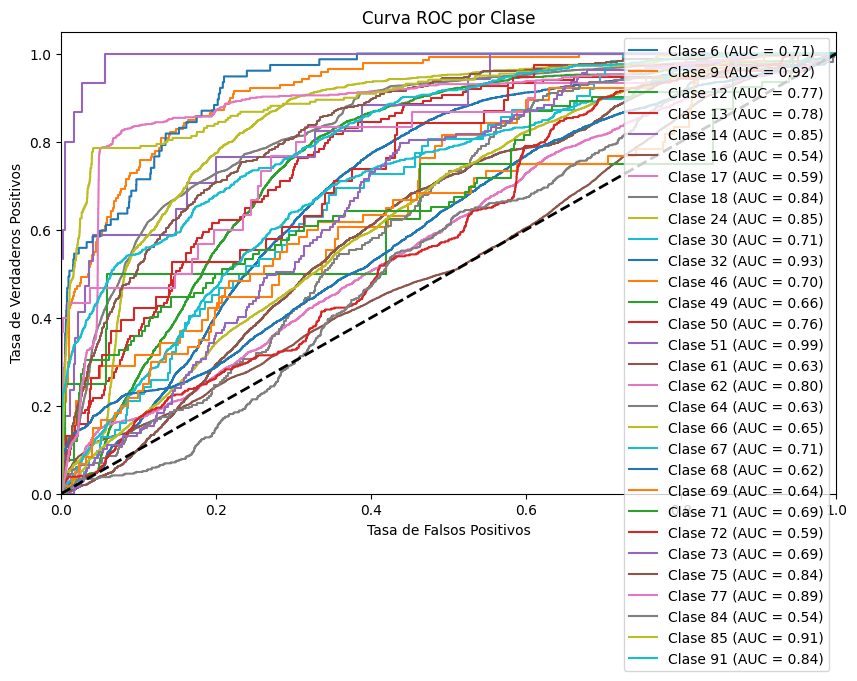

Precisión para la clase Clase 6: 0.00
Precisión para la clase Clase 9: 0.00
Precisión para la clase Clase 12: 0.00
Precisión para la clase Clase 13: 0.09
Precisión para la clase Clase 14: 0.18
Precisión para la clase Clase 16: 0.00
Precisión para la clase Clase 17: 0.01
Precisión para la clase Clase 18: 0.00
Precisión para la clase Clase 24: 0.03
Precisión para la clase Clase 30: 0.00
Precisión para la clase Clase 32: 0.57
Precisión para la clase Clase 46: 0.13
Precisión para la clase Clase 49: 0.25
Precisión para la clase Clase 50: 0.05
Precisión para la clase Clase 51: 0.80
Precisión para la clase Clase 61: 0.00
Precisión para la clase Clase 62: 0.43
Precisión para la clase Clase 64: 0.04
Precisión para la clase Clase 66: 0.51
Precisión para la clase Clase 67: 0.09
Precisión para la clase Clase 68: 0.08
Precisión para la clase Clase 69: 0.10
Precisión para la clase Clase 71: 0.07
Precisión para la clase Clase 72: 0.00
Precisión para la clase Clase 73: 0.03
Precisión para la clase Cla

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Datasetsolo16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

gnb_classifier = GaussianNB()

# Entrenar el modelo en el conjunto de entrenamiento
gnb_classifier.fit(X_train, y_train)

joblib.dump(gnb_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/gaussianNBsolo16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = gnb_classifier.predict(X_test)

# Calcular el accuracy del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

#Accuracy por cada clase
class_accuracy = accuracy_score(y_test, y_pred, normalize=False)

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')


# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = gnb_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/GaussianNB_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')

###(Batch) SVM

Desgraciadamente el SVM nunca compilo, llegamos a esperar más de 15 horas, pero colab se caia antes de mostrar resultados, y en nuestros PCs algo similar

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset', 'Activity'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

# Crear una instancia del clasificador SVM
svm_classifier = SVC(probability=True, random_state=42)

# Entrenar el modelo en el conjunto de entrenamiento
svm_classifier.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = svm_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

# Calcular el AUC (Área bajo la curva ROC)
y_prob = svm_classifier.predict_proba(X_test)

# Calcular el AUC
auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

# Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

# Calcular la curva ROC y trazarla
# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates)
fpr = dict()
tpr = dict()
roc_auc = dict()

# Calcular para cada clase
for i in range(len(np.unique(y_test))):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Trazar la curva ROC para cada clase
plt.figure(figsize=(8, 6))
for i in range(len(np.unique(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Clase {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/SVM_batch.png', dpi=300, bbox_inches='tight')
plt.show()


###(Batch)KNN

####Con el Dataset completo

Accuracy del modelo: 0.53
Precisión del modelo: 0.52
F1-score del modelo: 0.51
AUC del modelo: 0.81


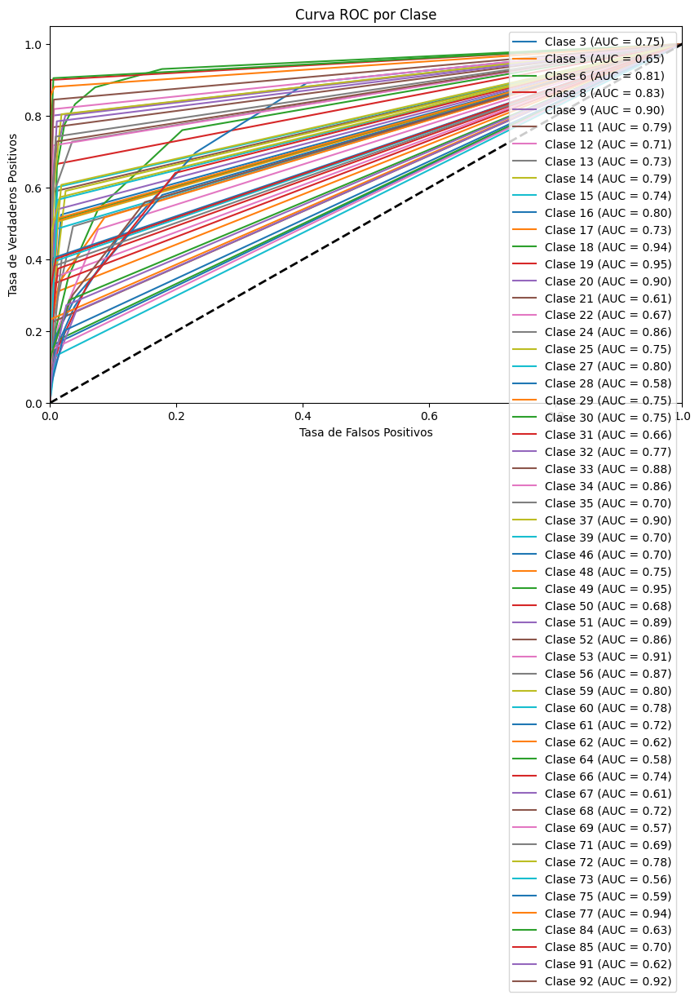

Precisión para la clase Clase 3: 0.29
Precisión para la clase Clase 5: 0.02
Precisión para la clase Clase 6: 0.58
Precisión para la clase Clase 8: 0.50
Precisión para la clase Clase 9: 0.64
Precisión para la clase Clase 11: 0.33
Precisión para la clase Clase 12: 0.22
Precisión para la clase Clase 13: 0.17
Precisión para la clase Clase 14: 0.21
Precisión para la clase Clase 15: 0.08
Precisión para la clase Clase 16: 0.67
Precisión para la clase Clase 17: 0.30
Precisión para la clase Clase 18: 0.85
Precisión para la clase Clase 19: 0.42
Precisión para la clase Clase 20: 0.34
Precisión para la clase Clase 21: 0.06
Precisión para la clase Clase 22: 0.03
Precisión para la clase Clase 24: 0.56
Precisión para la clase Clase 25: 0.16
Precisión para la clase Clase 27: 0.32
Precisión para la clase Clase 28: 0.04
Precisión para la clase Clase 29: 0.14
Precisión para la clase Clase 30: 0.30
Precisión para la clase Clase 31: 0.05
Precisión para la clase Clase 32: 0.22
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Entrenar el modelo en el conjunto de entrenamiento
knn_classifier.fit(X_train, y_train)

joblib.dump(knn_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/knn.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = knn_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')


# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = knn_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


#####Validación cruzada

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
import joblib
from sklearn.model_selection import cross_val_score


df = Dataset.copy()
# Supongamos que tienes tus datos en el DataFrame 'df'
X = df.drop(['Activity','segmento', 'Dataset'], axis=1) # Features de acelerómetro y giroscopio
y = df['Activity']  # Variable objetivo

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X = X.fillna(0)

sss = StratifiedShuffleSplit(n_splits=10, test_size=0.3, random_state=42)

# Creamos un clasificador de árbol de decisión
modelo = KNeighborsClassifier(n_neighbors=5)
# Realizamos la validación cruzada estratificada
scores = cross_val_score(modelo, X, y, cv=sss, scoring='accuracy')

# Imprime los resultados de validación cruzada
print("Resultados de Validación Cruzada:")
print("Puntuaciones por pliegue:", scores)
print("Precisión promedio:", scores.mean())

# Entrenar el modelo en el conjunto de entrenamiento
modelo.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_dt = modelo.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f'Precisión del modelo (KNN): {accuracy_dt:.2f}')

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

class_f1_scores = {}

for class_val in unique_classes:
    mask = y_test == class_val
    f1 = f1_score(y_test[mask], y_pred_dt[mask], average=None)
    class_f1_scores[class_val] = f1

# Imprimir el puntaje F1 de cada clase
for class_val, f1_array in class_f1_scores.items():
    class_name = class_names[class_val]
    f1_mean = f1_array.mean()
    print(f'Puntaje F1 para la clase {class_name}: {f1_mean:.2f}')

Resultados de Validación Cruzada:
Puntuaciones por pliegue: [0.53528042 0.53516884 0.53769335 0.53581042 0.53806993 0.53854415
 0.5376794  0.53759572 0.53786072 0.5350712 ]
Precisión promedio: 0.536877414675649
Precisión del modelo (KNN): 0.53
Puntaje F1 para la clase Clase 3: 0.02
Puntaje F1 para la clase Clase 5: 0.00
Puntaje F1 para la clase Clase 6: 0.01
Puntaje F1 para la clase Clase 8: 0.03
Puntaje F1 para la clase Clase 9: 0.03
Puntaje F1 para la clase Clase 11: 0.02
Puntaje F1 para la clase Clase 12: 0.01
Puntaje F1 para la clase Clase 13: 0.01
Puntaje F1 para la clase Clase 14: 0.01
Puntaje F1 para la clase Clase 15: 0.02
Puntaje F1 para la clase Clase 16: 0.02
Puntaje F1 para la clase Clase 17: 0.01
Puntaje F1 para la clase Clase 18: 0.03
Puntaje F1 para la clase Clase 19: 0.12
Puntaje F1 para la clase Clase 20: 0.06
Puntaje F1 para la clase Clase 21: 0.01
Puntaje F1 para la clase Clase 22: 0.00
Puntaje F1 para la clase Clase 24: 0.03
Puntaje F1 para la clase Clase 25: 0.04
P

####Prueba quitando el 16

Accuracy del modelo: 0.51
Precisión del modelo: 0.51
F1-score del modelo: 0.50
AUC del modelo: 0.85


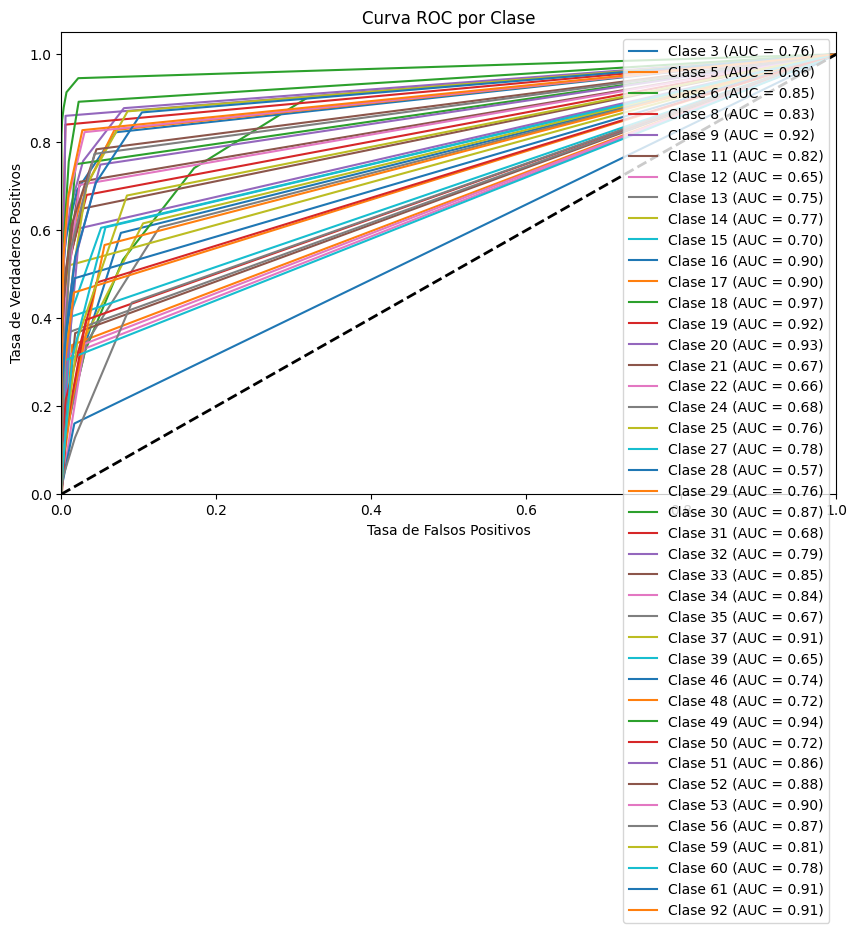

Precisión para la clase Clase 3: 0.33
Precisión para la clase Clase 5: 0.05
Precisión para la clase Clase 6: 0.75
Precisión para la clase Clase 8: 0.50
Precisión para la clase Clase 9: 0.71
Precisión para la clase Clase 11: 0.38
Precisión para la clase Clase 12: 0.00
Precisión para la clase Clase 13: 0.24
Precisión para la clase Clase 14: 0.25
Precisión para la clase Clase 15: 0.10
Precisión para la clase Clase 16: 0.66
Precisión para la clase Clase 17: 0.61
Precisión para la clase Clase 18: 0.89
Precisión para la clase Clase 19: 0.46
Precisión para la clase Clase 20: 0.28
Precisión para la clase Clase 21: 0.06
Precisión para la clase Clase 22: 0.05
Precisión para la clase Clase 24: 0.02
Precisión para la clase Clase 25: 0.12
Precisión para la clase Clase 27: 0.33
Precisión para la clase Clase 28: 0.02
Precisión para la clase Clase 29: 0.18
Precisión para la clase Clase 30: 0.40
Precisión para la clase Clase 31: 0.12
Precisión para la clase Clase 32: 0.21
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Datasetsin16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Entrenar el modelo en el conjunto de entrenamiento
knn_classifier.fit(X_train, y_train)

joblib.dump(knn_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/knnsin16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = knn_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')


# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = knn_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_sin_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


####Prueba solo el 16

Accuracy del modelo: 0.55
Precisión del modelo: 0.53
F1-score del modelo: 0.53


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


AUC del modelo: 0.79


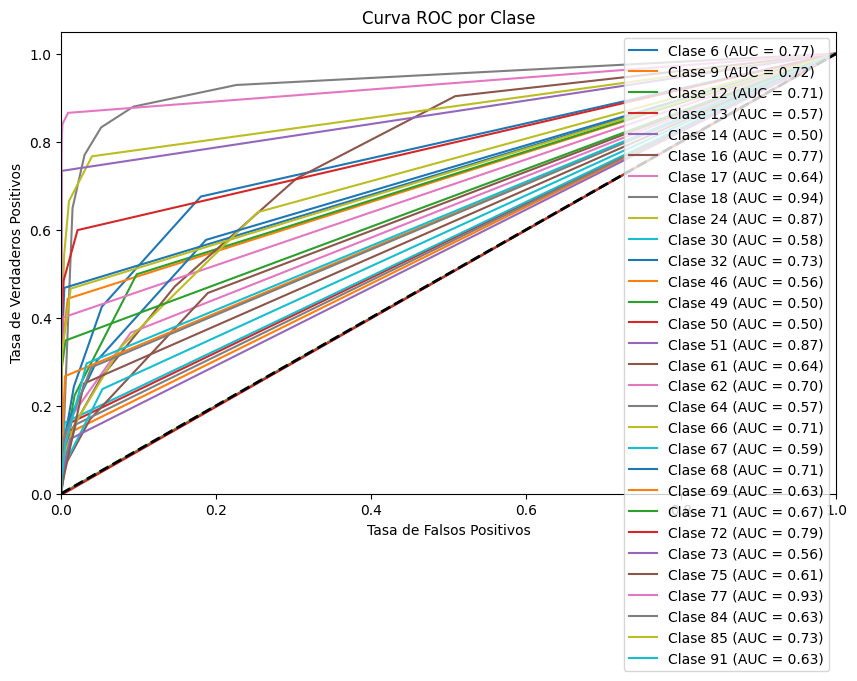

Precisión para la clase Clase 6: 0.48
Precisión para la clase Clase 9: 0.28
Precisión para la clase Clase 12: 0.23
Precisión para la clase Clase 13: 0.06
Precisión para la clase Clase 14: 0.00
Precisión para la clase Clase 16: 0.68
Precisión para la clase Clase 17: 0.15
Precisión para la clase Clase 18: 0.85
Precisión para la clase Clase 24: 0.62
Precisión para la clase Clase 30: 0.08
Precisión para la clase Clase 32: 0.21
Precisión para la clase Clase 46: 0.00
Precisión para la clase Clase 49: 0.00
Precisión para la clase Clase 50: 0.00
Precisión para la clase Clase 51: 0.20
Precisión para la clase Clase 61: 0.11
Precisión para la clase Clase 62: 0.30
Precisión para la clase Clase 64: 0.01
Precisión para la clase Clase 66: 0.22
Precisión para la clase Clase 67: 0.05
Precisión para la clase Clase 68: 0.23
Precisión para la clase Clase 69: 0.02
Precisión para la clase Clase 71: 0.21
Precisión para la clase Clase 72: 0.44
Precisión para la clase Clase 73: 0.01
Precisión para la clase Cla

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Datasetsolo16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Entrenar el modelo en el conjunto de entrenamiento
knn_classifier.fit(X_train, y_train)

joblib.dump(knn_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/knnsolo16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = knn_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')


# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = knn_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


###(Batch)Regresión logistica

####Dataset completo

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precisión del modelo: 0.44
Precisión del modelo: 0.32
F1-score del modelo: 0.35
AUC del modelo: 0.81


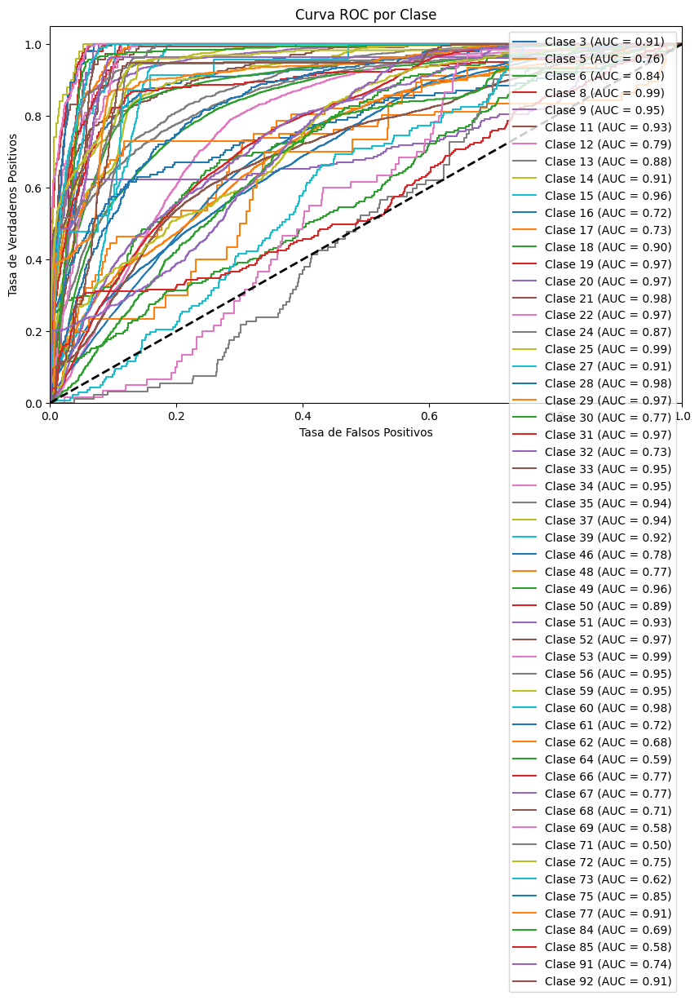

Precisión para la clase Clase 3: 0.03
Precisión para la clase Clase 5: 0.00
Precisión para la clase Clase 6: 0.58
Precisión para la clase Clase 8: 0.23
Precisión para la clase Clase 9: 0.05
Precisión para la clase Clase 11: 0.00
Precisión para la clase Clase 12: 0.00
Precisión para la clase Clase 13: 0.15
Precisión para la clase Clase 14: 0.12
Precisión para la clase Clase 15: 0.00
Precisión para la clase Clase 16: 0.70
Precisión para la clase Clase 17: 0.01
Precisión para la clase Clase 18: 0.86
Precisión para la clase Clase 19: 0.00
Precisión para la clase Clase 20: 0.00
Precisión para la clase Clase 21: 0.00
Precisión para la clase Clase 22: 0.00
Precisión para la clase Clase 24: 0.26
Precisión para la clase Clase 25: 0.04
Precisión para la clase Clase 27: 0.00
Precisión para la clase Clase 28: 0.00
Precisión para la clase Clase 29: 0.02
Precisión para la clase Clase 30: 0.00
Precisión para la clase Clase 31: 0.00
Precisión para la clase Clase 32: 0.00
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Dataset.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

lr_classifier = LogisticRegression(max_iter=1000, random_state=42)

# Train the model on the training set
lr_classifier.fit(X_train, y_train)

joblib.dump(lr_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/LogisticRegression.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = lr_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = lr_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/LogisticRegression.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')



####Prueba quitando el 16

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precisión del modelo: 0.43
Precisión del modelo: 0.39
F1-score del modelo: 0.36
AUC del modelo: 0.91


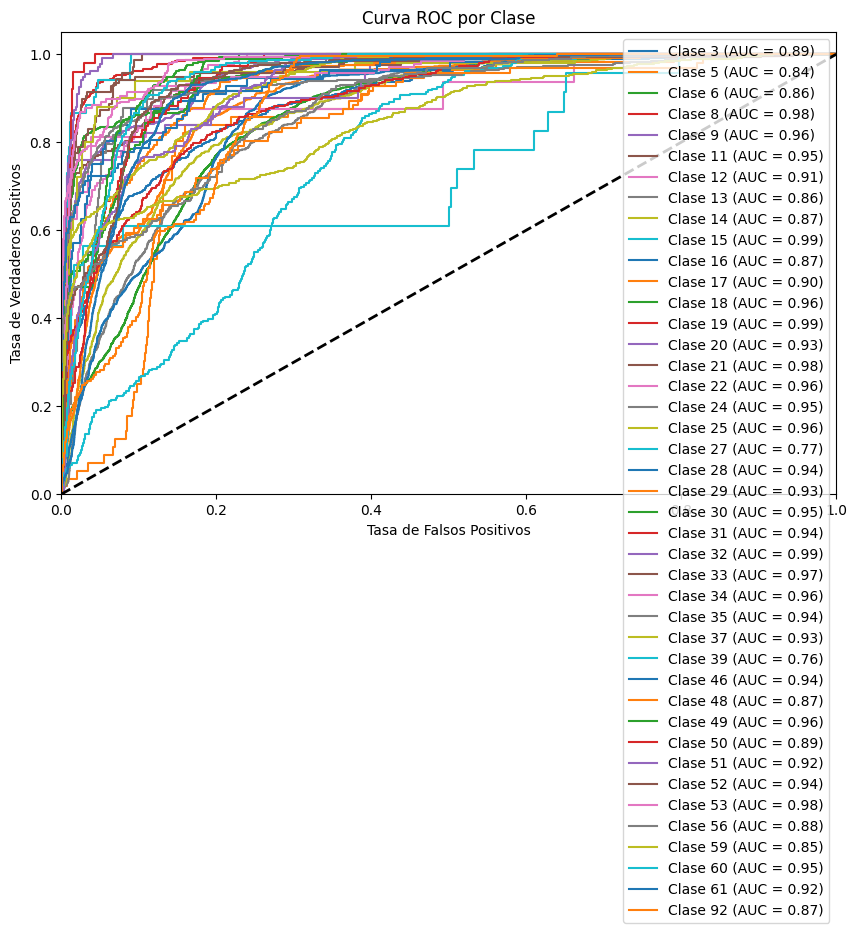

Precisión para la clase Clase 3: 0.23
Precisión para la clase Clase 5: 0.00
Precisión para la clase Clase 6: 0.89
Precisión para la clase Clase 8: 0.65
Precisión para la clase Clase 9: 0.71
Precisión para la clase Clase 11: 0.45
Precisión para la clase Clase 12: 0.00
Precisión para la clase Clase 13: 0.04
Precisión para la clase Clase 14: 0.12
Precisión para la clase Clase 15: 0.00
Precisión para la clase Clase 16: 0.18
Precisión para la clase Clase 17: 0.20
Precisión para la clase Clase 18: 0.84
Precisión para la clase Clase 19: 0.00
Precisión para la clase Clase 20: 0.00
Precisión para la clase Clase 21: 0.13
Precisión para la clase Clase 22: 0.00
Precisión para la clase Clase 24: 0.00
Precisión para la clase Clase 25: 0.12
Precisión para la clase Clase 27: 0.00
Precisión para la clase Clase 28: 0.00
Precisión para la clase Clase 29: 0.11
Precisión para la clase Clase 30: 0.14
Precisión para la clase Clase 31: 0.00
Precisión para la clase Clase 32: 0.15
Precisión para la clase Clase 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Datasetsin16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Iteramos a través de cada dataset único en la columna 'Dataset'
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

lr_classifier = LogisticRegression(max_iter=1000, random_state=42)

# Train the model on the training set
lr_classifier.fit(X_train, y_train)

joblib.dump(lr_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/LogisticRegressionsin16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = lr_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = lr_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/LogisticRegression_sin_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')



####Prueba solo el 16

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precisión del modelo: 0.47
Precisión del modelo: 0.34
F1-score del modelo: 0.37
AUC del modelo: 0.77


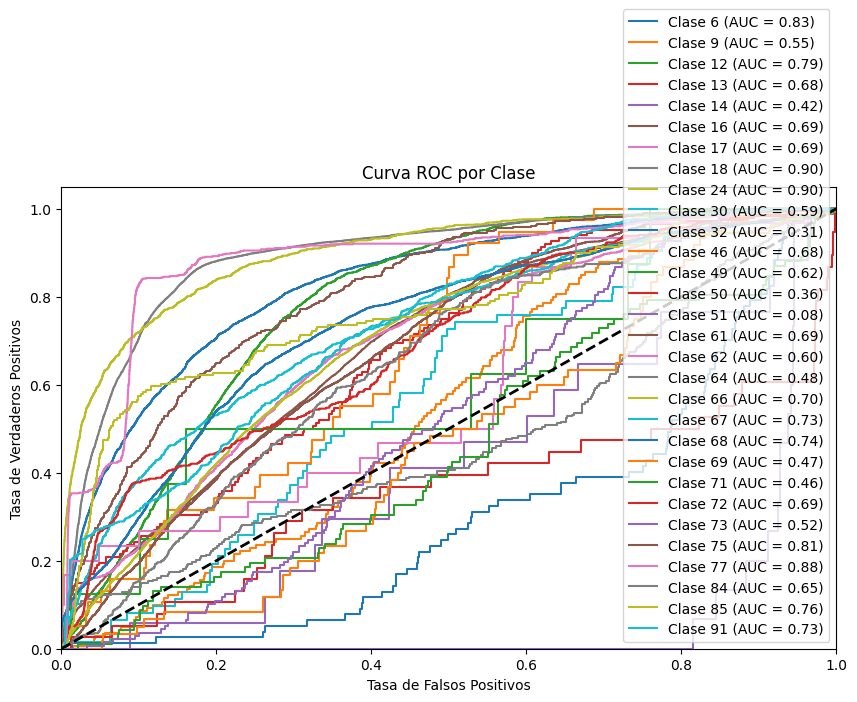

Precisión para la clase Clase 6: 0.19
Precisión para la clase Clase 9: 0.00
Precisión para la clase Clase 12: 0.00
Precisión para la clase Clase 13: 0.00
Precisión para la clase Clase 14: 0.00
Precisión para la clase Clase 16: 0.71
Precisión para la clase Clase 17: 0.00
Precisión para la clase Clase 18: 0.89
Precisión para la clase Clase 24: 0.03
Precisión para la clase Clase 30: 0.00
Precisión para la clase Clase 32: 0.00
Precisión para la clase Clase 46: 0.00
Precisión para la clase Clase 49: 0.00
Precisión para la clase Clase 50: 0.00
Precisión para la clase Clase 51: 0.00
Precisión para la clase Clase 61: 0.00
Precisión para la clase Clase 62: 0.00
Precisión para la clase Clase 64: 0.00
Precisión para la clase Clase 66: 0.00
Precisión para la clase Clase 67: 0.00
Precisión para la clase Clase 68: 0.07
Precisión para la clase Clase 69: 0.00
Precisión para la clase Clase 71: 0.00
Precisión para la clase Clase 72: 0.00
Precisión para la clase Clase 73: 0.00
Precisión para la clase Cla

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import label_binarize

df = Datasetsolo16.copy()

X = df.drop(['segmento', 'Dataset'], axis=1)
y = df['Activity']

# Creamos una instancia de StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


train_original_index = X.index.isin(X_train.index)
test_original_index = X.index.isin(X_test.index)

# Reorganiza X_train, X_test, y_train y y_test en base al índice original
X_train = X[train_original_index]
X_test = X[test_original_index]
y_train = y[train_original_index]
y_test = y[test_original_index]

# Rellena los valores NaN con ceros en los conjuntos de entrenamiento y prueba
X_train = X_train.fillna(0)
X_test = X_test.fillna(0)

X_train = X_train.drop(columns=['Activity'])
X_test = X_test.drop(columns=['Activity'])

lr_classifier = LogisticRegression(max_iter=1000, random_state=42)

# Train the model on the training set
lr_classifier.fit(X_train, y_train)

joblib.dump(lr_classifier, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos_Batch/LogisticRegressionsolo16.pkl')

# Realizar predicciones en el conjunto de prueba
y_pred = lr_classifier.predict(X_test)

# Calcular la precisión del modelo en el conjunto de prueba
accuracy = accuracy_score(y_test, y_pred)
print(f'Precisión del modelo: {accuracy:.2f}')

# Calcular la precisión del modelo
precision = precision_score(y_test, y_pred, average='weighted')
print(f'Precisión del modelo: {precision:.2f}')

#Calcular la puntuación F1
f1 = f1_score(y_test, y_pred, average='weighted')
print(f'F1-score del modelo: {f1:.2f}')

# Binariza las etiquetas para que sean adecuadas para roc_curve
y_bin = label_binarize(y_test, classes=list(np.unique(y_test)))

# Calcula las probabilidades de predicción
y_prob = lr_classifier.predict_proba(X_test)

#Calculo de AUC

auc_score = roc_auc_score(y_test, y_prob, average='weighted', multi_class='ovr')
print(f'AUC del modelo: {auc_score:.2f}')

#Calcular ROC

# Obtener las tasas de verdaderos positivos (True Positive Rates) y tasas de falsos positivos (False Positive Rates) para Decision Tree
fpr = dict()
tpr = dict()
roc_auc = dict()

# Trazar la curva ROC para Decision Tree

unique_classes = sorted(df['Activity'].unique())

# Crear un diccionario que asocie los valores únicos con nombres de clase
class_names = {class_val: f'Clase {class_val}' for class_val in unique_classes}

# Calcular para cada clase
for class_val in unique_classes:
    class_name = class_names[class_val]  # Obtener el nombre de la clase
    i = np.where(np.unique(y_test) == class_val)[0][0]  # Índice de la clase en las predicciones
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob[:, i], pos_label=class_val)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Después de calcular las curvas ROC para cada clase
plt.figure(figsize=(10, 6))

# Trazar las curvas ROC para cada clase
for i in range(len(np.unique(y_test))):
    class_name = class_names[unique_classes[i]]  # Obtener el nombre de la clase
    plt.plot(fpr[i], tpr[i], label=f'{class_name} (AUC = {roc_auc[i]:.2f})')

# Configurar el gráfico
plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Línea diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC por Clase')
plt.legend(loc='best')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/LogisticRegression_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

class_accuracy = {}

for class_val in unique_classes:
    mask = y_test == class_val
    accuracy = accuracy_score(y_test[mask], y_pred[mask])
    class_accuracy[class_val] = accuracy

# Imprimir la precisión de cada clase
for class_val, accuracy in class_accuracy.items():
    class_name = class_names[class_val]
    print(f'Precisión para la clase {class_name}: {accuracy:.2f}')


#--> **ALGORITMOS DE STREAM LEARNING**

In [ ]:
pip install joblib

In [ ]:
pip install -U scikit-multiflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.6/450.6 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-multiflow: filename=scikit_multiflow-0.5.3-cp310-cp310-linux_x86_64.whl size=1254678 sha256=c28007f13ccbea10adf9ae57b0cf5059810c426f5556fb123e31aa0642f57085
  Stored in directory: /root/.cache/pip/wheels/6e/1b/56/45b17a6cf203d98000a45976cb0dd0c4c3f11960e6a505f231
Successfully built scikit-multiflow


In [ ]:
pip install -U git+https://github.com/scikit-multiflow/scikit-multiflow

  Cloning https://github.com/scikit-multiflow/scikit-multiflow to /tmp/pip-req-build-xajdlebu
  Running command git clone --filter=blob:none --quiet https://github.com/scikit-multiflow/scikit-multiflow /tmp/pip-req-build-xajdlebu
  Resolved https://github.com/scikit-multiflow/scikit-multiflow to commit d073a706b5006cba2584761286b7fa17e74e87be
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-multiflow: filename=scikit_multiflow-0.6.dev0-cp310-cp310-linux_x86_64.whl size=1223134 sha256=dffb667dd60a102ce4475be6fd4a2265dd157285f234a68db0f5932c95411ce3
  Stored in directory: /tmp/pip-ephem-wheel-cache-6p0udoqa/wheels/6c/3b/bb/448d28745a0e3209c9347e3af9fdebfc8ff493e3bf0cebd6e0
Successfully built scikit-multiflow


In [ ]:
pip install -U numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 84.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.2 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.25.2 which is incompatible.


In [ ]:
pip install -U Cython

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 24.3 MB/s eta 0:00:00
  Attempting uninstall: Cython
    Found existing installation: Cython 0.29.36
    Uninstalling Cython-0.29.36:
      Successfully uninstalled Cython-0.29.36


In [ ]:
pip install -U scikit-multiflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.6/450.6 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-multiflow: filename=scikit_multiflow-0.5.3-cp310-cp310-linux_x86_64.whl size=1254675 sha256=54c73fbbedd807967ece08633c9a44ddc34a047945170ab158a255abfaa18a58
  Stored in directory: /root/.cache/pip/wheels/6e/1b/56/45b17a6cf203d98000a45976cb0dd0c4c3f11960e6a505f231
Successfully built scikit-multiflow


In [ ]:
pip install scikit-multiflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.6/450.6 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-multiflow: filename=scikit_multiflow-0.5.3-cp310-cp310-linux_x86_64.whl size=1254677 sha256=505b7ae80c558acced10d9b5e5e08366a4185ea87004af357aa47a309ff1d819
  Stored in directory: /root/.cache/pip/wheels/6e/1b/56/45b17a6cf203d98000a45976cb0dd0c4c3f11960e6a505f231
Successfully built scikit-multiflow


In [ ]:
pip install scikit-multiflow==0.4.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-multiflow: filename=scikit_multiflow-0.4.1-cp310-cp310-linux_x86_64.whl size=16265980 sha256=6c301d8c1de3a9f9097e3ed7c48ad4d7b433e6d39d301ca609428a58b7156e86
  Stored in directory: /root/.cache/pip/wheels/d6/b8/55/45e1d086e95e4d55798528acc03d16a1d71532922d3521cd04
Successfully built scikit-multiflow
  Attempting uninstall: scikit-multiflow
    Found existing installation: scikit-multiflow 0.5.3
    Uninstalling scikit-multiflow-0.5.3:
      Successfully uninstalled scikit-multiflow-0.5.3


In [ ]:
pip install scikit-multiflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.6/450.6 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-multiflow: filename=scikit_multiflow-0.5.3-cp310-cp310-linux_x86_64.whl size=1254679 sha256=a1daf61644232d46689857379eb9460f9e766bf71b7bb10156b4595ef09b2582
  Stored in directory: /root/.cache/pip/wheels/6e/1b/56/45b17a6cf203d98000a45976cb0dd0c4c3f11960e6a505f231
Successfully built scikit-multiflow


In [ ]:
pip install --upgrade scikit-multiflow

In [ ]:
pip install --upgrade matplotlib scikit-multiflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.3/98.3 kB 11.6 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1


### (Multiflow) Decision Tree

####Prueba con el dataset completo (COMPLETO)

238990 samples analyzed.
Hoeffding Tree accuracy: 0.7804426963471275
Precision: 0.6901455792317728
F1-score: 0.627617138390901


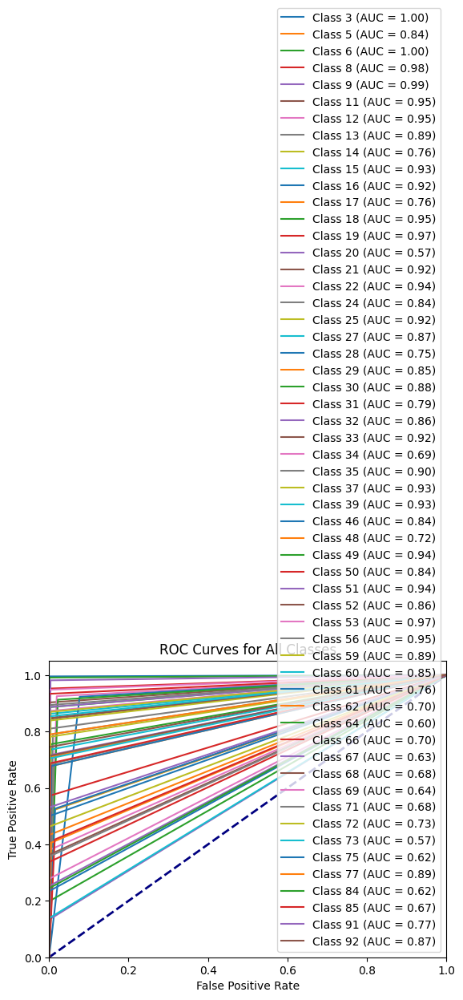

AUC for Class 0: 0.9974342822343305
AUC for Class 1: 0.8376968625481057
AUC for Class 2: 0.9952720627380851
AUC for Class 3: 0.9758095462539813
AUC for Class 4: 0.9888379757130152
AUC for Class 5: 0.9507351401024858
AUC for Class 6: 0.9528353094588893
AUC for Class 7: 0.8906472906846746
AUC for Class 8: 0.7572372566336802
AUC for Class 9: 0.9310344827586207
AUC for Class 10: 0.9228670967676292
AUC for Class 11: 0.755067112206534
AUC for Class 12: 0.9451890802600753
AUC for Class 13: 0.9663756586063715
AUC for Class 14: 0.5666666666666667
AUC for Class 15: 0.9221013696994681
AUC for Class 16: 0.9357784798189364
AUC for Class 17: 0.8376351267326068
AUC for Class 18: 0.9190632774138018
AUC for Class 19: 0.8665140986879439
AUC for Class 20: 0.7499916248607634
AUC for Class 21: 0.853950434444326
AUC for Class 22: 0.8750458678655941
AUC for Class 23: 0.7856145068589622
AUC for Class 24: 0.8570611272210014
AUC for Class 25: 0.9231582547164663
AUC for Class 26: 0.6897628486107307
AUC for Class

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np

df = Dataset.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)

ht = HoeffdingTreeClassifier()

n_samples = 0
correct_cnt = 0
max_samples = 250000

# Almacena las predicciones y etiquetas verdaderas
y_true = []
y_pred = []

while n_samples < max_samples and stream.has_more_samples():
    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print('{} samples analyzed.'.format(n_samples))
print('Hoeffding Tree accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

Corroboramos que lo que estamos haciendo es EvaluatePrequential

In [ ]:
from skmultiflow.trees import HoeffdingTree
from skmultiflow.data import DataStream
from skmultiflow.evaluation import EvaluatePrequential
import joblib
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

df = Dataset.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
data_stream = DataStream(df, target_idx=target_idx)

hoeffding_tree = HoeffdingTree()

evaluator = EvaluatePrequential(show_plot=False,
                                metrics =  ['accuracy', 'kappa', 'model_size', 'f1', 'recall', 'precision'],
                                max_samples=240000, batch_size=1)
evaluator.evaluate(stream=data_stream, model=hoeffding_tree)

##############################################################
# Crear una lista para almacenar las curvas ROC y los valores AUC de cada clase
roc_curves = []
auc_scores = []

# Obtener las etiquetas verdaderas y las predicciones del modelo para cada muestra en el flujo de datos
y_true = []
y_proba = []

for i in range(len(data_stream)):
    X, y = data_stream.next_sample()
    y_pred = hoeffding_tree.predict(X)
    y_true.append(y)
    y_proba.append(y_pred)

y_true = np.array(y_true)
y_proba = np.array(y_proba)

# Calcular el AUC y la curva ROC para cada clase
for class_idx in range(y_true.shape[1]):
    fpr, tpr, _ = roc_curve(y_true[:, class_idx], y_proba[:, class_idx])
    roc_curves.append((fpr, tpr))
    auc = roc_auc_score(y_true[:, class_idx], y_proba[:, class_idx])
    auc_scores.append(auc)

# Calcular el AUC promedio
average_auc = np.mean(auc_scores)

# Imprimir el AUC de cada clase y el AUC promedio
print("AUC de cada clase:", auc_scores)
print("AUC promedio:", average_auc)

# Graficar las curvas ROC de todas las clases
plt.figure(figsize=(8, 6))
for class_idx, (fpr, tpr) in enumerate(roc_curves):
    plt.plot(fpr, tpr, label=f'Clase {class_idx}')

plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC de todas las clases')
plt.legend()
plt.grid()
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_Tree_stream.png', dpi=300, bbox_inches='tight')
plt.show()

################################################################3

# Guardar el modelo entrenado
joblib.dump(hoeffding_tree, 'hoeffding_tree_model.pkl')


/usr/local/lib/python3.10/dist-packages/skmultiflow/trees/hoeffding_tree.py:34: FutureWarning: 'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0
  warnings.warn("'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.\n"


Prequential Evaluation
Evaluating 1 target(s).
Pre-training on 200 sample(s).
Evaluating...
 #################### [100%] [565.56s]
Processed samples: 238990
Mean performance:
M0 - Accuracy     : 0.7803
M0 - Kappa        : 0.7445
M0 - Precision: 0.6781
M0 - Recall: 0.6364
M0 - F1 score: 0.6168
M0 - Size (kB)          : 10451.5195


TypeError: ignored

Realizamos un primer acercamiento a como seria probar el modelo en otro conjunto de datos stream

In [ ]:
hoeffding_tree = joblib.load('hoeffding_tree_model.pkl')

target_idx = new_df.columns.get_loc("Activity")
nuevo_data_stream = DataStream(new_df, target_idx=target_idx)

evaluator.evaluate(stream=nuevo_data_stream, model=hoeffding_tree)

Prequential Evaluation
Evaluating 1 target(s).
Pre-training on 200 sample(s).
Evaluating...
 #################### [100%] [455.69s]
Processed samples: 89290
Mean performance:
M0 - Accuracy     : 0.3924
M0 - Kappa        : 0.3735


[HoeffdingTreeClassifier(binary_split=False, grace_period=200,
                         leaf_prediction='nba', max_byte_size=33554432,
                         memory_estimate_period=1000000, nb_threshold=0,
                         no_preprune=False, nominal_attributes=None,
                         remove_poor_atts=False, split_confidence=1e-07,
                         split_criterion='info_gain', stop_mem_management=False,
                         tie_threshold=0.05)]

####Prueba con el dataset completo

#####Entrenando con el 70 por ciento

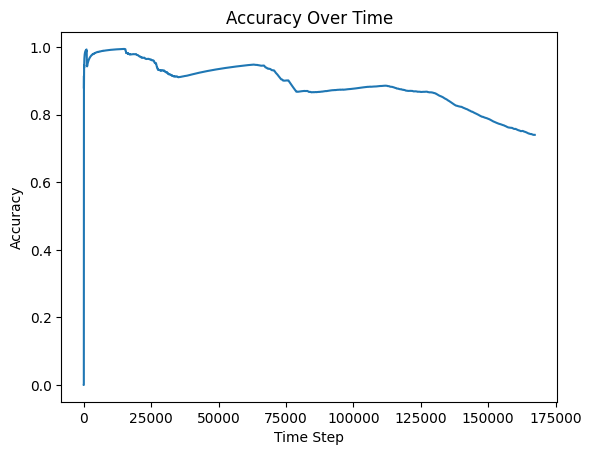

167266 samples analyzed.
Random Forest accuracy: 0.7401862901007975
Precision: 0.6844980143887913
F1-score: 0.5950546912821156


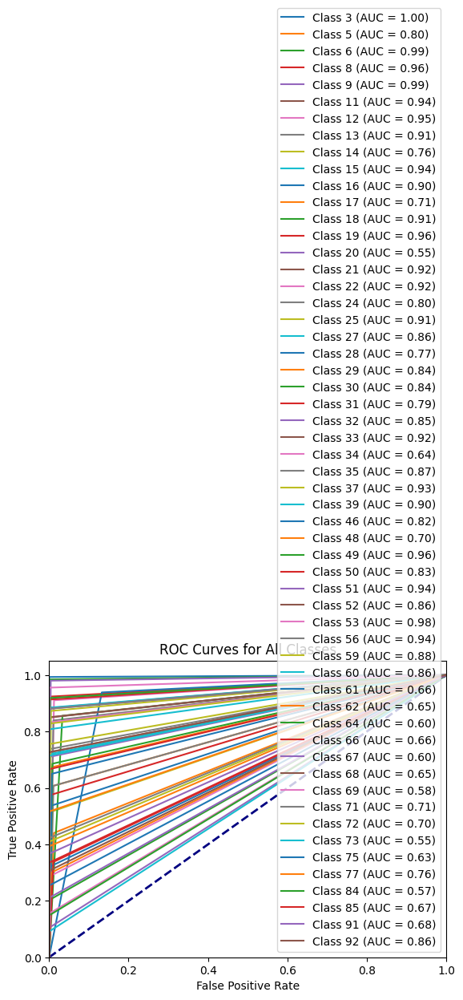

AUC for Class 0: 0.9963580249850523
AUC for Class 1: 0.8015117595891422
AUC for Class 2: 0.9912938862860217
AUC for Class 3: 0.9615884571679185
AUC for Class 4: 0.9879079896481805
AUC for Class 5: 0.9407206731023919
AUC for Class 6: 0.949008574351602
AUC for Class 7: 0.9140007686668601
AUC for Class 8: 0.7554535237954044
AUC for Class 9: 0.9421487603305785
AUC for Class 10: 0.9028195934894477
AUC for Class 11: 0.7141382627506866
AUC for Class 12: 0.9109428728308876
AUC for Class 13: 0.9562285910188472
AUC for Class 14: 0.5521739130434783
AUC for Class 15: 0.9245102853063961
AUC for Class 16: 0.915523478443873
AUC for Class 17: 0.7981952601381482
AUC for Class 18: 0.9136884070677792
AUC for Class 19: 0.858727023047808
AUC for Class 20: 0.7671695893318401
AUC for Class 21: 0.8350209076972419
AUC for Class 22: 0.838627753445134
AUC for Class 23: 0.7865253124391943
AUC for Class 24: 0.854109691797283
AUC for Class 25: 0.9245537802337387
AUC for Class 26: 0.6428062275801637
AUC for Class 27

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)

ht = HoeffdingTreeClassifier()

n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []

accuracy_history = []

while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(ht, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/hoeffdingtree_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Hoeffding_tree_stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Prueba con el 30 por ciento

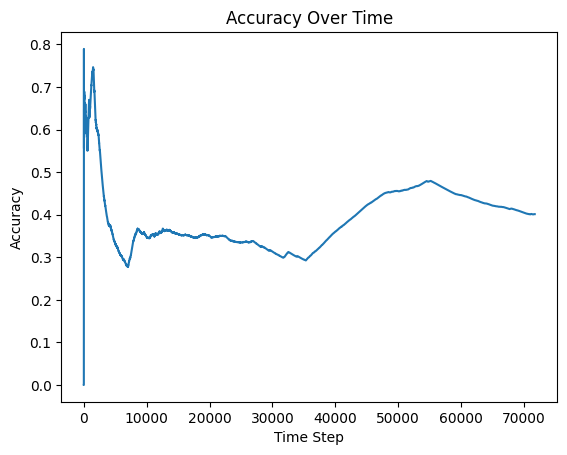

71724 samples analyzed.
Hoeffding Tree Forest accuracy: 0.4012743293737103
Precision: 0.3485948912506848
F1-score: 0.3722259091606389


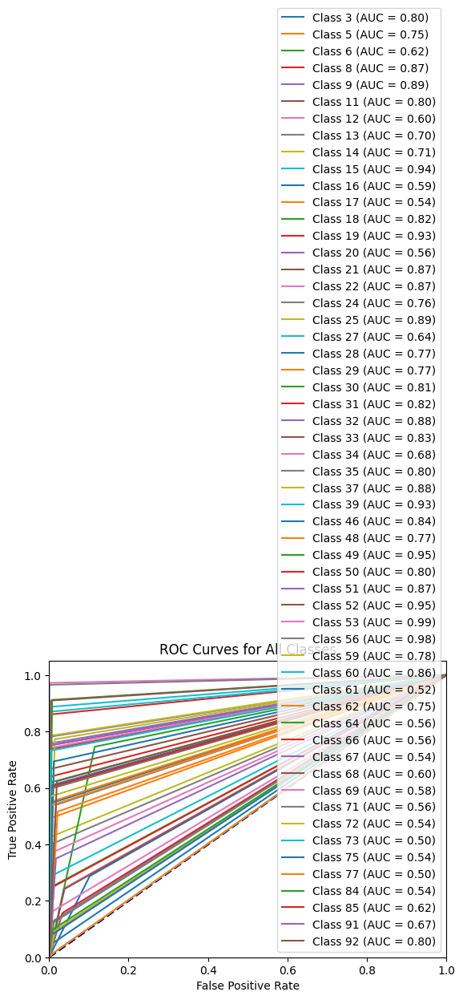

Average AUC (macro): 0.74
Accuracy for Class 3: 60.79%
Accuracy for Class 5: 49.12%
Accuracy for Class 6: 25.39%
Accuracy for Class 8: 73.67%
Accuracy for Class 9: 78.21%
Accuracy for Class 11: 59.58%
Accuracy for Class 12: 24.40%
Accuracy for Class 13: 40.42%
Accuracy for Class 14: 42.54%
Accuracy for Class 15: 88.68%
Accuracy for Class 16: 28.77%
Accuracy for Class 17: 8.86%
Accuracy for Class 18: 74.59%
Accuracy for Class 19: 86.00%
Accuracy for Class 20: 12.00%
Accuracy for Class 21: 75.00%
Accuracy for Class 22: 74.17%
Accuracy for Class 24: 53.97%
Accuracy for Class 25: 78.43%
Accuracy for Class 27: 28.79%
Accuracy for Class 28: 54.39%
Accuracy for Class 29: 55.08%
Accuracy for Class 30: 61.88%
Accuracy for Class 31: 63.96%
Accuracy for Class 32: 75.83%
Accuracy for Class 33: 66.67%
Accuracy for Class 34: 36.69%
Accuracy for Class 35: 59.95%
Accuracy for Class 37: 77.23%
Accuracy for Class 39: 86.96%
Accuracy for Class 46: 69.39%
Accuracy for Class 48: 53.61%
Accuracy for Class 4

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/hoeffdingtree_70.pkl')

n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []

accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Hoeffding_tree_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print('{} samples analyzed.'.format(n_samples))
print('Hoeffding Tree Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

#####Evaluación cruzada

Aclaramos que esto no es evaluación cruzada, es más un metodo para ver la robustez del módelo

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

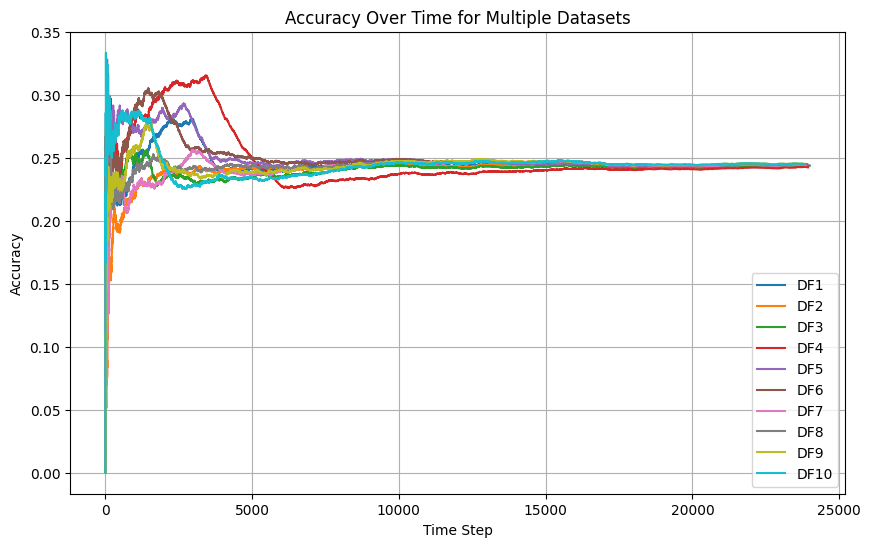

In [ ]:
from skmultiflow.data import DataStream
from skmultiflow.trees import HoeffdingTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt
import joblib

datasets = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10]

max_samples = 250000

# Listas para almacenar métricas y curvas de precisión por conjunto de datos
accuracy_scores = []
precision_scores = []
f1_scores = []

# Crear una figura para combinar las gráficas
plt.figure(figsize=(10, 6))

for idx, dataset in enumerate(datasets):

    target_idx = dataset.columns.get_loc("Activity")

    # Crear el flujo de datos
    stream = DataStream(dataset, target_idx=target_idx)

    ht = HoeffdingTreeClassifier()

    n_samples = 0
    correct_cnt = 0
    max_samples = 250000

    y_true = []
    y_pred = []

    accuracy_history = []

    while n_samples < max_samples and stream.has_more_samples():

        X, y = stream.next_sample()
        y_pred_batch = ht.predict(X)

        y_true.append(y[0])
        y_pred.append(y_pred_batch[0])

        if y[0] == y_pred_batch[0]:
            correct_cnt += 1

        ht = ht.partial_fit(X, y)
        n_samples += 1

        accuracy = correct_cnt / n_samples
        accuracy_history.append(accuracy)

    # Agregar la gráfica de precisión al gráfico combinado
    plt.plot(range(len(accuracy_history)), accuracy_history, label=f'DF{idx + 1}')

    # Calcular métricas
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')

    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    f1_scores.append(f1)

# Configurar el gráfico combinado
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time for Multiple Datasets')
plt.legend(loc='lower right')  # Agregar leyenda
plt.grid(True)

# Mostrar el gráfico combinado
plt.show()

# Imprimir métricas por conjunto de datos
for idx, (accuracy, precision, f1) in enumerate(zip(accuracy_scores, precision_scores, f1_scores)):
    print(f'DF{idx + 1} samples analyzed.')
    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1-score: {f1}')
    print()


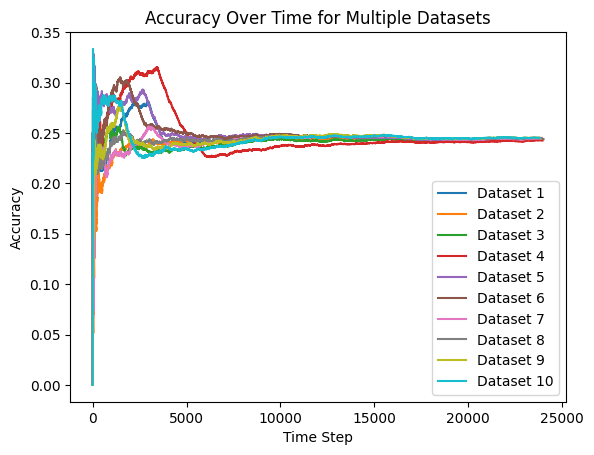

In [ ]:
from skmultiflow.data import DataStream
from skmultiflow.trees import HoeffdingTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt
import joblib

# Define tus conjuntos de datos df1, df2, ..., df10 en una lista
datasets = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10]

# Variables para controlar el bucle
max_samples = 250000

# Listas para almacenar métricas y curvas de precisión por conjunto de datos
accuracy_scores = []
precision_scores = []
f1_scores = []

# Lista para almacenar las curvas de precisión de cada conjunto de datos
accuracy_curves = []

for dataset in datasets:

    target_idx = dataset.columns.get_loc("Activity")

    # Crear el flujo de datos
    stream = DataStream(dataset, target_idx=target_idx)


    ht = HoeffdingTreeClassifier()


    n_samples = 0
    correct_cnt = 0
    max_samples = 250000

    y_true = []
    y_pred = []


    accuracy_history = []


    while n_samples < max_samples and stream.has_more_samples():

        X, y = stream.next_sample()
        y_pred_batch = ht.predict(X)

        y_true.append(y[0])
        y_pred.append(y_pred_batch[0])

        if y[0] == y_pred_batch[0]:
            correct_cnt += 1

        ht = ht.partial_fit(X, y)
        n_samples += 1


        accuracy = correct_cnt / n_samples
        accuracy_history.append(accuracy)


    accuracy_curves.append(accuracy_history)


plt.figure()
for i, curve in enumerate(accuracy_curves):
    plt.plot(range(len(curve)), curve, label=f'Dataset {i + 1}')

plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time for Multiple Datasets')
plt.legend()
plt.show()

####Prueba quitando el 16

#####Entrenamiento con el 70 por ciento

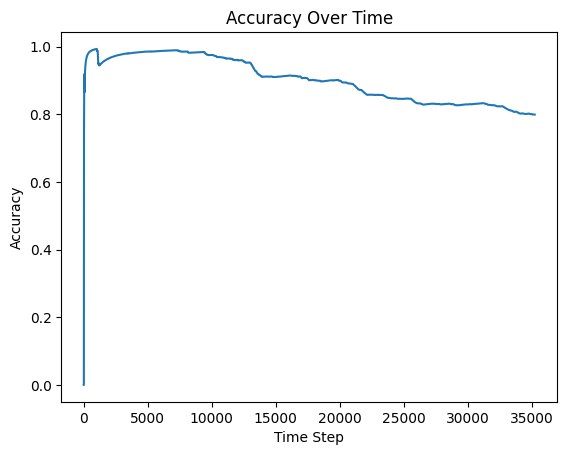

35249 samples analyzed.
Random Forest accuracy: 0.7990297597094953
Precision: 0.7737519191637143
F1-score: 0.7163567078090302


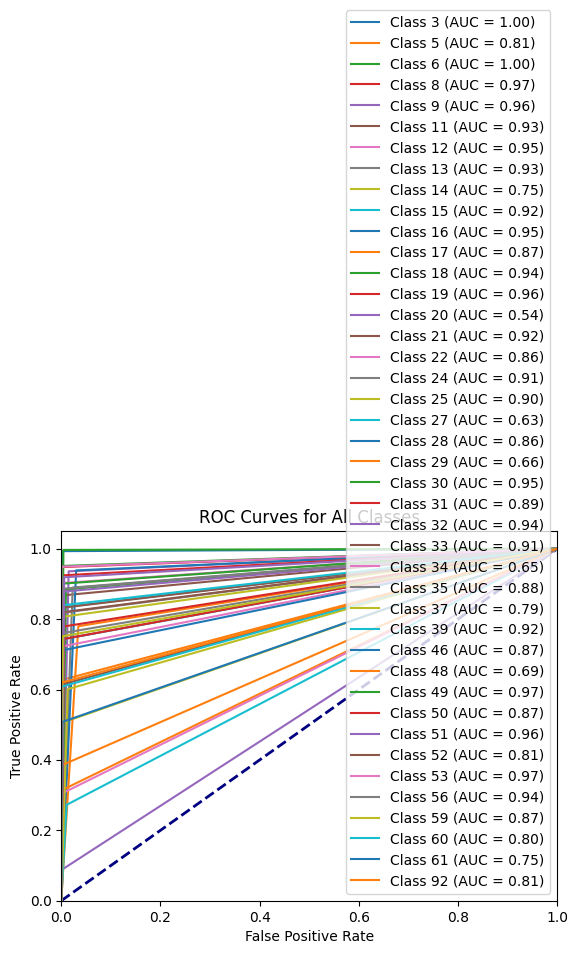

AUC for Class 0: 0.9958135883713721
AUC for Class 1: 0.8133474022455004
AUC for Class 2: 0.9961484958087682
AUC for Class 3: 0.9725072031073364
AUC for Class 4: 0.9604636686055948
AUC for Class 5: 0.9310030340237442
AUC for Class 6: 0.9503674331221839
AUC for Class 7: 0.9333155584314716
AUC for Class 8: 0.7511998696170896
AUC for Class 9: 0.9166666666666667
AUC for Class 10: 0.9541350208228837
AUC for Class 11: 0.8727258405780703
AUC for Class 12: 0.9376051904983349
AUC for Class 13: 0.9607615890079345
AUC for Class 14: 0.5434782608695652
AUC for Class 15: 0.9153225749349284
AUC for Class 16: 0.8600415312292932
AUC for Class 17: 0.9086814209449041
AUC for Class 18: 0.9021012512914706
AUC for Class 19: 0.6307874559129703
AUC for Class 20: 0.855206234598878
AUC for Class 21: 0.6559262611203168
AUC for Class 22: 0.9499002539930321
AUC for Class 23: 0.8878765818900404
AUC for Class 24: 0.9388208860196813
AUC for Class 25: 0.9069170350254177
AUC for Class 26: 0.651875454795503
AUC for Class

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)

ht = HoeffdingTreeClassifier()

n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []

accuracy_history = []

while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(ht, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/hoeffdingtreesin16_70.pkl')

plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Hoeffding_tree_stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

In [ ]:
from skmultiflow.trees import HoeffdingTree
from skmultiflow.data import DataStream
from skmultiflow.evaluation import EvaluatePrequential
import joblib
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

df = Datasetsin16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
data_stream = DataStream(df, target_idx=target_idx)

hoeffding_tree = HoeffdingTree()

evaluator = EvaluatePrequential(show_plot=False,
                                metrics =  ['accuracy', 'kappa', 'model_size', 'f1', 'recall', 'precision'],
                                max_samples=240000, batch_size=1)
evaluator.evaluate(stream=data_stream, model=hoeffding_tree)

##############################################################
# Crear una lista para almacenar las curvas ROC y los valores AUC de cada clase
roc_curves = []
auc_scores = []

# Obtener las etiquetas verdaderas y las predicciones del modelo para cada muestra en el flujo de datos
y_true = []
y_proba = []

for i in range(len(data_stream)):
    X, y = data_stream.next_sample()
    y_pred = hoeffding_tree.predict(X)
    y_true.append(y)
    y_proba.append(y_pred)

y_true = np.array(y_true)
y_proba = np.array(y_proba)

# Calcular el AUC y la curva ROC para cada clase
for class_idx in range(y_true.shape[1]):
    fpr, tpr, _ = roc_curve(y_true[:, class_idx], y_proba[:, class_idx])
    roc_curves.append((fpr, tpr))
    auc = roc_auc_score(y_true[:, class_idx], y_proba[:, class_idx])
    auc_scores.append(auc)

# Calcular el AUC promedio
average_auc = np.mean(auc_scores)

# Imprimir el AUC de cada clase y el AUC promedio
print("AUC de cada clase:", auc_scores)
print("AUC promedio:", average_auc)

# Graficar las curvas ROC de todas las clases
plt.figure(figsize=(8, 6))
for class_idx, (fpr, tpr) in enumerate(roc_curves):
    plt.plot(fpr, tpr, label=f'Clase {class_idx}')

plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC de todas las clases')
plt.legend()
plt.grid()
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_Tree_stream.png', dpi=300, bbox_inches='tight')
plt.show()

################################################################3

# Guardar el modelo entrenado
joblib.dump(hoeffding_tree, 'hoeffding_tree_model.pkl')

/usr/local/lib/python3.10/dist-packages/skmultiflow/trees/hoeffding_tree.py:34: FutureWarning: 'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0
  warnings.warn("'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.\n"


Prequential Evaluation
Evaluating 1 target(s).
Pre-training on 200 sample(s).
Evaluating...
 #################### [100%] [161.63s]
Processed samples: 50360
Mean performance:
M0 - Accuracy     : 0.8294
M0 - Kappa        : 0.8183
M0 - Precision: 0.7774
M0 - Recall: 0.7341
M0 - F1 score: 0.7288
M0 - Size (kB)          : 2862.8398


TypeError: ignored

50360 samples analyzed.
Hoeffding Tree accuracy: 0.8299841143764892
Precision: 0.7956044873844238
F1-score: 0.745745581477432


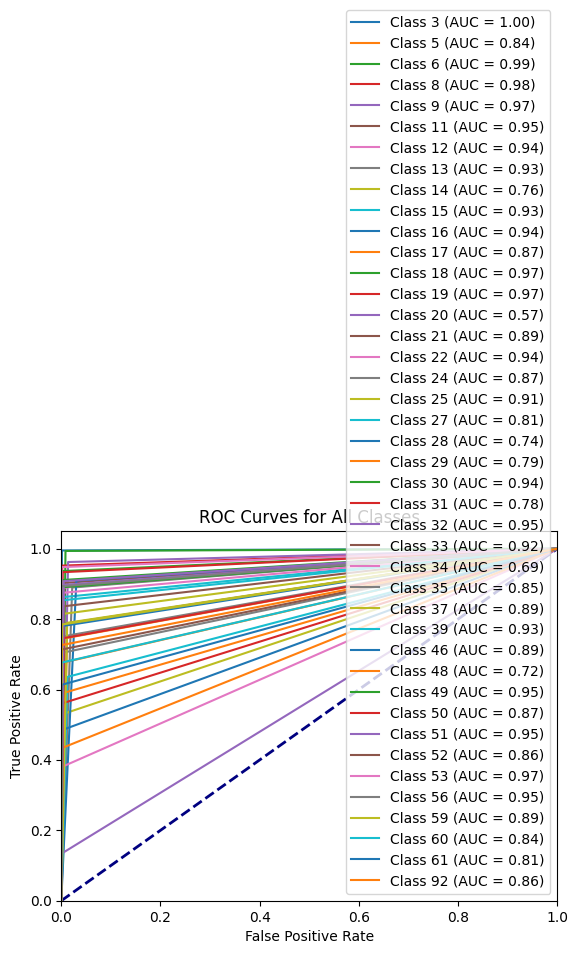

AUC for Class 0: 0.9969392581843158
AUC for Class 1: 0.8374370887551079
AUC for Class 2: 0.9925802239452446
AUC for Class 3: 0.9750375987227073
AUC for Class 4: 0.9742254762432561
AUC for Class 5: 0.9482072575264999
AUC for Class 6: 0.94370894569678
AUC for Class 7: 0.9338670607579209
AUC for Class 8: 0.7630620791214578
AUC for Class 9: 0.9310344827586207
AUC for Class 10: 0.9395081656900514
AUC for Class 11: 0.8676100807266416
AUC for Class 12: 0.9673760036157895
AUC for Class 13: 0.9652820666068996
AUC for Class 14: 0.5666666666666667
AUC for Class 15: 0.8921787980185489
AUC for Class 16: 0.9353382706164932
AUC for Class 17: 0.874980078093872
AUC for Class 18: 0.9066975128697837
AUC for Class 19: 0.8117851208345953
AUC for Class 20: 0.7420113108778144
AUC for Class 21: 0.7923778277970851
AUC for Class 22: 0.9449308063061462
AUC for Class 23: 0.7791875708359212
AUC for Class 24: 0.9483703898957327
AUC for Class 25: 0.9154950985958734
AUC for Class 26: 0.689614387657428
AUC for Class 2

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np


df = Datasetsin16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = HoeffdingTreeClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 51000

# Almacena las predicciones y etiquetas verdaderas
y_true = []
y_pred = []


while n_samples < max_samples and stream.has_more_samples():
    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding Tree accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
#plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_sin_16.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np


df = Datasetsin16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = HoeffdingTreeClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 1000

# Almacena las predicciones y etiquetas verdaderas
y_true = []
y_pred = []


while n_samples < max_samples and stream has_more_samples():
    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

# Dibujar la curva ROC para una clase específica (puedes elegir la clase que desees evaluar)
class_of_interest = 42  # Cambia a la clase que desees evaluar
y_true_class = [1 if label == class_of_interest else 0 for label in y_true]  # Convierte a binario
fpr, tpr, _ = roc_curve(y_true_class, y_pred)

# Dibujar la curva ROC para la clase específica
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC Curve for Class {class_of_interest}')

# Agregar AUC como anotación en la gráfica
plt.annotate(f'AUC = {roc_auc_scores[class_of_interest - 3]:.2f}', xy=(0.6, 0.4), xytext=(0.7, 0.7),
             arrowprops=dict(facecolor='black', shrink=0.05))

plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores, start=3):
    print(f'AUC for Class {class_label}: {auc_class}')


SyntaxError: ignored

In [ ]:
#Prueba con los calculos de las demas variables
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import LabelCombinationHoeffdingTreeClassifier  # Importa el nuevo clasificador
from skmultiflow.data import DataStream
from skmultiflow.evaluation import EvaluatePrequential
import joblib
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt


df = Datasetsin16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)
n_labels = len(df["Activity"].unique())
# Setup LabelCombinationHoeffdingTreeClassifier estimator
lc_ht = LabelCombinationHoeffdingTreeClassifier(n_labels = n_labels)  # Cambia el clasificador aquí

n_samples = 0
correct_cnt = 0
max_samples = 100000

while n_samples < max_samples and stream.has_more_samples():
    X, y = stream.next_sample()
    y_pred = lc_ht.predict(X)
    if np.array_equal(y, y_pred):
        correct_cnt += 1
    lc_ht = lc_ht.partial_fit(X, y)
    n_samples += 1

print('{} samples analyzed.'.format(n_samples))
print('LabelCombinationHoeffdingTreeClassifier accuracy: {}'.format(correct_cnt / n_samples))

TypeError: ignored

In [ ]:
# Imports
from skmultiflow.data import MultilabelGenerator, DataStream
from skmultiflow.trees import LabelCombinationHoeffdingTreeClassifier
from skmultiflow.metrics import hamming_score
from sklearn.preprocessing import LabelBinarizer

# Definir Datasetsin16 o cargar los datos de alguna manera

# Setting up a data stream
df = Datasetsin16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)

n_labels = df["Activity"].nunique()


lc_ht = LabelCombinationHoeffdingTreeClassifier(n_labels=n_labels)


n_samples = 0
max_samples = 200
true_labels = []
predicts = []

label_binarizer = LabelBinarizer()


while n_samples < max_samples and stream.has_more_samples():
    X, y = stream.next_sample()
    y_bin = label_binarizer.fit_transform(y)  # Codificar etiquetas usando one-hot
    y_str = ''.join(str(int(val)) for val in y_bin[0])  # Convertir y en una cadena de bits
    y_pred = lc_ht.predict(X)
    lc_ht.partial_fit(X, y_str)
    predicts.extend(y_pred)
    true_labels.extend(y_bin[0])
    n_samples += 1

# ...

# Después del bucle while
true_labels = np.array(true_labels).reshape(-1, n_labels)
predicts = np.array(predicts).reshape(-1, n_labels)

# Calcular el rendimiento
perf = hamming_score(true_labels, predicts)
print('{} samples analyzed.'.format(n_samples))
print('Label Combination Hoeffding Tree Hamming score: ' + str(perf))


ValueError: ignored

In [ ]:
y_str

'0'

#####Prueba con el 30 por ciento

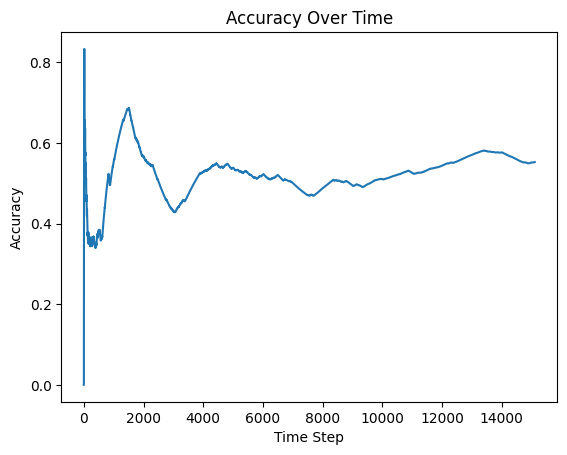

15111 samples analyzed.
Random Forest accuracy: 0.5527099463966647
Precision: 0.5186123413644526
F1-score: 0.5297676018785459


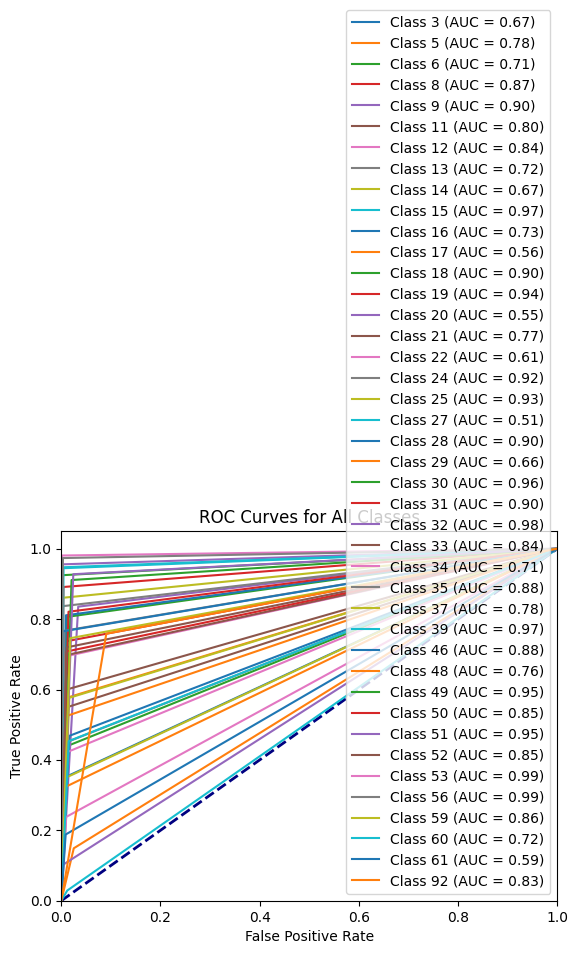

Average AUC (macro): 0.83
Accuracy for Class 3: 35.08%
Accuracy for Class 5: 57.41%
Accuracy for Class 6: 43.88%
Accuracy for Class 8: 73.48%
Accuracy for Class 9: 83.54%
Accuracy for Class 11: 59.64%
Accuracy for Class 12: 69.23%
Accuracy for Class 13: 44.95%
Accuracy for Class 14: 34.85%
Accuracy for Class 15: 94.44%
Accuracy for Class 16: 46.84%
Accuracy for Class 17: 14.90%
Accuracy for Class 18: 80.63%
Accuracy for Class 19: 89.13%
Accuracy for Class 20: 10.00%
Accuracy for Class 21: 54.55%
Accuracy for Class 22: 23.81%
Accuracy for Class 24: 83.67%
Accuracy for Class 25: 86.05%
Accuracy for Class 27: 2.90%
Accuracy for Class 28: 81.08%
Accuracy for Class 29: 32.43%
Accuracy for Class 30: 92.48%
Accuracy for Class 31: 82.09%
Accuracy for Class 32: 95.56%
Accuracy for Class 33: 69.72%
Accuracy for Class 34: 41.67%
Accuracy for Class 35: 76.71%
Accuracy for Class 37: 57.65%
Accuracy for Class 39: 94.74%
Accuracy for Class 46: 76.52%
Accuracy for Class 48: 52.38%
Accuracy for Class 4

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)

ht = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/hoeffdingtreesin16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Hoeffding_tree_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#################################################
# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')



####Prueba solo el 16

#####Entrenamiento con el 70 por ciento

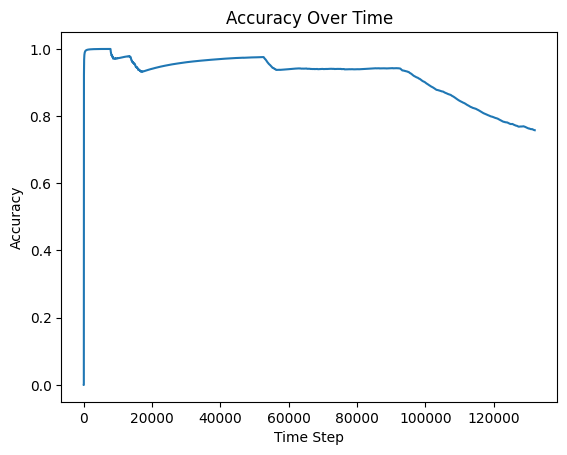

132039 samples analyzed.
Random Forest accuracy: 0.7577306704837207
Precision: 0.47899481874985833
F1-score: 0.3966445992153468


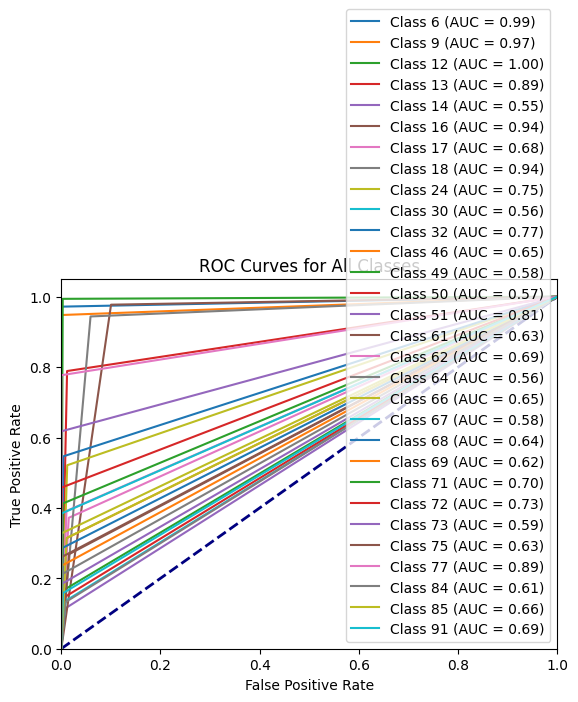

AUC for Class 0: 0.9858432929849398
AUC for Class 1: 0.9739567661107694
AUC for Class 2: 0.9955378164352304
AUC for Class 3: 0.8885776460309153
AUC for Class 4: 0.5536411815218197
AUC for Class 5: 0.938519530492925
AUC for Class 6: 0.6784192268920447
AUC for Class 7: 0.9424771593518162
AUC for Class 8: 0.7546360247424249
AUC for Class 9: 0.5635773530179476
AUC for Class 10: 0.7712408195925611
AUC for Class 11: 0.6521738120629016
AUC for Class 12: 0.5809284129040078
AUC for Class 13: 0.5703258643015213
AUC for Class 14: 0.8087364114995644
AUC for Class 15: 0.6264040993392435
AUC for Class 16: 0.6904237128991766
AUC for Class 17: 0.5619822132359077
AUC for Class 18: 0.6518977339279246
AUC for Class 19: 0.5771931526014089
AUC for Class 20: 0.6418595939830378
AUC for Class 21: 0.6174363663539093
AUC for Class 22: 0.7046798284590559
AUC for Class 23: 0.728602482113606
AUC for Class 24: 0.5916430931922062
AUC for Class 25: 0.6298972353849287
AUC for Class 26: 0.8884256812816175
AUC for Class

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = HoeffdingTreeClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(ht, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/hoeffdingtreesolo16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Hoeffding_tree_stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

188630 samples analyzed.
Hoeffding Tree accuracy: 0.7727667921327467
Precision: 0.47031546290017295
F1-score: 0.3993945100478359


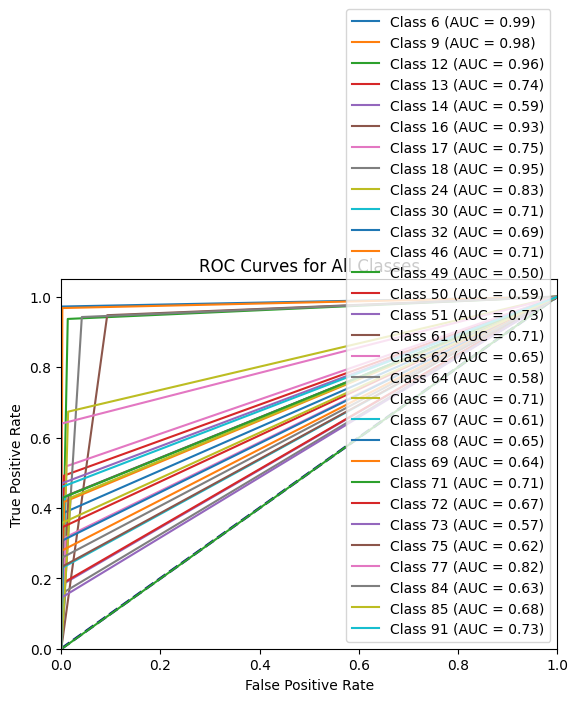

AUC for Class 0: 0.986029152217686
AUC for Class 1: 0.9828293905426121
AUC for Class 2: 0.9619144174729157
AUC for Class 3: 0.743176345991314
AUC for Class 4: 0.5902435732105625
AUC for Class 5: 0.9274398921746134
AUC for Class 6: 0.7540282701716865
AUC for Class 7: 0.9504798859924852
AUC for Class 8: 0.8298230873178124
AUC for Class 9: 0.7123577660782711
AUC for Class 10: 0.6911482363350118
AUC for Class 11: 0.7056455502013564
AUC for Class 12: 0.49954666680805715
AUC for Class 13: 0.5915616943056307
AUC for Class 14: 0.7345507030000317
AUC for Class 15: 0.7111772502832298
AUC for Class 16: 0.6539523372956935
AUC for Class 17: 0.5773471297013553
AUC for Class 18: 0.7052379354659003
AUC for Class 19: 0.6137843817622981
AUC for Class 20: 0.6524037622897072
AUC for Class 21: 0.6388391166985868
AUC for Class 22: 0.7131201574203454
AUC for Class 23: 0.6714063996104324
AUC for Class 24: 0.5723813319668242
AUC for Class 25: 0.6158513079892216
AUC for Class 26: 0.8196729374747296
AUC for Clas

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np


df = Datasetsolo16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = HoeffdingTreeClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 200000

# Almacena las predicciones y etiquetas verdaderas
y_true = []
y_pred = []


while n_samples < max_samples and stream.has_more_samples():
    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding Tree accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

In [ ]:
from skmultiflow.trees import HoeffdingTree
from skmultiflow.data import DataStream
from skmultiflow.evaluation import EvaluatePrequential
import joblib

df = Datasetsolo16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
data_stream = DataStream(df, target_idx=target_idx)

hoeffding_tree = HoeffdingTree()

evaluator = EvaluatePrequential(show_plot=False,
                                metrics =  ['accuracy', 'kappa', 'model_size', 'f1', 'recall', 'precision'],
                                pretrain_size=200, max_samples=200000)
evaluator.evaluate(stream=data_stream, model=hoeffding_tree)
joblib.dump(hoeffding_tree, 'hoeffding_tree_model.pkl')

/usr/local/lib/python3.10/dist-packages/skmultiflow/trees/hoeffding_tree.py:34: FutureWarning: 'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0
  warnings.warn("'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.\n"


Prequential Evaluation
Evaluating 1 target(s).
Pre-training on 200 sample(s).
Evaluating...
 #################### [100%] [336.62s]
Processed samples: 188630
Mean performance:
M0 - Accuracy     : 0.7725
M0 - Kappa        : 0.7166
M0 - Precision: 0.4556
M0 - Recall: 0.4235
M0 - F1 score: 0.3869
M0 - Size (kB)          : 6683.5195


['hoeffding_tree_model.pkl']

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import numpy as np


df = Datasetsolo16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = HoeffdingTreeClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 200000

# Almacena las predicciones y etiquetas verdaderas
y_true = []
y_pred = []


while n_samples < max_samples and stream.has_more_samples():
    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding Tree accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_solo_16.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

188630 samples analyzed.
Hoeffding Tree accuracy: 0.7727667921327467
Precision: 0.47031546290017295
F1-score: 0.3993945100478359


#####Prueba con 30 por ciento

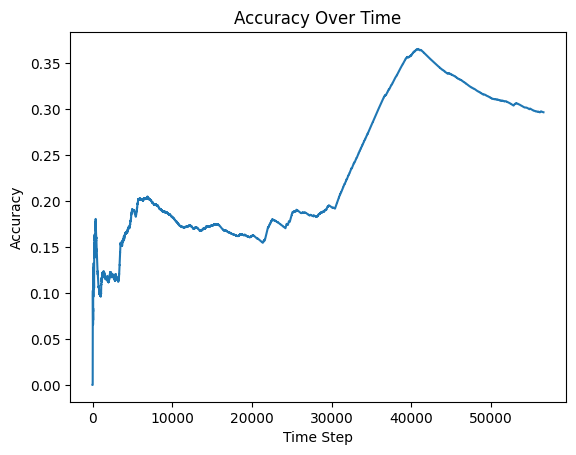

56591 samples analyzed.
Hoeffding accuracy: 0.29635454400876465
Precision: 0.1350698972038665
F1-score: 0.13225679761269768


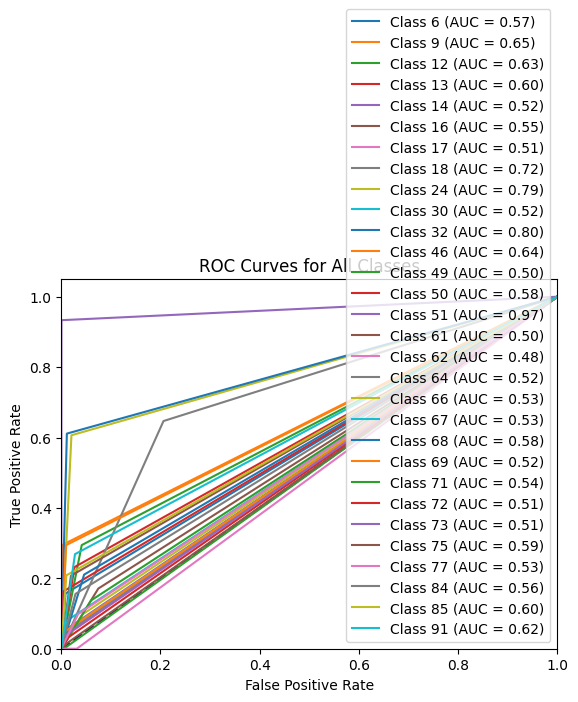

Average AUC (macro): 0.59
Accuracy for Class 6: 15.68%
Accuracy for Class 9: 29.50%
Accuracy for Class 12: 29.44%
Accuracy for Class 13: 23.18%
Accuracy for Class 14: 5.56%
Accuracy for Class 16: 17.09%
Accuracy for Class 17: 3.44%
Accuracy for Class 18: 64.68%
Accuracy for Class 24: 60.65%
Accuracy for Class 30: 4.41%
Accuracy for Class 32: 61.11%
Accuracy for Class 46: 29.41%
Accuracy for Class 49: 0.00%
Accuracy for Class 50: 16.22%
Accuracy for Class 51: 93.33%
Accuracy for Class 61: 1.71%
Accuracy for Class 62: 0.00%
Accuracy for Class 64: 4.62%
Accuracy for Class 66: 9.73%
Accuracy for Class 67: 8.10%
Accuracy for Class 68: 21.06%
Accuracy for Class 69: 4.92%
Accuracy for Class 71: 13.73%
Accuracy for Class 72: 3.32%
Accuracy for Class 73: 3.60%
Accuracy for Class 75: 20.74%
Accuracy for Class 77: 9.86%
Accuracy for Class 84: 15.58%
Accuracy for Class 85: 20.83%
Accuracy for Class 91: 26.87%


In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


ht = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/hoeffdingtreesolo16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = ht.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    ht = ht.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Hoeffding_tree_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Hoeffding_tree_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

###Random forest

####Prueba con el dataset completo

238990 samples analyzed.
Random Forest accuracy: 0.997405749194527
Precision: 0.9601989370936033
F1-score: 0.9613175854725914


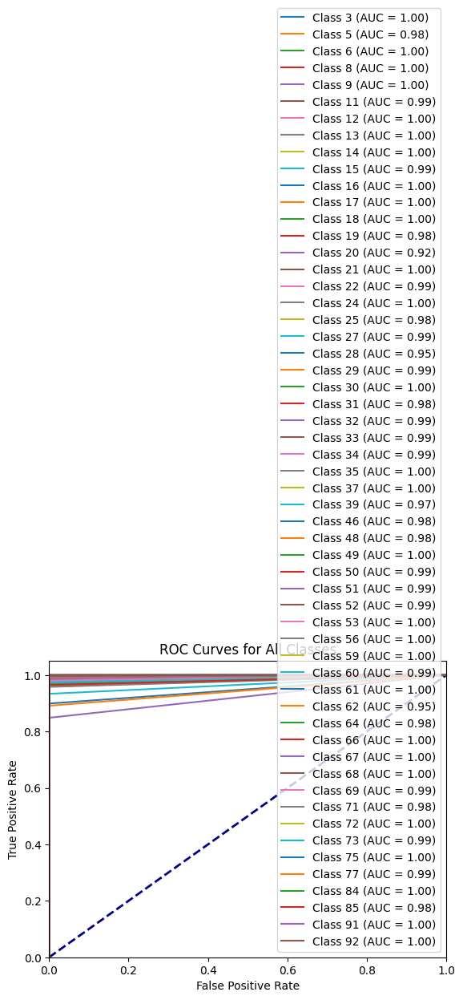

AUC for Class 0: 0.9989428030472965
AUC for Class 1: 0.9840069588497334
AUC for Class 2: 0.9995965914909135
AUC for Class 3: 0.9980849086967675
AUC for Class 4: 0.9974202489504608
AUC for Class 5: 0.9918865784652697
AUC for Class 6: 0.999368604414843
AUC for Class 7: 0.9971863607698491
AUC for Class 8: 0.9963767308846638
AUC for Class 9: 0.9884952788161058
AUC for Class 10: 0.9999321802964083
AUC for Class 11: 0.9995735074849669
AUC for Class 12: 0.9998809171681086
AUC for Class 13: 0.9817658422389921
AUC for Class 14: 0.9242403306592567
AUC for Class 15: 0.9957878482112588
AUC for Class 16: 0.9937269479022591
AUC for Class 17: 0.9986663692323917
AUC for Class 18: 0.9820149921367116
AUC for Class 19: 0.9917633855182353
AUC for Class 20: 0.949442959688673
AUC for Class 21: 0.9929576038177674
AUC for Class 22: 0.9969967611097187
AUC for Class 23: 0.982357583999273
AUC for Class 24: 0.9935785008516701
AUC for Class 25: 0.993443090651568
AUC for Class 26: 0.9891414359281215
AUC for Class 2

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt


df = Dataset.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


arf = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = arf.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    arf = arf.partial_fit(X, y)
    n_samples += 1


# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_forest_stream.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Entrenamiento con el 70 por ciento

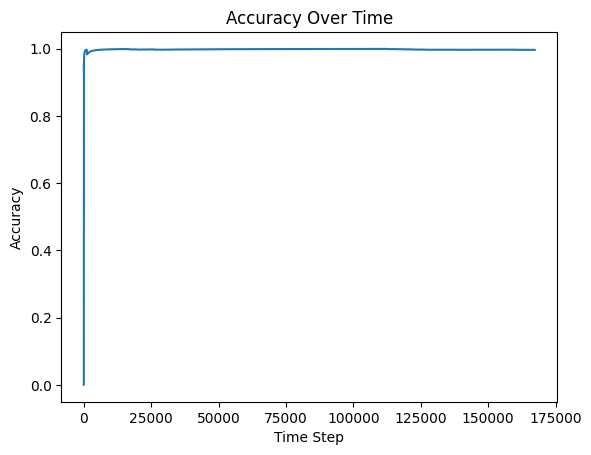

167266 samples analyzed.
Random Forest accuracy: 0.9961916946659811
Precision: 0.9502952605571336
F1-score: 0.948178138602196


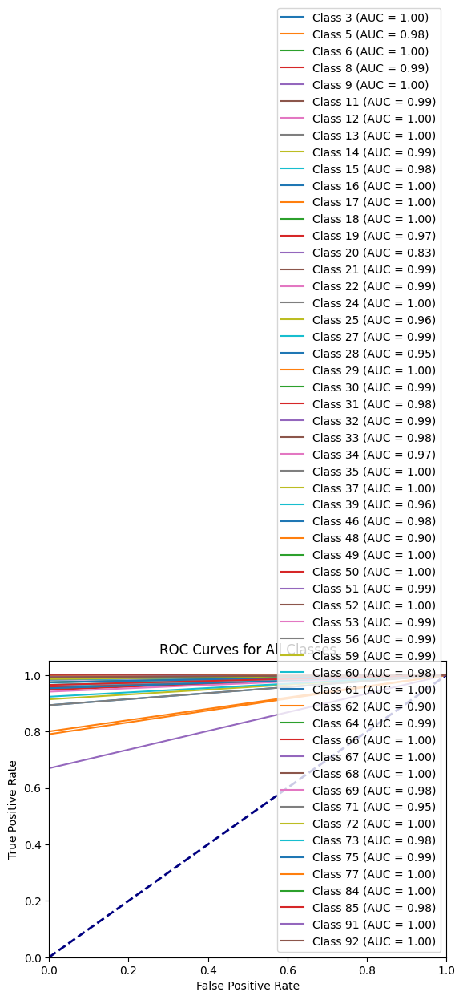

AUC for Class 0: 0.9984894187676685
AUC for Class 1: 0.9770633375177583
AUC for Class 2: 0.999578493897584
AUC for Class 3: 0.9945876246388317
AUC for Class 4: 0.9974019517957742
AUC for Class 5: 0.9922599730695161
AUC for Class 6: 0.9991317018437499
AUC for Class 7: 0.9991446202710311
AUC for Class 8: 0.993084517646806
AUC for Class 9: 0.975200628740968
AUC for Class 10: 0.999894880852307
AUC for Class 11: 0.9994958382374736
AUC for Class 12: 0.9998649783164365
AUC for Class 13: 0.973799373802339
AUC for Class 14: 0.8347826086956522
AUC for Class 15: 0.9939609425133207
AUC for Class 16: 0.9910504687304839
AUC for Class 17: 0.9987671287447992
AUC for Class 18: 0.9568726211228815
AUC for Class 19: 0.9915857911657578
AUC for Class 20: 0.9465499275280737
AUC for Class 21: 0.9957943955618791
AUC for Class 22: 0.9946591697641224
AUC for Class 23: 0.9786282809086061
AUC for Class 24: 0.9938715549538278
AUC for Class 25: 0.9765786090499893
AUC for Class 26: 0.9704759292958878
AUC for Class 27

In [ ]:
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforest_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forest_stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forest_stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')


#####Prueba con el 30 por ciento

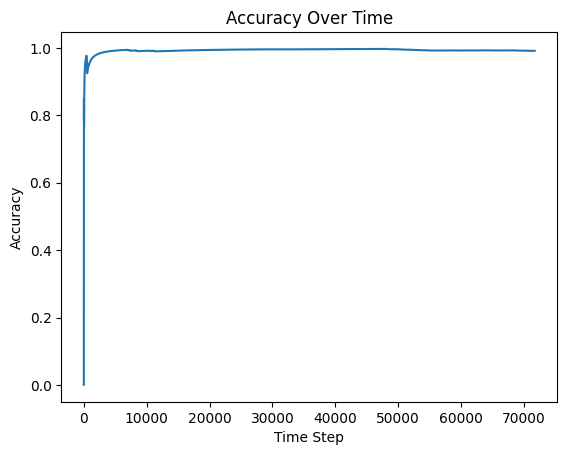

71724 samples analyzed.
Hoeffding accuracy: 0.9912163292621716
Precision: 0.923373092922463
F1-score: 0.9241301965463211


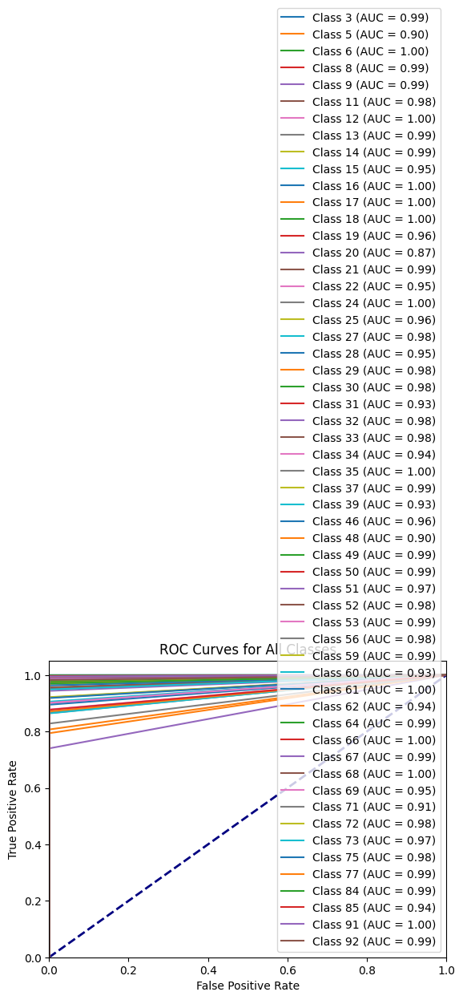

Average AUC (macro): 0.97
Accuracy for Class 3: 97.68%
Accuracy for Class 5: 80.70%
Accuracy for Class 6: 99.69%
Accuracy for Class 8: 97.18%
Accuracy for Class 9: 98.71%
Accuracy for Class 11: 95.21%
Accuracy for Class 12: 99.54%
Accuracy for Class 13: 98.64%
Accuracy for Class 14: 97.11%
Accuracy for Class 15: 90.57%
Accuracy for Class 16: 99.98%
Accuracy for Class 17: 99.37%
Accuracy for Class 18: 99.92%
Accuracy for Class 19: 92.00%
Accuracy for Class 20: 74.00%
Accuracy for Class 21: 97.22%
Accuracy for Class 22: 90.00%
Accuracy for Class 24: 99.13%
Accuracy for Class 25: 92.16%
Accuracy for Class 27: 96.50%
Accuracy for Class 28: 89.47%
Accuracy for Class 29: 95.31%
Accuracy for Class 30: 96.53%
Accuracy for Class 31: 86.49%
Accuracy for Class 32: 96.68%
Accuracy for Class 33: 95.65%
Accuracy for Class 34: 87.77%
Accuracy for Class 35: 99.27%
Accuracy for Class 37: 98.65%
Accuracy for Class 39: 86.96%
Accuracy for Class 46: 91.84%
Accuracy for Class 48: 79.38%
Accuracy for Class 

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforest_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forest_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forest_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

#####Evaluación cruzada

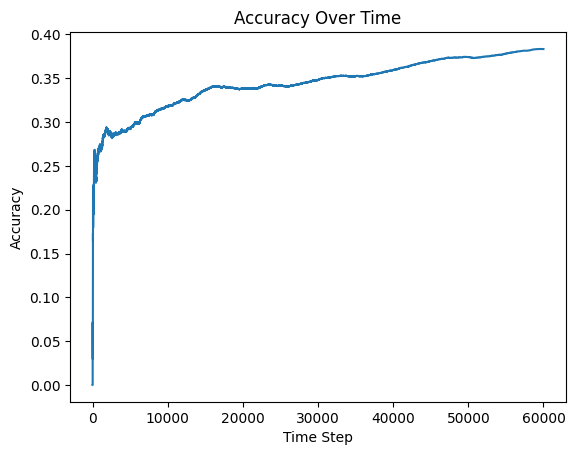

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


60000 samples analyzed.
Hoeffding accuracy: 0.3834166666666667
Precision: 0.34521091241476665
F1-score: 0.200531141687304


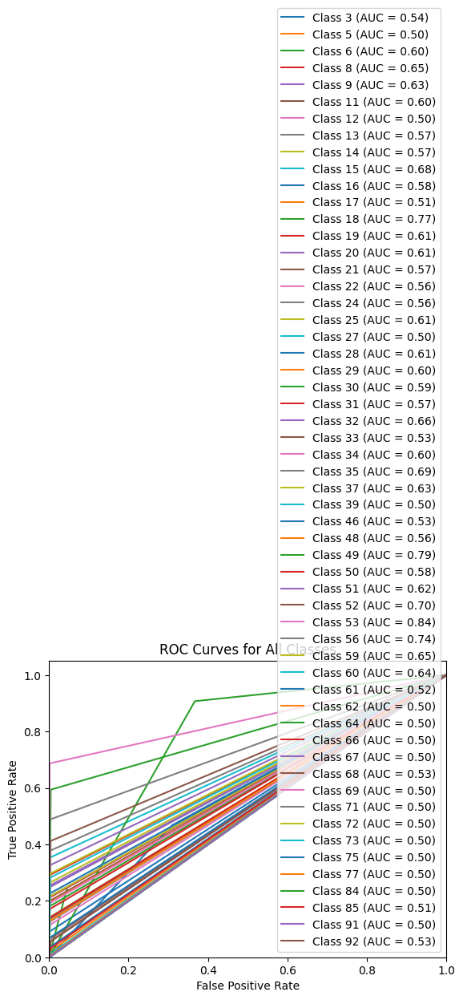

Average AUC (macro): 0.58
Accuracy for Class 61: 3.87%
Accuracy for Class 18: 90.73%
Accuracy for Class 17: 2.10%
Accuracy for Class 68: 5.83%
Accuracy for Class 66: 0.02%
Accuracy for Class 6: 24.83%
Accuracy for Class 37: 26.52%
Accuracy for Class 16: 46.78%
Accuracy for Class 24: 12.59%
Accuracy for Class 9: 25.46%
Accuracy for Class 3: 9.04%
Accuracy for Class 77: 0.34%
Accuracy for Class 72: 0.25%
Accuracy for Class 35: 37.68%
Accuracy for Class 84: 0.00%
Accuracy for Class 8: 29.12%
Accuracy for Class 50: 17.03%
Accuracy for Class 91: 0.00%
Accuracy for Class 27: 0.87%
Accuracy for Class 48: 12.79%
Accuracy for Class 75: 0.00%
Accuracy for Class 12: 0.60%
Accuracy for Class 13: 13.51%
Accuracy for Class 14: 14.23%
Accuracy for Class 33: 6.36%
Accuracy for Class 22: 11.32%
Accuracy for Class 60: 28.19%
Accuracy for Class 5: 0.00%
Accuracy for Class 11: 19.87%
Accuracy for Class 85: 2.84%
Accuracy for Class 59: 29.60%
Accuracy for Class 56: 48.77%
Accuracy for Class 92: 5.26%
Accur

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Dataset.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 60000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforest_todaslasactividades_random.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /randomforest_todaslasactividades_random.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/randomforest_todaslasactividades_random.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

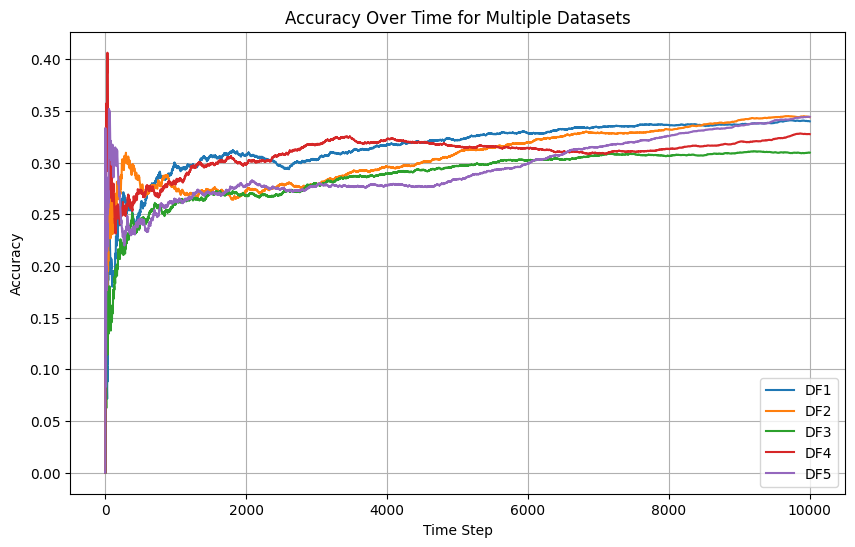

DF1 samples analyzed.
Accuracy: 0.3399
Precision: 0.24914975357065233
F1-score: 0.25030486675039587

DF2 samples analyzed.
Accuracy: 0.344
Precision: 0.2753456134261391
F1-score: 0.26150035471443206

DF3 samples analyzed.
Accuracy: 0.3097
Precision: 0.2349716107820922
F1-score: 0.22454097132343254

DF4 samples analyzed.
Accuracy: 0.3275
Precision: 0.25723307821633734
F1-score: 0.24855932938339392

DF5 samples analyzed.
Accuracy: 0.3442
Precision: 0.2786666894698781
F1-score: 0.2696029011567538



In [ ]:
from skmultiflow.data import DataStream
from skmultiflow.meta import AdaptiveRandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt
import joblib


datasets = [df1, df2, df3, df4, df5]

# Variables para controlar el bucle
max_samples = 10000

# Listas para almacenar métricas y curvas de precisión por conjunto de datos
accuracy_scores = []
precision_scores = []
f1_scores = []

# Crear una figura para combinar las gráficas
plt.figure(figsize=(10, 6))

for idx, dataset in enumerate(datasets):

    target_idx = dataset.columns.get_loc("Activity")

    # Crear el flujo de datos
    stream = DataStream(dataset, target_idx=target_idx)

    modelo = AdaptiveRandomForestClassifier()


    n_samples = 0
    correct_cnt = 0
    max_samples = 10000

    y_true = []
    y_pred = []


    accuracy_history = []


    while n_samples < max_samples and stream.has_more_samples():

        X, y = stream.next_sample()
        y_pred_batch = modelo.predict(X)

        y_true.append(y[0])
        y_pred.append(y_pred_batch[0])

        if y[0] == y_pred_batch[0]:
            correct_cnt += 1

        modelo = modelo.partial_fit(X, y)
        n_samples += 1


        accuracy = correct_cnt / n_samples
        accuracy_history.append(accuracy)

    # Agregar la gráfica de precisión al gráfico combinado
    plt.plot(range(len(accuracy_history)), accuracy_history, label=f'DF{idx + 1}')

    # Calcular métricas
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    f1_scores.append(f1)

# Configurar el gráfico combinado
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time for Multiple Datasets')
plt.legend(loc='lower right')  # Agregar leyenda
plt.grid(True)

# Mostrar el gráfico combinado
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas de los 10 lotes/Random_Forest.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir métricas por conjunto de datos
for idx, (accuracy, precision, f1) in enumerate(zip(accuracy_scores, precision_scores, f1_scores)):
    print(f'DF{idx + 1} samples analyzed.')
    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1-score: {f1}')
    print()

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


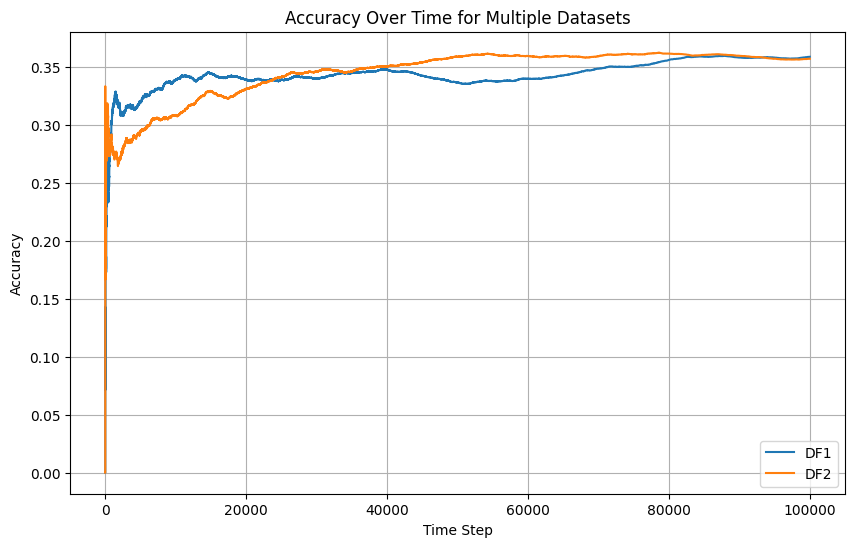

DF1 samples analyzed.
Accuracy: 0.35873
Precision: 0.30580251577538226
F1-score: 0.2787065148461134

DF2 samples analyzed.
Accuracy: 0.35701
Precision: 0.2977004515105077
F1-score: 0.2732396408329772



In [ ]:
from skmultiflow.data import DataStream
from skmultiflow.meta import AdaptiveRandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt
import joblib

datasets = [df1, df2]

# Variables para controlar el bucle
max_samples = 100000

# Listas para almacenar métricas y curvas de precisión por conjunto de datos
accuracy_scores = []
precision_scores = []
f1_scores = []

# Crear una figura para combinar las gráficas
plt.figure(figsize=(10, 6))

for idx, dataset in enumerate(datasets):

    target_idx = dataset.columns.get_loc("Activity")

    # Crear el flujo de datos
    stream = DataStream(dataset, target_idx=target_idx)

    modelo = AdaptiveRandomForestClassifier()


    n_samples = 0
    correct_cnt = 0
    max_samples = 100000

    y_true = []
    y_pred = []


    accuracy_history = []


    while n_samples < max_samples and stream.has_more_samples():

        X, y = stream.next_sample()
        y_pred_batch = modelo.predict(X)

        y_true.append(y[0])
        y_pred.append(y_pred_batch[0])

        if y[0] == y_pred_batch[0]:
            correct_cnt += 1

        modelo = modelo.partial_fit(X, y)
        n_samples += 1


        accuracy = correct_cnt / n_samples
        accuracy_history.append(accuracy)

    # Agregar la gráfica de precisión al gráfico combinado
    plt.plot(range(len(accuracy_history)), accuracy_history, label=f'DF{idx + 1}')

    # Calcular métricas
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    f1_scores.append(f1)

# Configurar el gráfico combinado
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time for Multiple Datasets')
plt.legend(loc='lower right')  # Agregar leyenda
plt.grid(True)

# Mostrar el gráfico combinado
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas de los 10 lotes/Random_Forest_2_muestras.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir métricas por conjunto de datos
for idx, (accuracy, precision, f1) in enumerate(zip(accuracy_scores, precision_scores, f1_scores)):
    print(f'DF{idx + 1} samples analyzed.')
    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1-score: {f1}')
    print()

In [ ]:
df1.to_csv('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Caracteristicas/df1.csv',index=False)

In [ ]:
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = df1.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas de los 10 lotes/Random_Forest_1_muestra_completa.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

####Prueba con el dataset sin el 16

#####Entrenamiento con el 70 por ciento

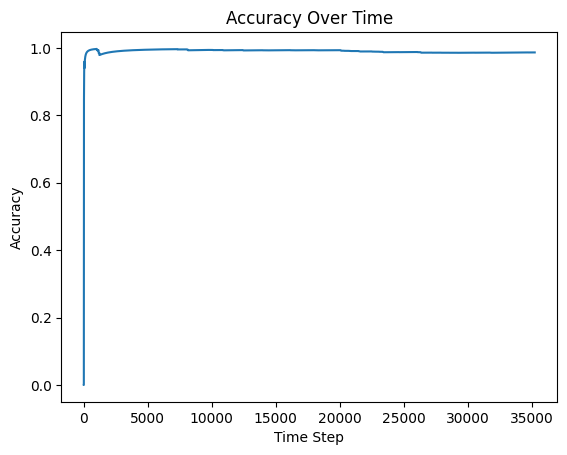

35249 samples analyzed.
Random Forest accuracy: 0.9866379188062072
Precision: 0.9419116872851179
F1-score: 0.9385076493866338


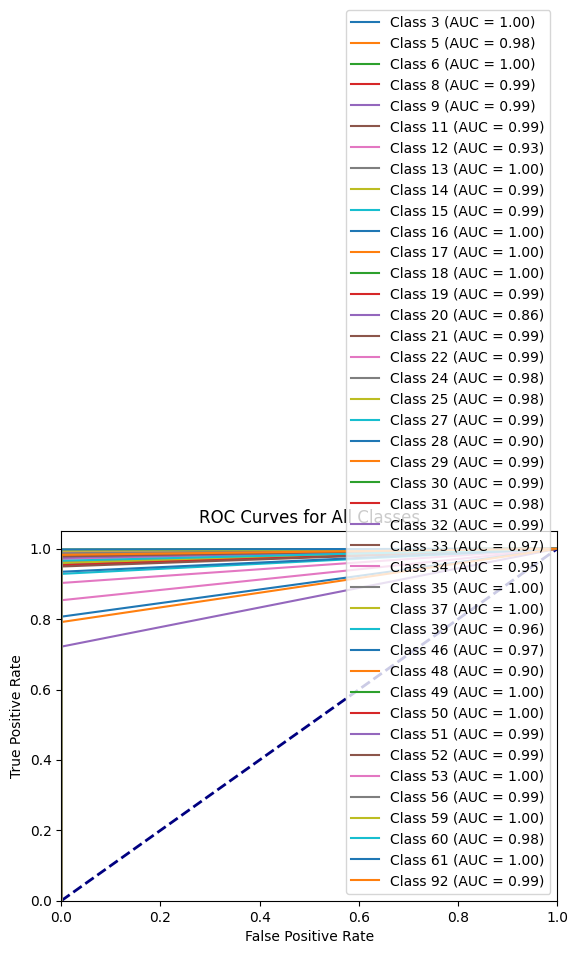

AUC for Class 0: 0.9984520426642842
AUC for Class 1: 0.9810869828559042
AUC for Class 2: 0.9983861158227451
AUC for Class 3: 0.9949999903378842
AUC for Class 4: 0.993642619943108
AUC for Class 5: 0.994063804249421
AUC for Class 6: 0.9268150669748005
AUC for Class 7: 0.9978455463638668
AUC for Class 8: 0.9949024214614315
AUC for Class 9: 0.9875
AUC for Class 10: 0.9974866118199234
AUC for Class 11: 0.9963553951820789
AUC for Class 12: 0.9968209775342878
AUC for Class 13: 0.9869395068018668
AUC for Class 14: 0.8608695652173913
AUC for Class 15: 0.993674820787769
AUC for Class 16: 0.9852585005974028
AUC for Class 17: 0.9781897134201728
AUC for Class 18: 0.9797533004247503
AUC for Class 19: 0.9915113686652536
AUC for Class 20: 0.9033664636901775
AUC for Class 21: 0.9898268502366034
AUC for Class 22: 0.9923123631220474
AUC for Class 23: 0.9762673046283007
AUC for Class 24: 0.9871239526002792
AUC for Class 25: 0.9743053741907214
AUC for Class 26: 0.9512961889442477
AUC for Class 27: 0.997262

In [ ]:
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsin16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forest_stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forest_stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

35249 samples analyzed.
Random Forest accuracy: 0.9864677012113818
Precision: 0.9412915845186045
F1-score: 0.9384151492016654


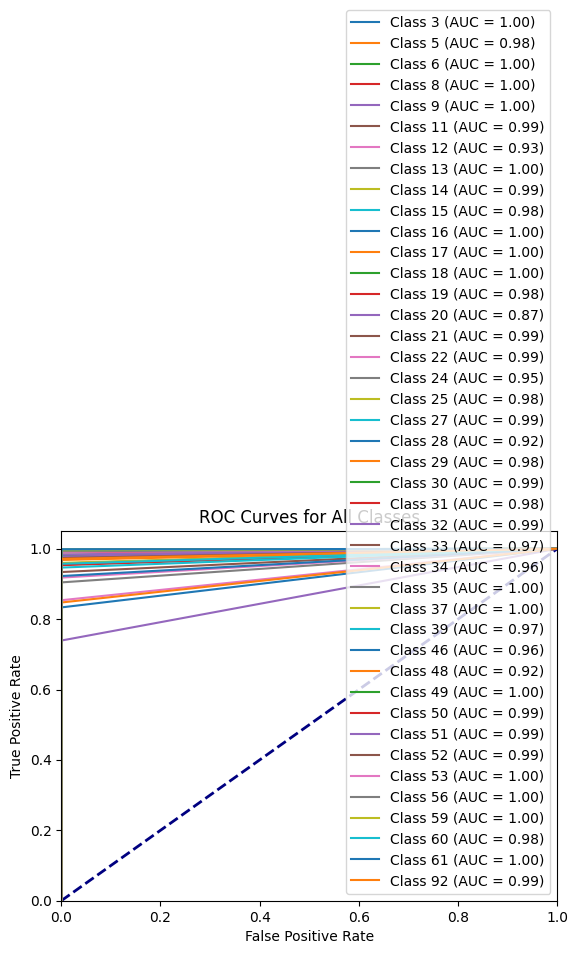

AUC for Class 0: 0.9984666488806899
AUC for Class 1: 0.9848752818564164
AUC for Class 2: 0.9987447567510237
AUC for Class 3: 0.9957826023942723
AUC for Class 4: 0.9957772454759839
AUC for Class 5: 0.9901546916389873
AUC for Class 6: 0.9268292682926829
AUC for Class 7: 0.996547687830447
AUC for Class 8: 0.9949319880157451
AUC for Class 9: 0.9791666666666667
AUC for Class 10: 0.9983529564848402
AUC for Class 11: 0.9952593327586228
AUC for Class 12: 0.9962886391559928
AUC for Class 13: 0.9785646111561619
AUC for Class 14: 0.8695367549332865
AUC for Class 15: 0.990597730497659
AUC for Class 16: 0.9888652478569154
AUC for Class 17: 0.9520600632114068
AUC for Class 18: 0.979696360922971
AUC for Class 19: 0.9882342900775382
AUC for Class 20: 0.9164816659551256
AUC for Class 21: 0.9839201664118704
AUC for Class 22: 0.990806339025662
AUC for Class 23: 0.976238744623731
AUC for Class 24: 0.9887030475114483
AUC for Class 25: 0.9664905064765759
AUC for Class 26: 0.9589236100230836
AUC for Class 27

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


arf = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 200000

y_true = []
y_pred = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = arf.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    arf = arf.partial_fit(X, y)
    n_samples += 1

joblib.dump(arf, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsin16.pkl')

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_forest_stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')


#####Prueba con el 30 por ciento

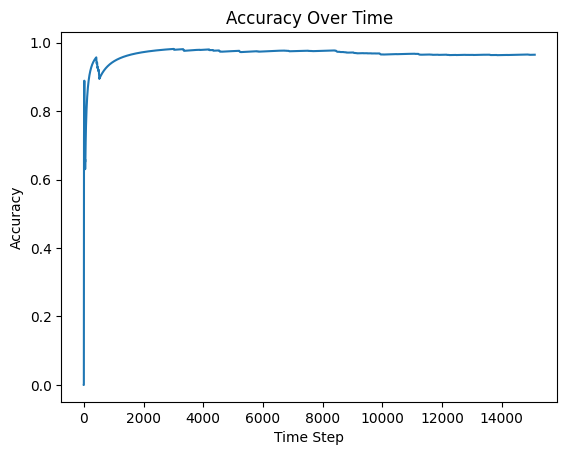

15111 samples analyzed.
Hoeffding accuracy: 0.9647938587783734
Precision: 0.9247621234611396
F1-score: 0.9100743353758454


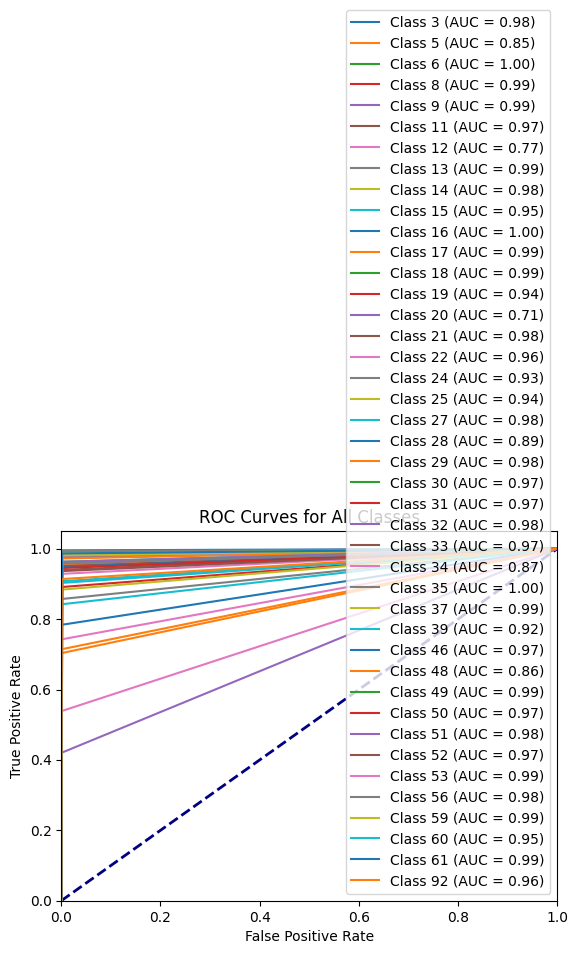

Average AUC (macro): 0.95
Accuracy for Class 3: 95.70%
Accuracy for Class 5: 70.37%
Accuracy for Class 6: 99.17%
Accuracy for Class 8: 97.44%
Accuracy for Class 9: 97.71%
Accuracy for Class 11: 93.98%
Accuracy for Class 12: 53.85%
Accuracy for Class 13: 97.89%
Accuracy for Class 14: 96.30%
Accuracy for Class 15: 90.74%
Accuracy for Class 16: 99.54%
Accuracy for Class 17: 97.22%
Accuracy for Class 18: 98.41%
Accuracy for Class 19: 89.13%
Accuracy for Class 20: 42.00%
Accuracy for Class 21: 96.10%
Accuracy for Class 22: 92.86%
Accuracy for Class 24: 85.71%
Accuracy for Class 25: 88.37%
Accuracy for Class 27: 96.27%
Accuracy for Class 28: 78.38%
Accuracy for Class 29: 95.37%
Accuracy for Class 30: 94.74%
Accuracy for Class 31: 94.78%
Accuracy for Class 32: 96.30%
Accuracy for Class 33: 95.07%
Accuracy for Class 34: 74.24%
Accuracy for Class 35: 99.32%
Accuracy for Class 37: 98.66%
Accuracy for Class 39: 84.21%
Accuracy for Class 46: 94.78%
Accuracy for Class 48: 71.43%
Accuracy for Class 

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsin16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forest_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forest_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')


15111 samples analyzed.
Random Forest accuracy: 0.9687644762093839
Precision: 0.928335397622995
F1-score: 0.9117911852690593


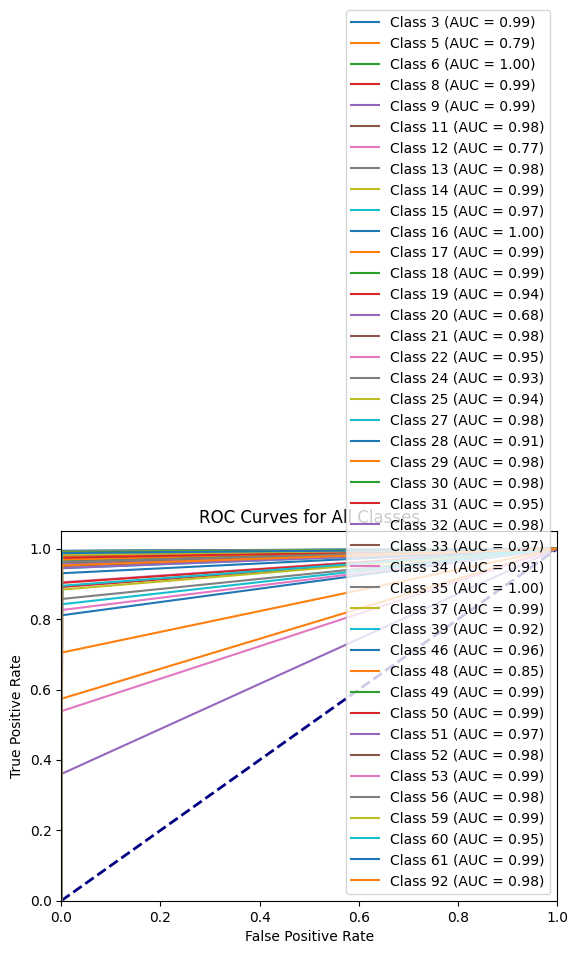

AUC for Class 0: 0.9884433721662367
AUC for Class 1: 0.7865057226981912
AUC for Class 2: 0.9962545160905089
AUC for Class 3: 0.9867811987372441
AUC for Class 4: 0.9910071047244411
AUC for Class 5: 0.9841277961157847
AUC for Class 6: 0.7691976522616342
AUC for Class 7: 0.9838168272675798
AUC for Class 8: 0.9913413949371791
AUC for Class 9: 0.9721890150760444
AUC for Class 10: 0.9964560888886159
AUC for Class 11: 0.9874812709115035
AUC for Class 12: 0.9917913443926145
AUC for Class 13: 0.9446232990375042
AUC for Class 14: 0.6799999999999999
AUC for Class 15: 0.9801203851356838
AUC for Class 16: 0.9519471852805186
AUC for Class 17: 0.92847184020335
AUC for Class 18: 0.9416613676912725
AUC for Class 19: 0.9807898048648453
AUC for Class 20: 0.905239148838271
AUC for Class 21: 0.9842529950596205
AUC for Class 22: 0.980802419990422
AUC for Class 23: 0.951125307561146
AUC for Class 24: 0.9777777777777779
AUC for Class 25: 0.9746172606485327
AUC for Class 26: 0.912778647682513
AUC for Class 27:

In [ ]:
import joblib
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)

# Cargar el modelo entrenado
arf = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsin16.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 200000

y_true = []
y_pred = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = arf.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    arf = arf.partial_fit(X, y)
    n_samples += 1

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_forest_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')


#####Todo el dataset sin 16, random

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsin16.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 60000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsin16_todaslasactividades_random.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /randomforestsin16_todaslasactividades_random.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/randomforestsin16_todaslasactividades_random.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

KeyboardInterrupt: ignored

####Prueba solo 16

#####Entrenamiento con el 70 por ciento

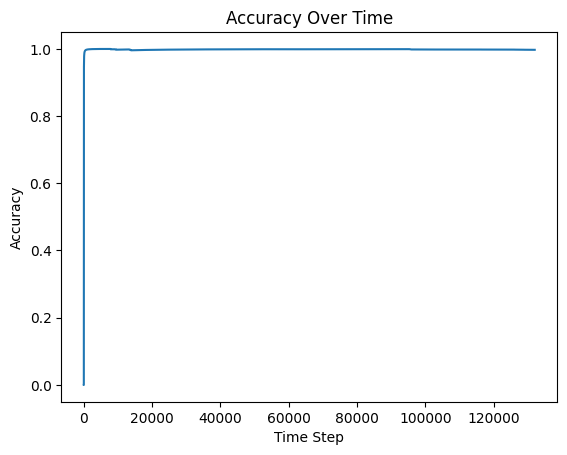

132039 samples analyzed.
Random Forest accuracy: 0.997091768341172
Precision: 0.901460954731345
F1-score: 0.8954363414645689


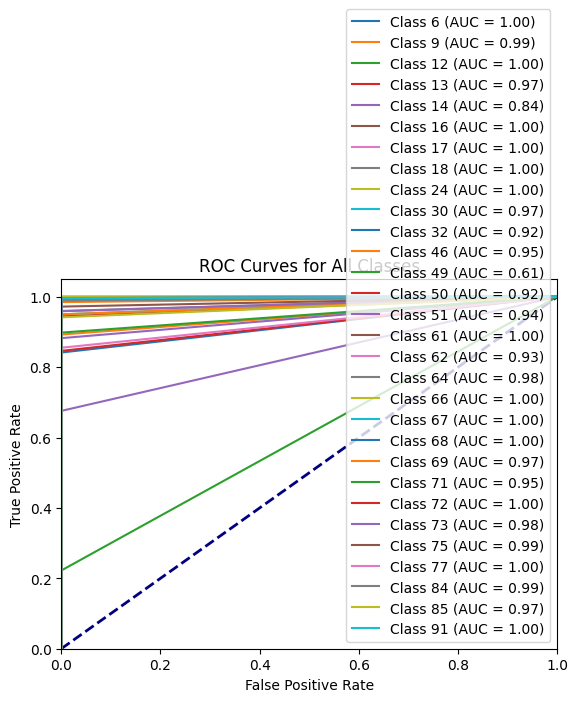

AUC for Class 0: 0.999430875711768
AUC for Class 1: 0.9923167784479453
AUC for Class 2: 0.9986767389155562
AUC for Class 3: 0.9720952036849259
AUC for Class 4: 0.8378037474452681
AUC for Class 5: 0.9998518373083506
AUC for Class 6: 0.999040144166914
AUC for Class 7: 0.9997804618849956
AUC for Class 8: 0.9985428153376158
AUC for Class 9: 0.974890067400056
AUC for Class 10: 0.9207271071670834
AUC for Class 11: 0.9461494022725818
AUC for Class 12: 0.6110959620060445
AUC for Class 13: 0.923039029361217
AUC for Class 14: 0.9411726828529222
AUC for Class 15: 0.9993696783978951
AUC for Class 16: 0.9274490908671602
AUC for Class 17: 0.9797345055263619
AUC for Class 18: 0.9997539822345876
AUC for Class 19: 0.9977803782575082
AUC for Class 20: 0.9980883770651826
AUC for Class 21: 0.9749241844138318
AUC for Class 22: 0.949010162828097
AUC for Class 23: 0.9966391165825221
AUC for Class 24: 0.9793354836390942
AUC for Class 25: 0.9859403194109023
AUC for Class 26: 0.9975390547091865
AUC for Class 27

In [ ]:
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsolo16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forest_stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forest_stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Prueba con el 30 por ciento

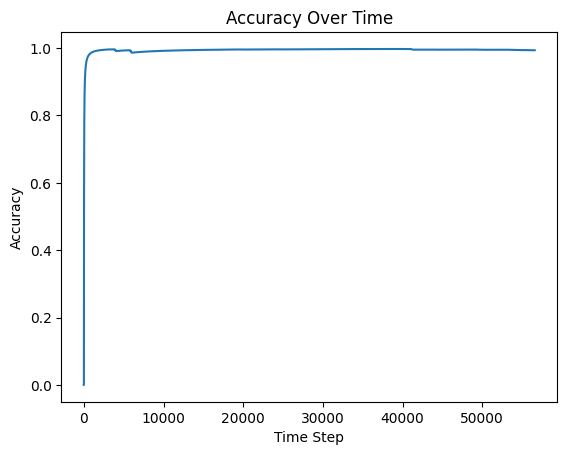

56591 samples analyzed.
Hoeffding accuracy: 0.9935325405099751
Precision: 0.8399674083684684
F1-score: 0.8266956303496077


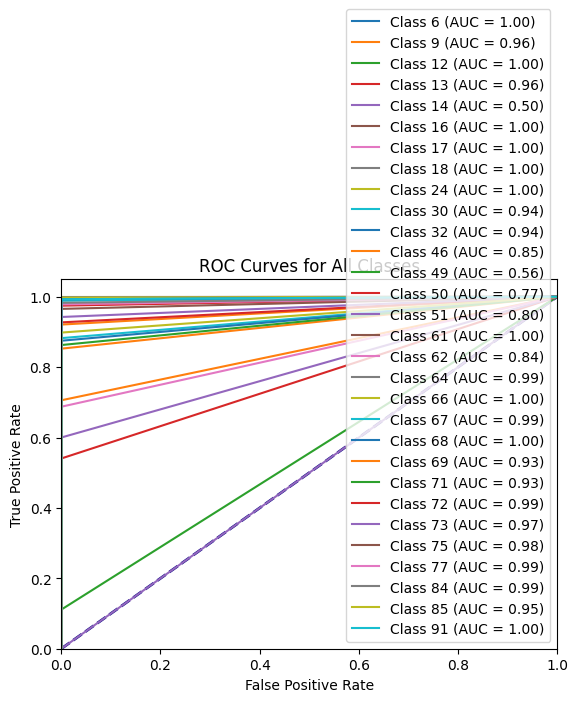

Average AUC (macro): 0.93
Accuracy for Class 6: 99.64%
Accuracy for Class 9: 92.09%
Accuracy for Class 12: 99.26%
Accuracy for Class 13: 92.72%
Accuracy for Class 14: 0.00%
Accuracy for Class 16: 99.87%
Accuracy for Class 17: 99.66%
Accuracy for Class 18: 99.92%
Accuracy for Class 24: 99.02%
Accuracy for Class 30: 88.24%
Accuracy for Class 32: 87.50%
Accuracy for Class 46: 70.59%
Accuracy for Class 49: 11.11%
Accuracy for Class 50: 54.05%
Accuracy for Class 51: 60.00%
Accuracy for Class 61: 99.30%
Accuracy for Class 62: 68.75%
Accuracy for Class 64: 97.69%
Accuracy for Class 66: 99.75%
Accuracy for Class 67: 98.86%
Accuracy for Class 68: 99.26%
Accuracy for Class 69: 85.25%
Accuracy for Class 71: 86.27%
Accuracy for Class 72: 97.46%
Accuracy for Class 73: 94.24%
Accuracy for Class 75: 96.54%
Accuracy for Class 77: 97.83%
Accuracy for Class 84: 98.27%
Accuracy for Class 85: 89.81%
Accuracy for Class 91: 99.29%


In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforestsolo16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forest_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forest_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

#####Random

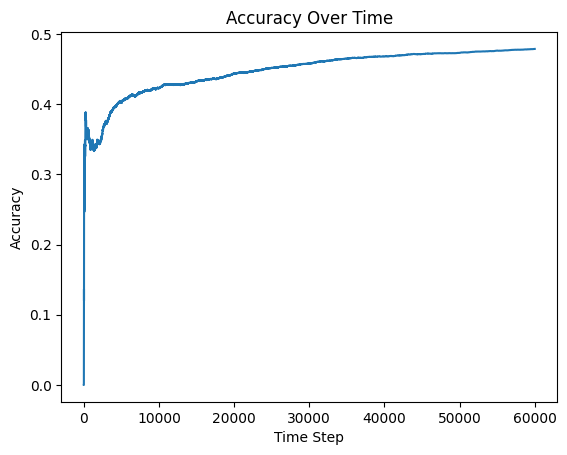

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


60000 samples analyzed.
Hoeffding accuracy: 0.47858333333333336
Precision: 0.254330252546077
F1-score: 0.07588138545231687


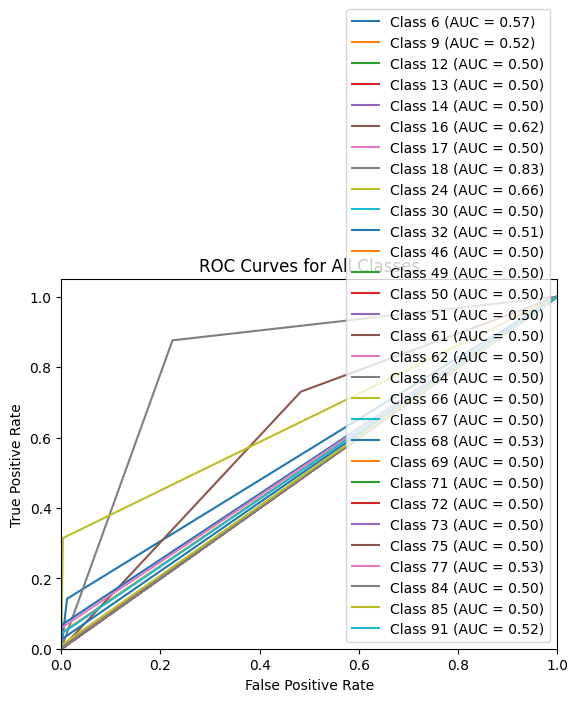

Average AUC (macro): 0.53
Accuracy for Class 67: 0.00%
Accuracy for Class 68: 6.96%
Accuracy for Class 12: 0.16%
Accuracy for Class 16: 73.01%
Accuracy for Class 6: 14.21%
Accuracy for Class 18: 87.61%
Accuracy for Class 9: 4.44%
Accuracy for Class 91: 4.21%
Accuracy for Class 66: 0.04%
Accuracy for Class 61: 0.00%
Accuracy for Class 72: 0.00%
Accuracy for Class 14: 0.00%
Accuracy for Class 24: 31.43%
Accuracy for Class 17: 0.58%
Accuracy for Class 71: 0.00%
Accuracy for Class 85: 0.99%
Accuracy for Class 77: 5.88%
Accuracy for Class 84: 0.00%
Accuracy for Class 64: 0.00%
Accuracy for Class 75: 0.00%
Accuracy for Class 73: 0.00%
Accuracy for Class 69: 0.00%
Accuracy for Class 50: 0.00%
Accuracy for Class 62: 0.00%
Accuracy for Class 30: 0.00%
Accuracy for Class 13: 0.00%
Accuracy for Class 32: 2.60%
Accuracy for Class 46: 0.00%
Accuracy for Class 51: 0.00%
Accuracy for Class 49: 0.00%


In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.meta import AdaptiveRandomForestClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsolo16.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = AdaptiveRandomForestClassifier()


n_samples = 0
correct_cnt = 0
max_samples = 60000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/randomforest_solo16_todaslasactividades_random.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /randomforest_solo16_todaslasactividades_random.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/randomforest_solo16_todaslasactividades_random.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

### (Multiflow) Naive Bayes

####Prueba con el dataset completo

#####Entrenamiento con el 70 por ciento

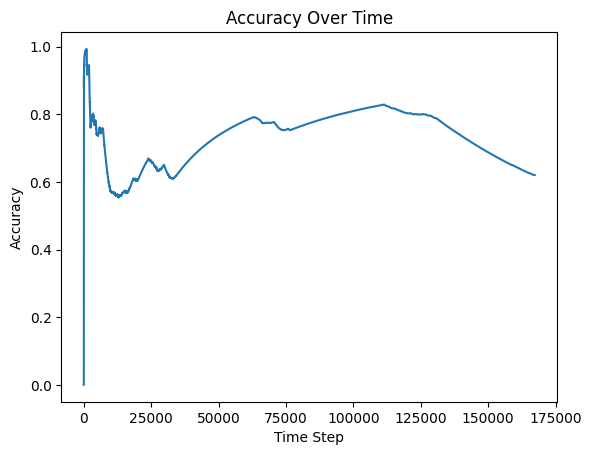

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


167266 samples analyzed.
Random Forest accuracy: 0.620167876316765
Precision: 0.5664276776391686
F1-score: 0.4476007455131691


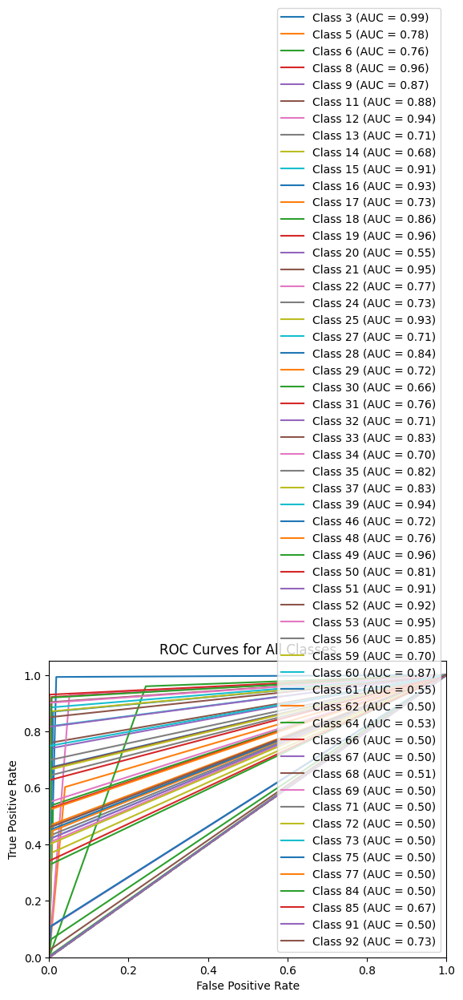

AUC for Class 0: 0.9874774095671252
AUC for Class 1: 0.7814531243541526
AUC for Class 2: 0.7649213260734293
AUC for Class 3: 0.9581540163959089
AUC for Class 4: 0.8687384910490644
AUC for Class 5: 0.8774077877442064
AUC for Class 6: 0.9402151112670895
AUC for Class 7: 0.7144346041042506
AUC for Class 8: 0.6828798931942209
AUC for Class 9: 0.9090909090909092
AUC for Class 10: 0.9302212856196558
AUC for Class 11: 0.7313266559955074
AUC for Class 12: 0.8582743072326018
AUC for Class 13: 0.96492424319276
AUC for Class 14: 0.5521739130434783
AUC for Class 15: 0.9515289524345136
AUC for Class 16: 0.7744789982393734
AUC for Class 17: 0.7291476356616327
AUC for Class 18: 0.9347256232786986
AUC for Class 19: 0.708343314349378
AUC for Class 20: 0.835868887814554
AUC for Class 21: 0.7213130573960909
AUC for Class 22: 0.6632751125582346
AUC for Class 23: 0.7631347744006322
AUC for Class 24: 0.7089378347395945
AUC for Class 25: 0.8344117659956469
AUC for Class 26: 0.7032753833025571
AUC for Class 2

In [ ]:
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = NaiveBayes()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/naivebayes_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Naive_Bayes_Stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_Stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')


#####Prueba con el 30 por ciento

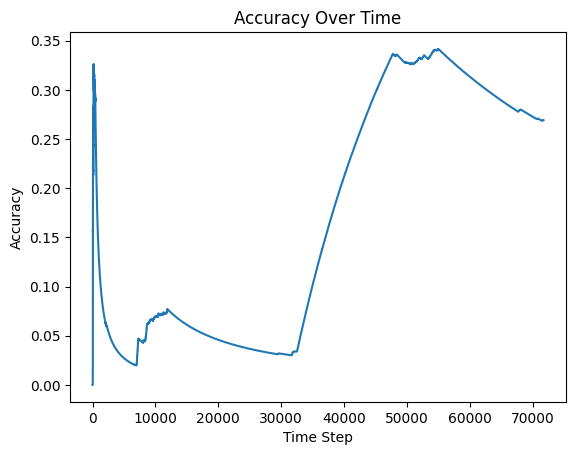

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


71724 samples analyzed.
Hoeffding accuracy: 0.2693101332887179
Precision: 0.23127186015070497
F1-score: 0.20590065812481534


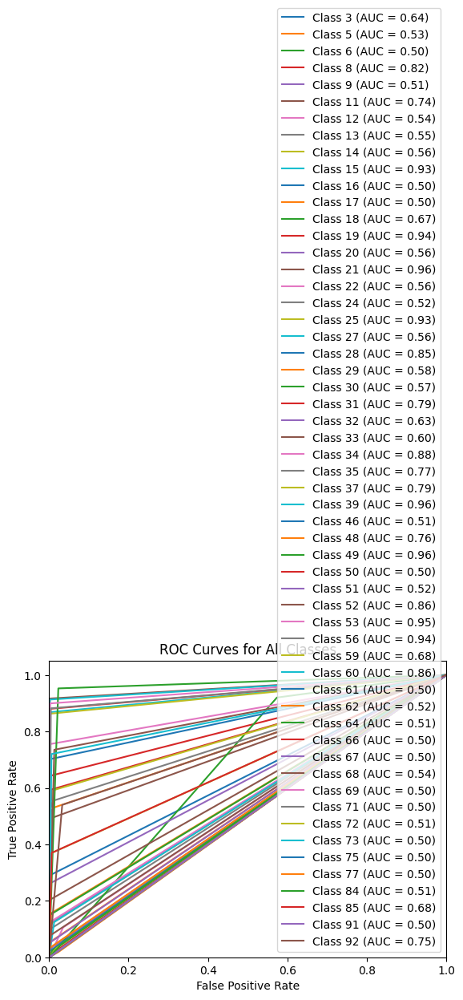

Average AUC (macro): 0.65
Accuracy for Class 3: 29.23%
Accuracy for Class 5: 5.26%
Accuracy for Class 6: 0.15%
Accuracy for Class 8: 64.26%
Accuracy for Class 9: 2.49%
Accuracy for Class 11: 49.10%
Accuracy for Class 12: 10.60%
Accuracy for Class 13: 9.89%
Accuracy for Class 14: 11.72%
Accuracy for Class 15: 86.79%
Accuracy for Class 16: 0.00%
Accuracy for Class 17: 1.88%
Accuracy for Class 18: 92.01%
Accuracy for Class 19: 88.00%
Accuracy for Class 20: 12.00%
Accuracy for Class 21: 91.67%
Accuracy for Class 22: 12.50%
Accuracy for Class 24: 3.10%
Accuracy for Class 25: 86.27%
Accuracy for Class 27: 12.45%
Accuracy for Class 28: 70.18%
Accuracy for Class 29: 15.62%
Accuracy for Class 30: 14.85%
Accuracy for Class 31: 59.46%
Accuracy for Class 32: 26.07%
Accuracy for Class 33: 20.29%
Accuracy for Class 34: 75.54%
Accuracy for Class 35: 55.10%
Accuracy for Class 37: 59.19%
Accuracy for Class 39: 91.30%
Accuracy for Class 46: 2.04%
Accuracy for Class 48: 52.58%
Accuracy for Class 49: 95.2

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/naivebayes_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Naive_Bayes_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

####Prueba con el dataset sin 16

#####Entrenamiento con el 70 por ciento

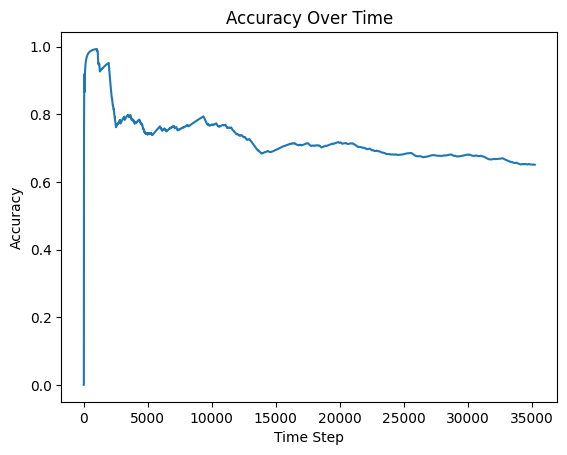

35249 samples analyzed.
Random Forest accuracy: 0.6508553434139975
Precision: 0.682788055868395
F1-score: 0.5998781528306197


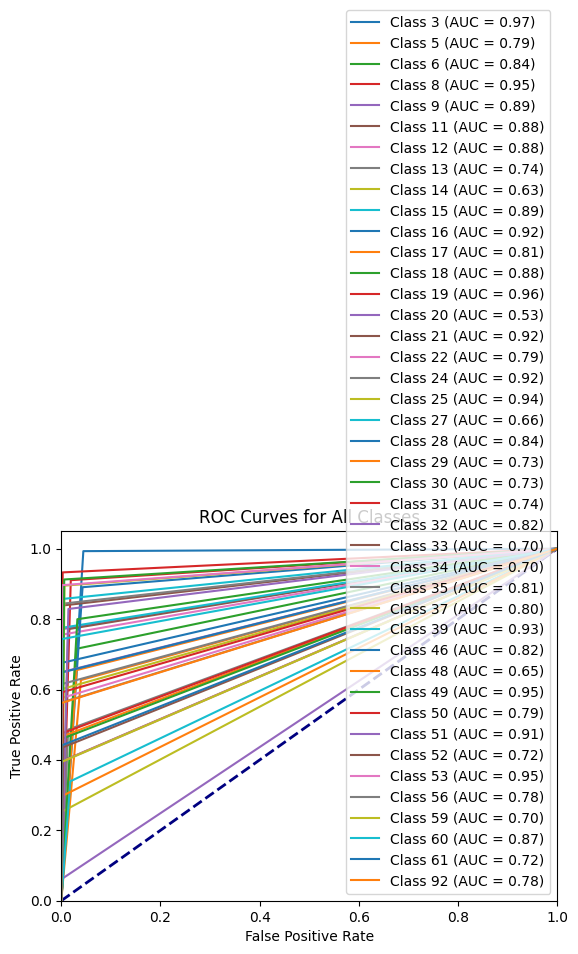

AUC for Class 0: 0.9743132378221784
AUC for Class 1: 0.7936264852584579
AUC for Class 2: 0.8421538624997998
AUC for Class 3: 0.9457388523338841
AUC for Class 4: 0.8851774191229719
AUC for Class 5: 0.878788386619609
AUC for Class 6: 0.8767990645141626
AUC for Class 7: 0.7360968714247574
AUC for Class 8: 0.6255533783631748
AUC for Class 9: 0.8875
AUC for Class 10: 0.9238637554894332
AUC for Class 11: 0.8121120168704998
AUC for Class 12: 0.8836881055023935
AUC for Class 13: 0.9649632696802033
AUC for Class 14: 0.5304347826086957
AUC for Class 15: 0.9182429164790284
AUC for Class 16: 0.7868486875401094
AUC for Class 17: 0.9217248992057736
AUC for Class 18: 0.9443350935598668
AUC for Class 19: 0.6604906596065876
AUC for Class 20: 0.8376766057737199
AUC for Class 21: 0.7319435396624835
AUC for Class 22: 0.7289753998380324
AUC for Class 23: 0.7365414320593952
AUC for Class 24: 0.824315199418943
AUC for Class 25: 0.6970348610603891
AUC for Class 26: 0.697052925140225
AUC for Class 27: 0.807347

In [ ]:
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = NaiveBayes()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/naivebayessin16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Naive_Bayes_Stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_Stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Prueba con el 30 por ciento

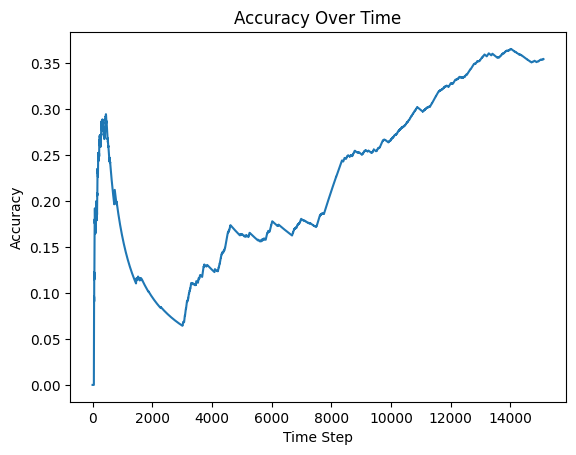

15111 samples analyzed.
Hoeffding accuracy: 0.35470849050360664
Precision: 0.3846211132120868
F1-score: 0.3848030931831718


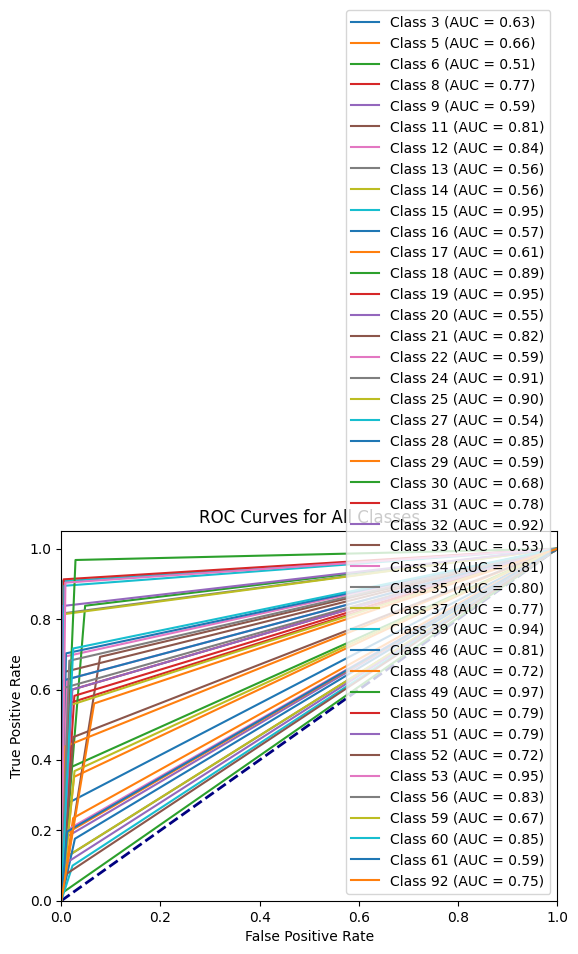

Average AUC (macro): 0.75
Accuracy for Class 3: 27.68%
Accuracy for Class 5: 35.19%
Accuracy for Class 6: 2.32%
Accuracy for Class 8: 55.91%
Accuracy for Class 9: 17.26%
Accuracy for Class 11: 69.28%
Accuracy for Class 12: 69.23%
Accuracy for Class 13: 12.37%
Accuracy for Class 14: 12.79%
Accuracy for Class 15: 90.74%
Accuracy for Class 16: 17.61%
Accuracy for Class 17: 23.48%
Accuracy for Class 18: 83.81%
Accuracy for Class 19: 91.30%
Accuracy for Class 20: 10.00%
Accuracy for Class 21: 64.94%
Accuracy for Class 22: 19.84%
Accuracy for Class 24: 81.63%
Accuracy for Class 25: 81.40%
Accuracy for Class 27: 9.96%
Accuracy for Class 28: 70.27%
Accuracy for Class 29: 19.31%
Accuracy for Class 30: 36.84%
Accuracy for Class 31: 58.21%
Accuracy for Class 32: 83.70%
Accuracy for Class 33: 7.04%
Accuracy for Class 34: 62.88%
Accuracy for Class 35: 60.50%
Accuracy for Class 37: 55.46%
Accuracy for Class 39: 89.47%
Accuracy for Class 46: 62.61%
Accuracy for Class 48: 43.81%
Accuracy for Class 49:

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/naivebayessin16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Naive_Bayes_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_stream_sin_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

####Prueba solo 16

#####Entrenamiento con el 70 por ciento

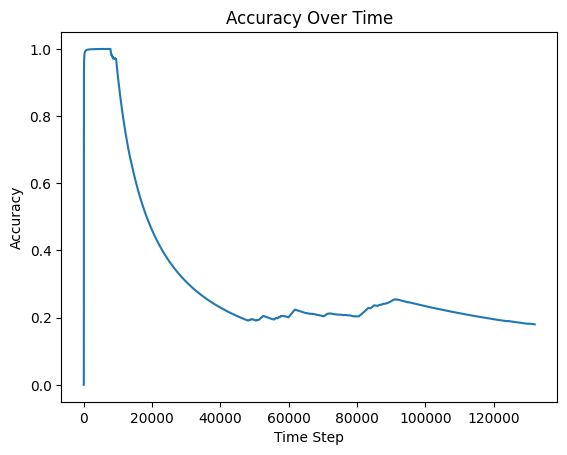

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


132039 samples analyzed.
Random Forest accuracy: 0.18021190708805732
Precision: 0.2264651186454754
F1-score: 0.07987732627331008


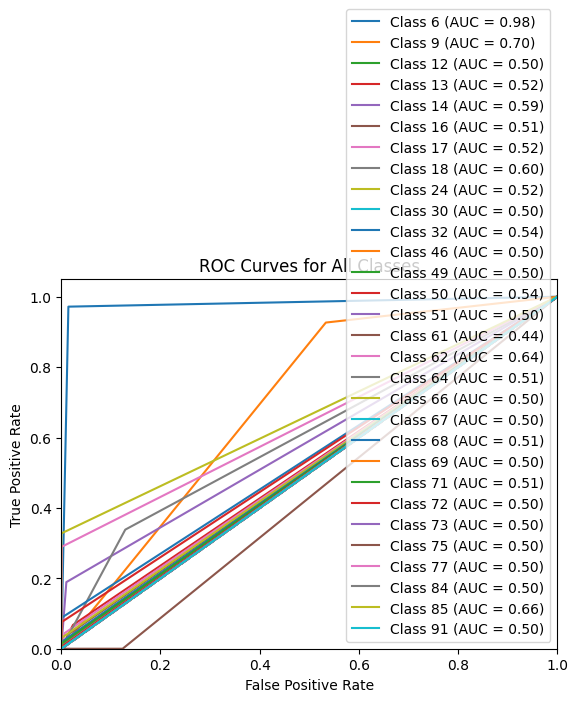

AUC for Class 0: 0.9787253052197441
AUC for Class 1: 0.6965958463169015
AUC for Class 2: 0.5011358138039915
AUC for Class 3: 0.5219473959550841
AUC for Class 4: 0.5894810357091231
AUC for Class 5: 0.51322974039241
AUC for Class 6: 0.5188034804941104
AUC for Class 7: 0.6046346402621049
AUC for Class 8: 0.5150401031703589
AUC for Class 9: 0.5
AUC for Class 10: 0.5437158469945356
AUC for Class 11: 0.5
AUC for Class 12: 0.5
AUC for Class 13: 0.5374763018531775
AUC for Class 14: 0.5
AUC for Class 15: 0.4381546174479499
AUC for Class 16: 0.6443175491135996
AUC for Class 17: 0.5056994709163624
AUC for Class 18: 0.5
AUC for Class 19: 0.5
AUC for Class 20: 0.5093198444352517
AUC for Class 21: 0.5
AUC for Class 22: 0.507004687969827
AUC for Class 23: 0.5023651844843898
AUC for Class 24: 0.5
AUC for Class 25: 0.5
AUC for Class 26: 0.5
AUC for Class 27: 0.5
AUC for Class 28: 0.6637426900584795
AUC for Class 29: 0.5
Average AUC (macro): 0.54


In [ ]:
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = NaiveBayes()


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/naivebayessolo16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Naive_Bayes_Stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_Stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Prueba con el 30 por ciento

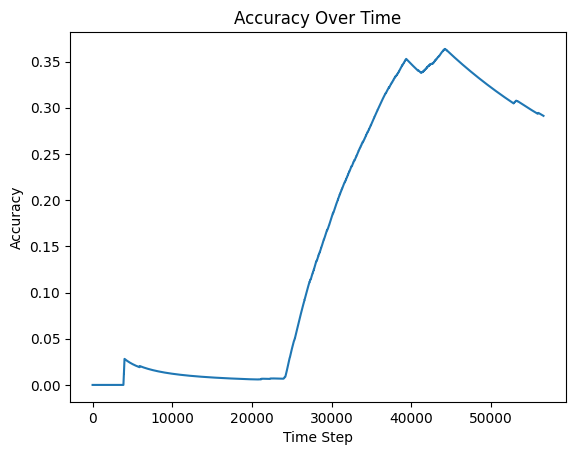

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


56591 samples analyzed.
Hoeffding accuracy: 0.2911947129402202
Precision: 0.09738855962079154
F1-score: 0.04927767613166027


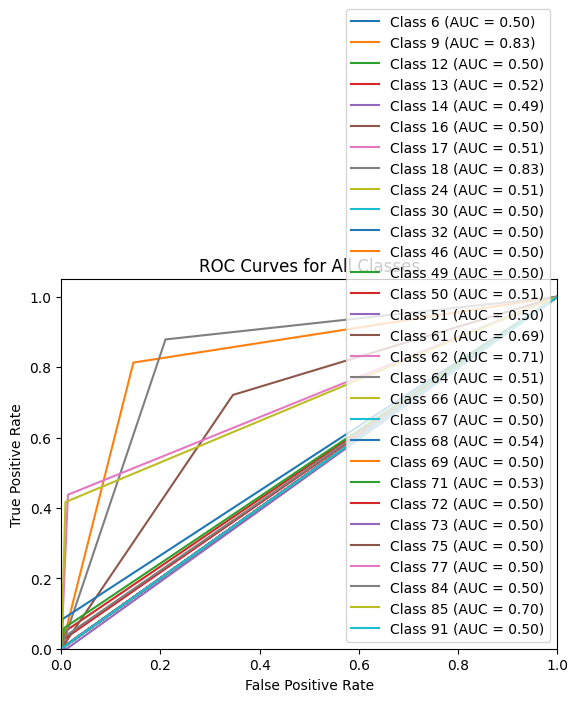

Average AUC (macro): 0.55
Accuracy for Class 6: 0.00%
Accuracy for Class 9: 81.29%
Accuracy for Class 12: 0.00%
Accuracy for Class 13: 5.30%
Accuracy for Class 14: 0.00%
Accuracy for Class 16: 0.23%
Accuracy for Class 17: 4.05%
Accuracy for Class 18: 87.87%
Accuracy for Class 24: 2.60%
Accuracy for Class 30: 0.00%
Accuracy for Class 32: 0.00%
Accuracy for Class 46: 0.00%
Accuracy for Class 49: 0.00%
Accuracy for Class 50: 2.70%
Accuracy for Class 51: 0.00%
Accuracy for Class 61: 72.10%
Accuracy for Class 62: 43.75%
Accuracy for Class 64: 3.46%
Accuracy for Class 66: 0.00%
Accuracy for Class 67: 0.00%
Accuracy for Class 68: 8.40%
Accuracy for Class 69: 0.00%
Accuracy for Class 71: 5.88%
Accuracy for Class 72: 0.00%
Accuracy for Class 73: 0.00%
Accuracy for Class 75: 0.00%
Accuracy for Class 77: 0.00%
Accuracy for Class 84: 0.00%
Accuracy for Class 85: 41.67%
Accuracy for Class 91: 0.00%


In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/naivebayessolo16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Naive_Bayes_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Naive_Bayes_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

###KNN

####DATASET COMPLETO

#####Entrenamiento con el 70 por ciento

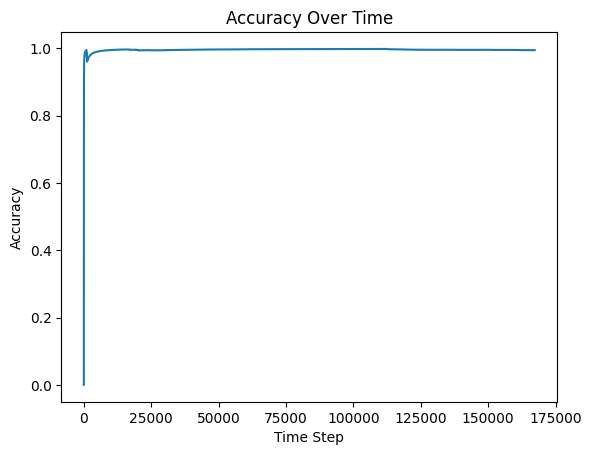

167266 samples analyzed.
Random Forest accuracy: 0.9947987038609162
Precision: 0.9338747341443362
F1-score: 0.9341898918955515


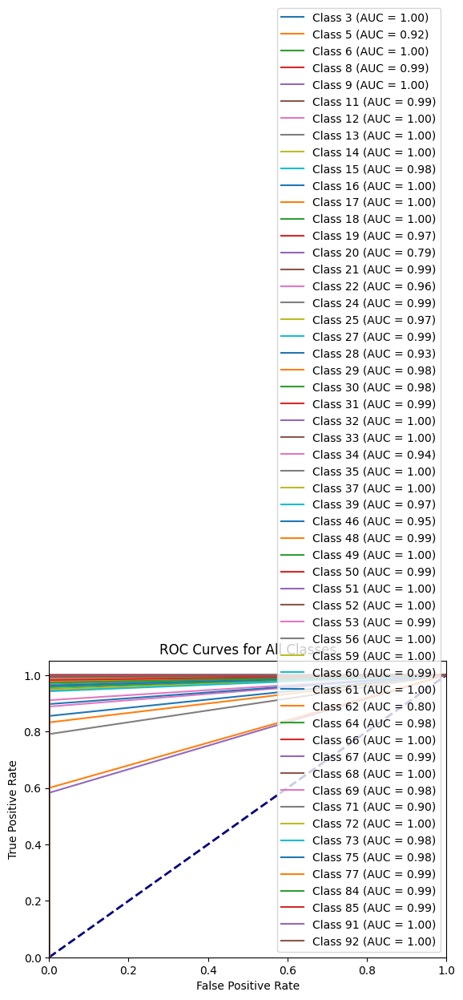

AUC for Class 0: 0.9974462767749837
AUC for Class 1: 0.9159677108850847
AUC for Class 2: 0.9992788026048781
AUC for Class 3: 0.9939095764155544
AUC for Class 4: 0.9969542902811812
AUC for Class 5: 0.9870428942890186
AUC for Class 6: 0.9963918223681059
AUC for Class 7: 0.9957272094055589
AUC for Class 8: 0.9961966354779989
AUC for Class 9: 0.9751976373263281
AUC for Class 10: 0.9999238295673284
AUC for Class 11: 0.9990287016273676
AUC for Class 12: 0.9999247246405113
AUC for Class 13: 0.973769460729728
AUC for Class 14: 0.7912923825970425
AUC for Class 15: 0.9878770017232305
AUC for Class 16: 0.9552523436524191
AUC for Class 17: 0.9940151572727052
AUC for Class 18: 0.9741110091080694
AUC for Class 19: 0.9924053123557778
AUC for Class 20: 0.9274091177836081
AUC for Class 21: 0.9798514981594277
AUC for Class 22: 0.9830058689204217
AUC for Class 23: 0.9941770649059564
AUC for Class 24: 0.9969297814103337
AUC for Class 25: 0.9952192828630392
AUC for Class 26: 0.9440724237353516
AUC for Clas

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=100, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knn_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /knn_Stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/knn_Stream_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Prueba con el 30 por ciento

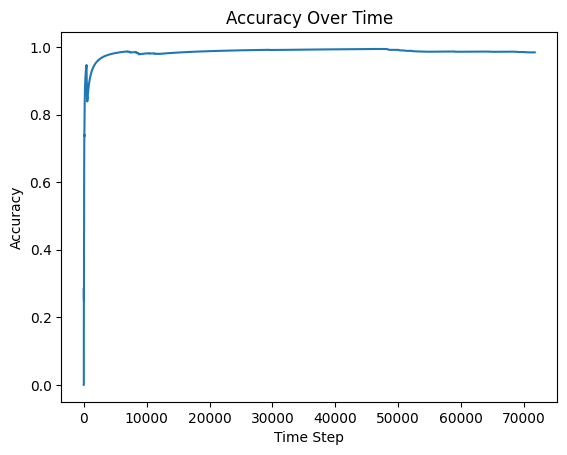

71724 samples analyzed.
Hoeffding accuracy: 0.9840360269923596
Precision: 0.8815268913404296
F1-score: 0.8733606005417395


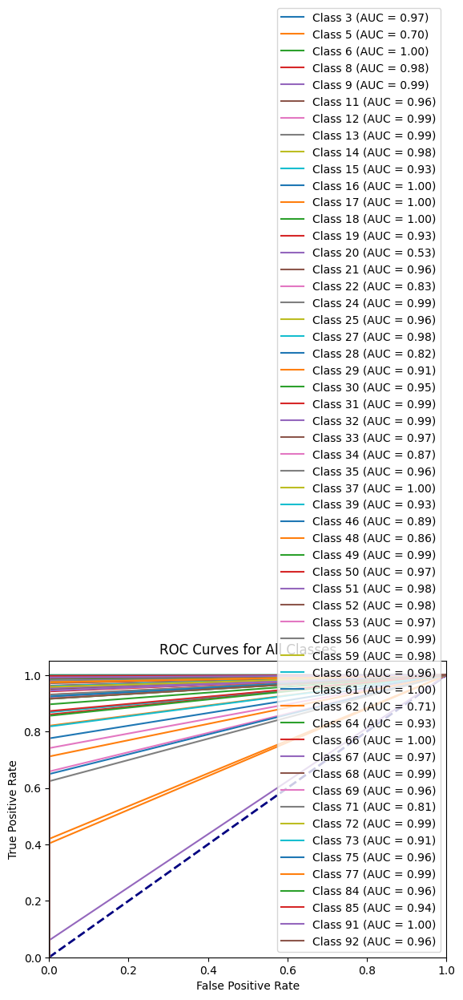

Average AUC (macro): 0.94
Accuracy for Class 3: 94.66%
Accuracy for Class 5: 40.35%
Accuracy for Class 6: 99.49%
Accuracy for Class 8: 96.24%
Accuracy for Class 9: 98.01%
Accuracy for Class 11: 91.62%
Accuracy for Class 12: 97.77%
Accuracy for Class 13: 97.78%
Accuracy for Class 14: 95.99%
Accuracy for Class 15: 86.79%
Accuracy for Class 16: 99.97%
Accuracy for Class 17: 99.02%
Accuracy for Class 18: 99.96%
Accuracy for Class 19: 86.00%
Accuracy for Class 20: 6.00%
Accuracy for Class 21: 93.06%
Accuracy for Class 22: 65.83%
Accuracy for Class 24: 97.06%
Accuracy for Class 25: 92.16%
Accuracy for Class 27: 96.11%
Accuracy for Class 28: 64.91%
Accuracy for Class 29: 82.03%
Accuracy for Class 30: 89.60%
Accuracy for Class 31: 97.30%
Accuracy for Class 32: 98.58%
Accuracy for Class 33: 94.93%
Accuracy for Class 34: 74.10%
Accuracy for Class 35: 92.96%
Accuracy for Class 37: 99.16%
Accuracy for Class 39: 86.96%
Accuracy for Class 46: 77.55%
Accuracy for Class 48: 71.13%
Accuracy for Class 4

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.bayes import NaiveBayes
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Dataset_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knn_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_stream_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

#####Evaluación cruzada

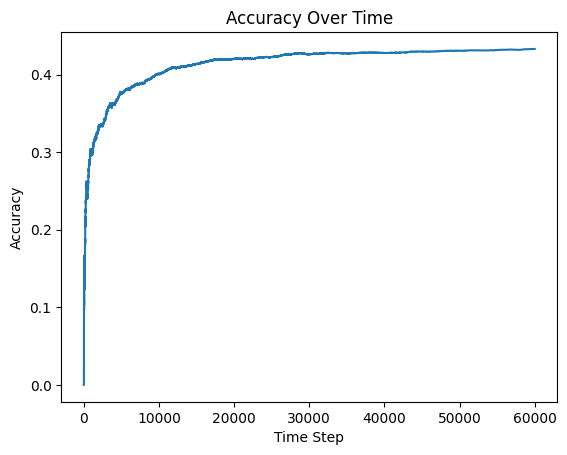

60000 samples analyzed.
Random Forest accuracy: 0.4330833333333333
Precision: 0.21572262780043258
F1-score: 0.16001709599693636


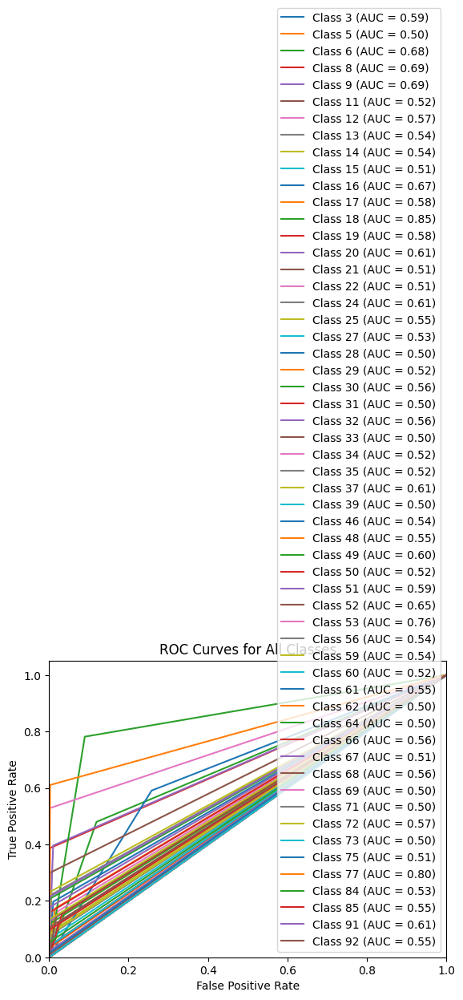

AUC for Class 0: 0.5932385502339483
AUC for Class 1: 0.4995496472236585
AUC for Class 2: 0.6801476209320364
AUC for Class 3: 0.6922813472321072
AUC for Class 4: 0.6927923970791644
AUC for Class 5: 0.5199621364428362
AUC for Class 6: 0.5705379674348757
AUC for Class 7: 0.5419811111623535
AUC for Class 8: 0.5424518907454348
AUC for Class 9: 0.5090841016173816
AUC for Class 10: 0.6662918965489175
AUC for Class 11: 0.5789046037519755
AUC for Class 12: 0.8458076746902213
AUC for Class 13: 0.5788723208909503
AUC for Class 14: 0.6070594654353286
AUC for Class 15: 0.5098081734778982
AUC for Class 16: 0.5090416024284412
AUC for Class 17: 0.6081904656732628
AUC for Class 18: 0.5475273167407662
AUC for Class 19: 0.5315295589615264
AUC for Class 20: 0.4999332888592395
AUC for Class 21: 0.5157065972726275
AUC for Class 22: 0.5584643681709144
AUC for Class 23: 0.49979968617500753
AUC for Class 24: 0.5636303946333696
AUC for Class 25: 0.5044285735970491
AUC for Class 26: 0.5194237263332363
AUC for Cl

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Dataset.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=10000, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 60000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/KNN_COMPLETO_TODAS_LAS_FILAS.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_COMPLETO_TODAS_LAS_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_COMPLETO_TODAS_LAS_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

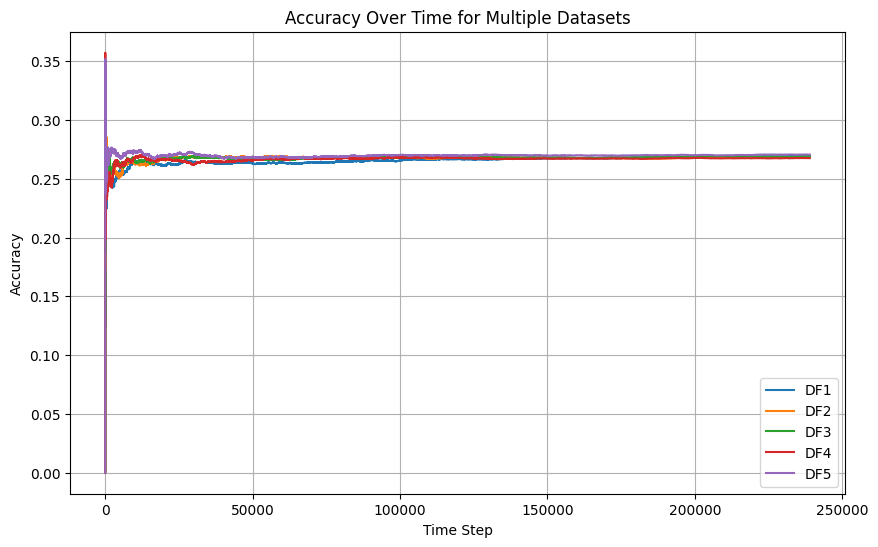

DF1 samples analyzed.
Accuracy: 0.26937110339344744
Precision: 0.2115782568956933
F1-score: 0.22931771181066302

DF2 samples analyzed.
Accuracy: 0.2682748232143604
Precision: 0.21065507404764572
F1-score: 0.2284207116444201

DF3 samples analyzed.
Accuracy: 0.268961044395163
Precision: 0.2115034528183357
F1-score: 0.22874514633565926

DF4 samples analyzed.
Accuracy: 0.267517469350182
Precision: 0.20997574318370646
F1-score: 0.22756805090066057

DF5 samples analyzed.
Accuracy: 0.2704883049499979
Precision: 0.2130646656427468
F1-score: 0.22991225801747905



In [ ]:
from skmultiflow.data import DataStream
from skmultiflow.lazy import KNNClassifier
from sklearn.metrics import accuracy_score, precision_score, f1_score
import matplotlib.pyplot as plt
import joblib

# Define tus conjuntos de datos df1, df2, ..., df10 en una lista
datasets = [df1, df2, df3, df4, df5]

# Variables para controlar el bucle
max_samples = 250000

# Listas para almacenar métricas y curvas de precisión por conjunto de datos
accuracy_scores = []
precision_scores = []
f1_scores = []

# Crear una figura para combinar las gráficas
plt.figure(figsize=(10, 6))

for idx, dataset in enumerate(datasets):

    target_idx = dataset.columns.get_loc("Activity")

    # Crear el flujo de datos
    stream = DataStream(dataset, target_idx=target_idx)


    modelo = KNNClassifier(n_neighbors=5, max_window_size=100, leaf_size=30)


    n_samples = 0
    correct_cnt = 0
    max_samples = 250000

    y_true = []
    y_pred = []


    accuracy_history = []


    while n_samples < max_samples and stream.has_more_samples():

        X, y = stream.next_sample()
        y_pred_batch = modelo.predict(X)

        y_true.append(y[0])
        y_pred.append(y_pred_batch[0])

        if y[0] == y_pred_batch[0]:
            correct_cnt += 1

        modelo = modelo.partial_fit(X, y)
        n_samples += 1


        accuracy = correct_cnt / n_samples
        accuracy_history.append(accuracy)

    # Agregar la gráfica de precisión al gráfico combinado
    plt.plot(range(len(accuracy_history)), accuracy_history, label=f'DF{idx + 1}')

    # Calcular métricas
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    accuracy_scores.append(accuracy)
    precision_scores.append(precision)
    f1_scores.append(f1)

# Configurar el gráfico combinado
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time for Multiple Datasets')
plt.legend(loc='lower right')  # Agregar leyenda
plt.grid(True)

# Mostrar el gráfico combinado
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas de los 10 lotes/KNN.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir métricas por conjunto de datos
for idx, (accuracy, precision, f1) in enumerate(zip(accuracy_scores, precision_scores, f1_scores)):
    print(f'DF{idx + 1} samples analyzed.')
    print(f'Accuracy: {accuracy}')
    print(f'Precision: {precision}')
    print(f'F1-score: {f1}')
    print()

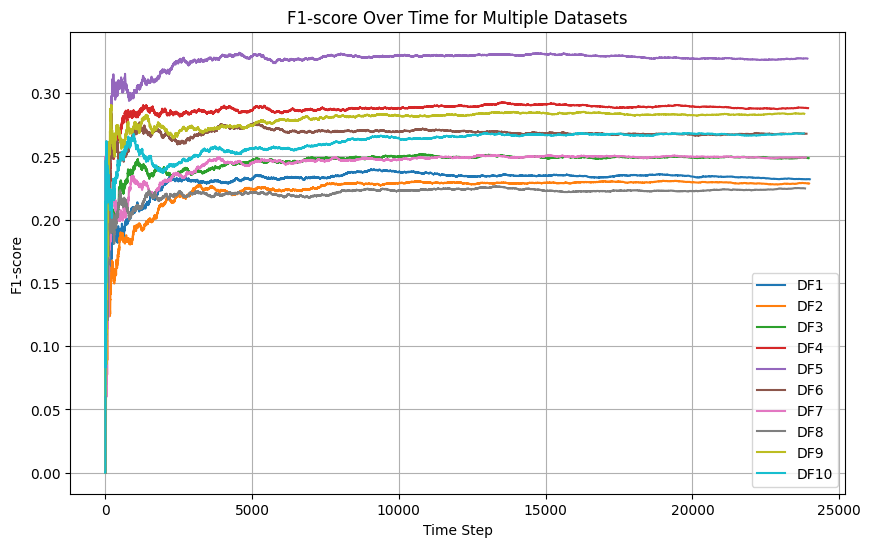

DF1 samples analyzed.
F1-score: 0.23200261276364031

DF2 samples analyzed.
F1-score: 0.2286910690576465

DF3 samples analyzed.
F1-score: 0.24866527938112318

DF4 samples analyzed.
F1-score: 0.2882096338303758

DF5 samples analyzed.
F1-score: 0.3273675825705642

DF6 samples analyzed.
F1-score: 0.26795176743420723

DF7 samples analyzed.
F1-score: 0.2490777495435223

DF8 samples analyzed.
F1-score: 0.22471092163517384

DF9 samples analyzed.
F1-score: 0.28373036633525256

DF10 samples analyzed.
F1-score: 0.2681668203877761



In [ ]:
from skmultiflow.data import DataStream
from skmultiflow.lazy import KNNClassifier
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# Define tus conjuntos de datos df1, df2, ..., df10 en una lista
datasets = [df1, df2, df3, df4, df5, df6, df7, df8, df9, df10]

# Variables para controlar el bucle
max_samples = 250000

# Lista para almacenar los valores de F1-score por conjunto de datos
f1_scores = []

# Crear una figura para las gráficas de F1-score
plt.figure(figsize=(10, 6))

for idx, dataset in enumerate(datasets):

    target_idx = dataset.columns.get_loc("Activity")

    # Crear el flujo de datos
    stream = DataStream(dataset, target_idx=target_idx)

    # Setup KNN Classifier
    modelo = KNNClassifier(n_neighbors=5, max_window_size=100, leaf_size=30)

    # Variables para el seguimiento del rendimiento
    n_samples = 0
    y_true = []
    y_pred = []
    f1_history = []

    # Entrenar el modelo y calcular el F1-score a lo largo del tiempo
    while n_samples < max_samples and stream.has_more_samples():

        X, y = stream.next_sample()
        y_pred_batch = modelo.predict(X)

        y_true.append(y[0])
        y_pred.append(y_pred_batch[0])

        modelo = modelo.partial_fit(X, y)
        n_samples += 1

        # Calcular el F1-score en el paso de tiempo actual
        f1 = f1_score(y_true, y_pred, average='weighted')
        f1_history.append(f1)

    # Agregar la gráfica del F1-score al gráfico combinado
    plt.plot(range(len(f1_history)), f1_history, label=f'DF{idx + 1}')

    # Calcular el F1-score final
    final_f1 = f1_score(y_true, y_pred, average='weighted')
    f1_scores.append(final_f1)

# Configurar el gráfico combinado
plt.xlabel('Time Step')
plt.ylabel('F1-score')
plt.title('F1-score Over Time for Multiple Datasets')
plt.legend(loc='lower right')  # Agregar leyenda
plt.grid(True)

# Mostrar el gráfico combinado
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas de los 10 lotes/F1_score.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir el F1-score por conjunto de datos
for idx, f1 in enumerate(f1_scores):
    print(f'DF{idx + 1} samples analyzed.')
    print(f'F1-score: {f1}')
    print()



####PRUEBA CON EL DATASET SIN 16

Realizamos pruebas con diferentes números de n y de window size

#####Entrenamiento con el 70 por ciento

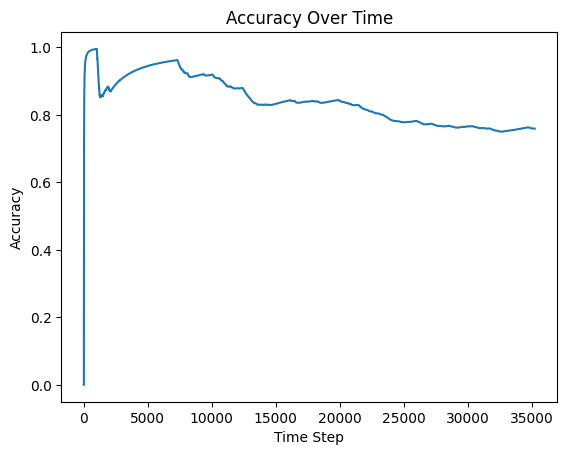

35249 samples analyzed.
Random Forest accuracy: 0.7590002553263923
Precision: 0.6159608648328405
F1-score: 0.576302714319369


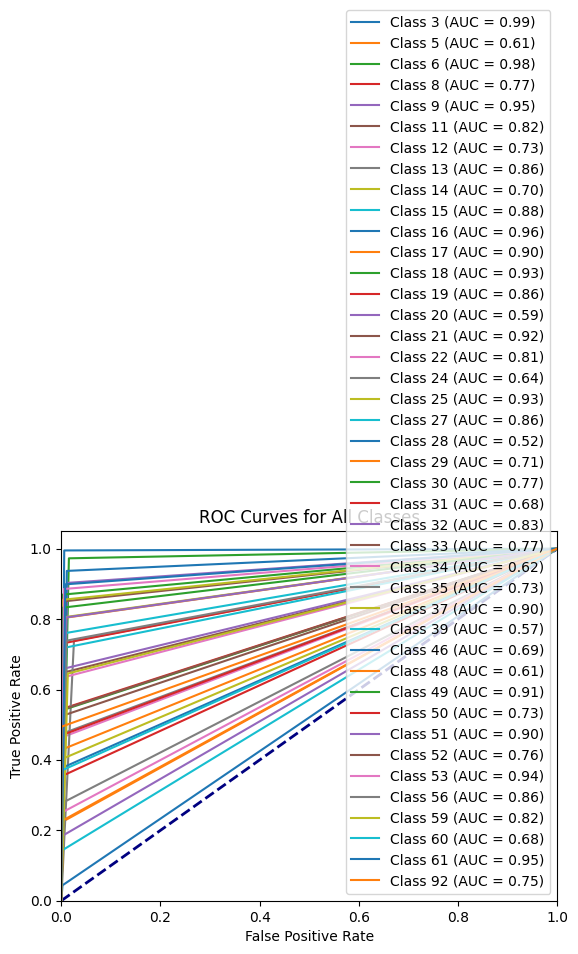

AUC for Class 0: 0.9945621214304246
AUC for Class 1: 0.6109720513196512
AUC for Class 2: 0.9786958926074856
AUC for Class 3: 0.7713767742060156
AUC for Class 4: 0.9454064187090703
AUC for Class 5: 0.8204962697558816
AUC for Class 6: 0.7316363104837592
AUC for Class 7: 0.8564396372957445
AUC for Class 8: 0.700014031163687
AUC for Class 9: 0.8791524334120906
AUC for Class 10: 0.9629138078501698
AUC for Class 11: 0.8981584515705627
AUC for Class 12: 0.9334356296727998
AUC for Class 13: 0.8641513992445825
AUC for Class 14: 0.591290116597078
AUC for Class 15: 0.9213618713410542
AUC for Class 16: 0.8146733589686064
AUC for Class 17: 0.637920780316849
AUC for Class 18: 0.92650832281024
AUC for Class 19: 0.8550724552356864
AUC for Class 20: 0.5206775120525092
AUC for Class 21: 0.7128384066704655
AUC for Class 22: 0.7690366242010744
AUC for Class 23: 0.6755389637458087
AUC for Class 24: 0.8270918682041996
AUC for Class 25: 0.7688628759038291
AUC for Class 26: 0.6243643308021462
AUC for Class 27

In [ ]:
#N igual a 5 y window size de 2000
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=2000, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

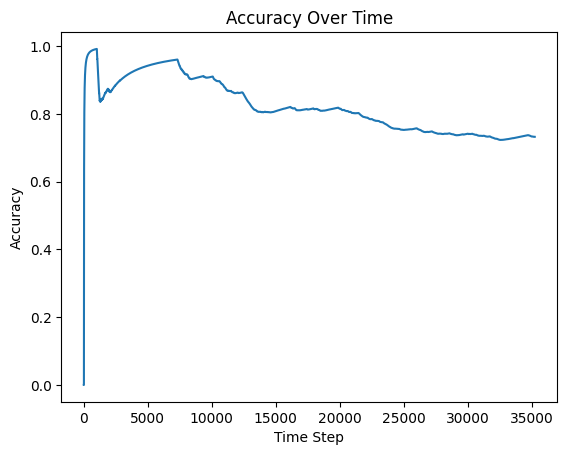

35249 samples analyzed.
Random Forest accuracy: 0.73258815852932
Precision: 0.5852124105755264
F1-score: 0.5405112649821612


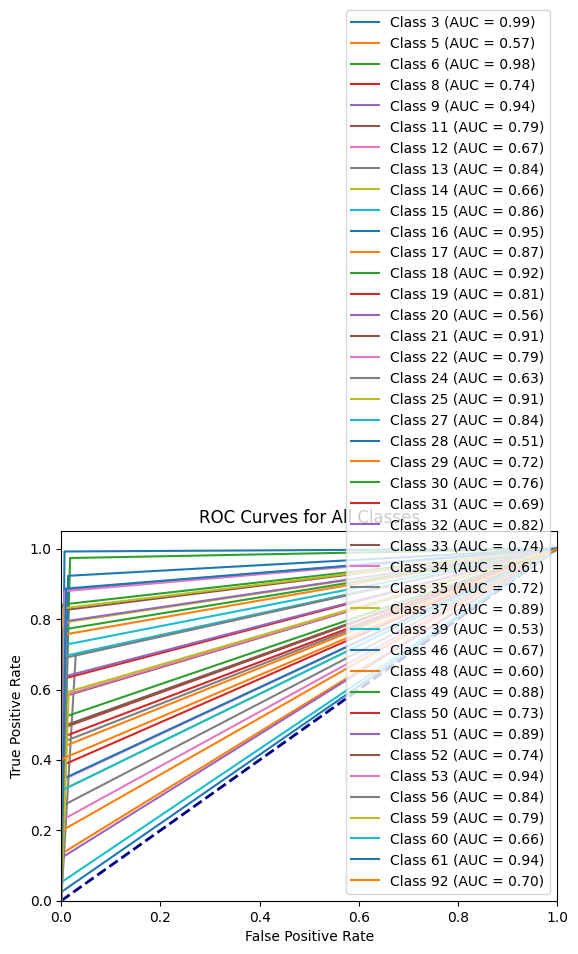

AUC for Class 0: 0.9927950708486232
AUC for Class 1: 0.5663810379966889
AUC for Class 2: 0.9778804820660358
AUC for Class 3: 0.7439564818303913
AUC for Class 4: 0.9356795892610807
AUC for Class 5: 0.786119276198946
AUC for Class 6: 0.6706891033634264
AUC for Class 7: 0.8351769331404181
AUC for Class 8: 0.6553184864891206
AUC for Class 9: 0.862471533490848
AUC for Class 10: 0.9546332607285737
AUC for Class 11: 0.8738952565423691
AUC for Class 12: 0.9190925090669496
AUC for Class 13: 0.8136600669302734
AUC for Class 14: 0.5607841778433377
AUC for Class 15: 0.9091247596106188
AUC for Class 16: 0.788825699274247
AUC for Class 17: 0.6337152665199819
AUC for Class 18: 0.9143546091149121
AUC for Class 19: 0.8431623868422693
AUC for Class 20: 0.5122755836510303
AUC for Class 21: 0.7160178469152643
AUC for Class 22: 0.758308299785619
AUC for Class 23: 0.6905039807785093
AUC for Class 24: 0.8157233603890695
AUC for Class 25: 0.7449172994417997
AUC for Class 26: 0.6135685300661172
AUC for Class 2

In [ ]:
#8 vecinos y windows size de 2000
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=8, max_window_size=2000, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_8.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_8.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_8.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

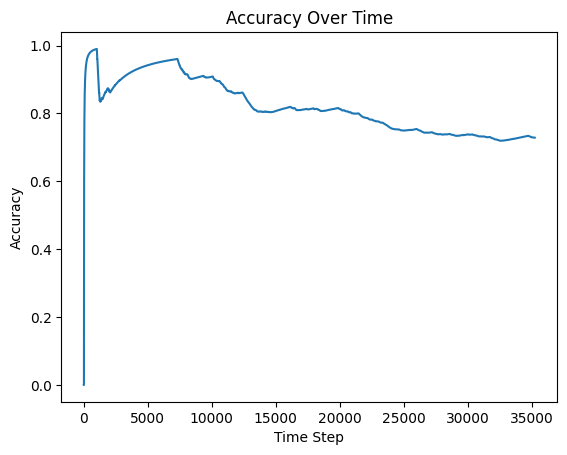

35249 samples analyzed.
Random Forest accuracy: 0.7286447842491985
Precision: 0.5845543742460252
F1-score: 0.5361708730927954


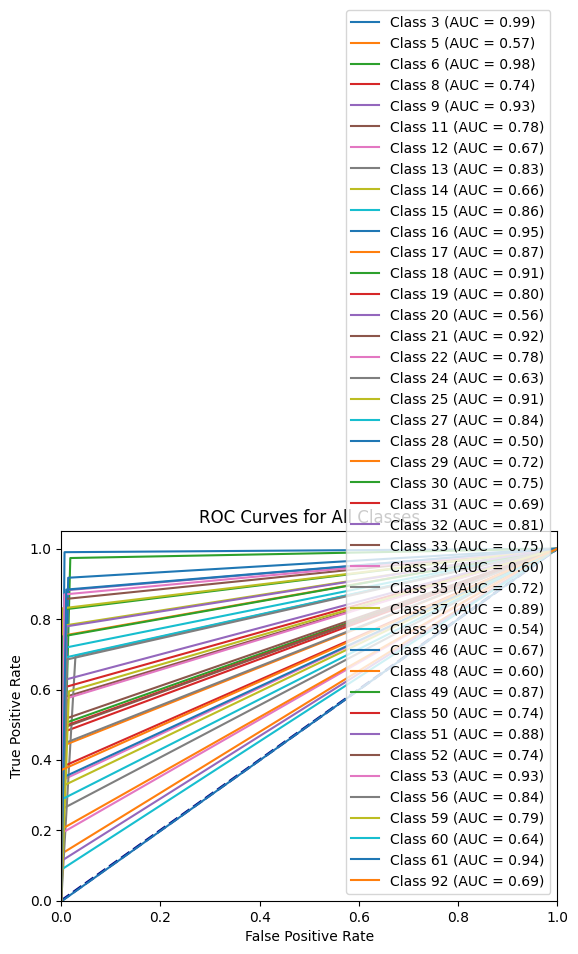

AUC for Class 0: 0.9918117866794983
AUC for Class 1: 0.5663810379966889
AUC for Class 2: 0.9776913551446782
AUC for Class 3: 0.7379130023092456
AUC for Class 4: 0.9344652732978374
AUC for Class 5: 0.784632504013648
AUC for Class 6: 0.6707175059991909
AUC for Class 7: 0.8335268108202929
AUC for Class 8: 0.6610680728163525
AUC for Class 9: 0.8583048668241813
AUC for Class 10: 0.9517924691562338
AUC for Class 11: 0.8724096576672907
AUC for Class 12: 0.9119099122438651
AUC for Class 13: 0.8009980935158009
AUC for Class 14: 0.5564363517563812
AUC for Class 15: 0.9247239593511823
AUC for Class 16: 0.7832940630168578
AUC for Class 17: 0.6294101341200522
AUC for Class 18: 0.9143830788658018
AUC for Class 19: 0.8406720972455178
AUC for Class 20: 0.4990180731464352
AUC for Class 21: 0.7174849296116068
AUC for Class 22: 0.7493867125862329
AUC for Class 23: 0.6884477212154652
AUC for Class 24: 0.8107284764798792
AUC for Class 25: 0.7541376919411883
AUC for Class 26: 0.5953171295570945
AUC for Clas

In [ ]:
#10 vecinos
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=10, max_window_size=2000, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_10.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_10.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_10.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

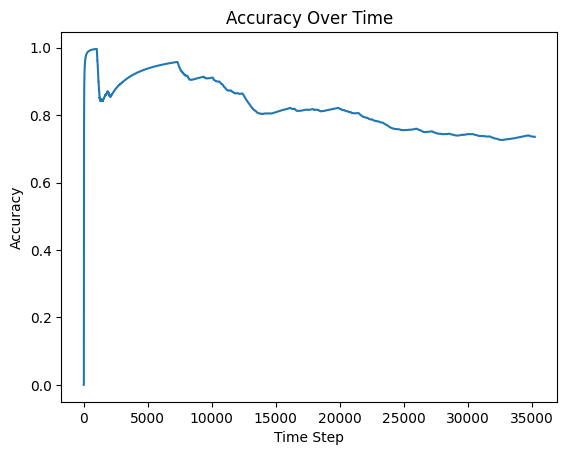

35249 samples analyzed.
Random Forest accuracy: 0.7355953360379018
Precision: 0.5869159989623217
F1-score: 0.546945843277928


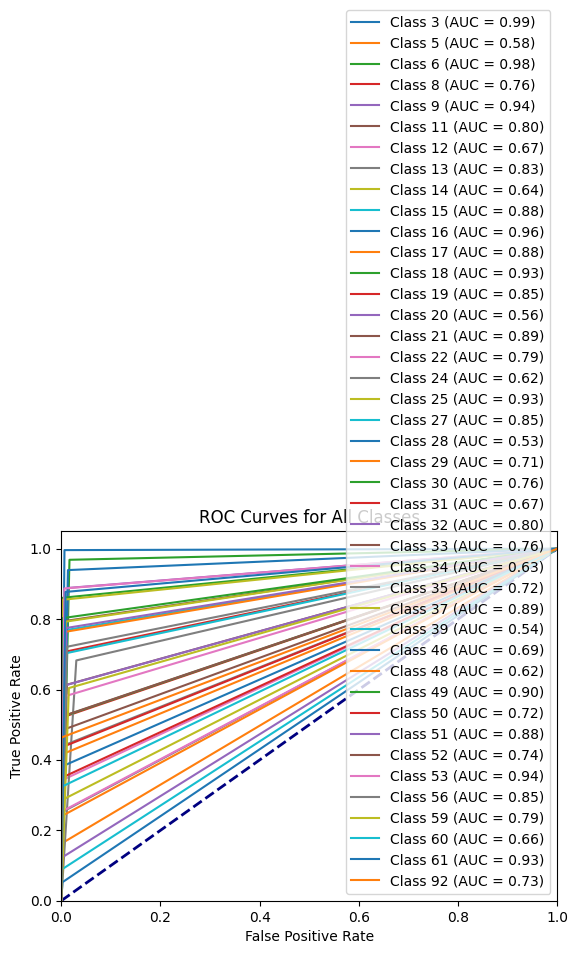

AUC for Class 0: 0.9948200640524958
AUC for Class 1: 0.5808650043248091
AUC for Class 2: 0.9760036660874446
AUC for Class 3: 0.7591883629477182
AUC for Class 4: 0.93767746554464
AUC for Class 5: 0.8011900173282344
AUC for Class 6: 0.6706464994097794
AUC for Class 7: 0.8261771882611798
AUC for Class 8: 0.6419535337253689
AUC for Class 9: 0.8833191000787572
AUC for Class 10: 0.9629390492793637
AUC for Class 11: 0.8779144156406967
AUC for Class 12: 0.928798194926856
AUC for Class 13: 0.8514751929806936
AUC for Class 14: 0.5607984090723467
AUC for Class 15: 0.8930125639740224
AUC for Class 16: 0.7871295450869494
AUC for Class 17: 0.624976920659042
AUC for Class 18: 0.9264371484330157
AUC for Class 19: 0.8467137465247994
AUC for Class 20: 0.5251204002606488
AUC for Class 21: 0.7059889764766406
AUC for Class 22: 0.7599432009332976
AUC for Class 23: 0.673239944143923
AUC for Class 24: 0.8027757576627703
AUC for Class 25: 0.7593991535063527
AUC for Class 26: 0.6258840876410519
AUC for Class 27

In [ ]:
#4 vecinos
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=4, max_window_size=2000, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_4.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_4.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_4.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

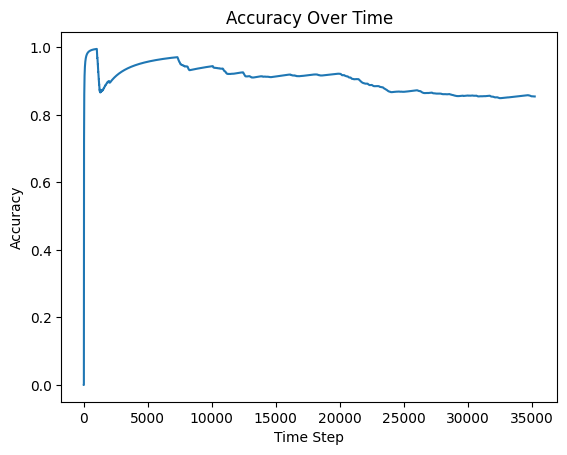

35249 samples analyzed.
Random Forest accuracy: 0.8542653692303328
Precision: 0.702315142307686
F1-score: 0.6840821101669567


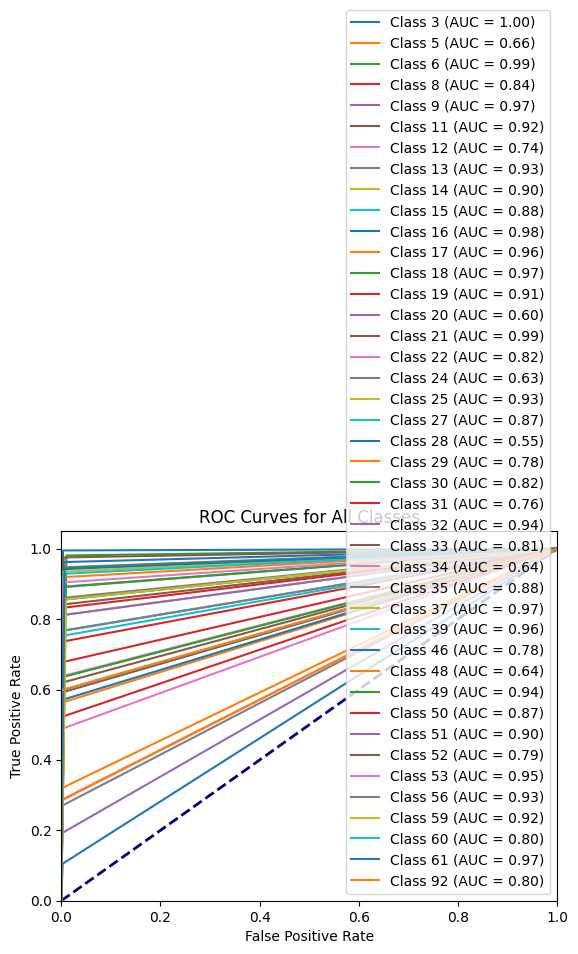

In [ ]:
##Sabiendo que con 5 vecinos se consigue el accuracy mayor, ahora haremos una prueba con max window size
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=1000, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_cambios.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_5_cambios.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_5_cambios.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

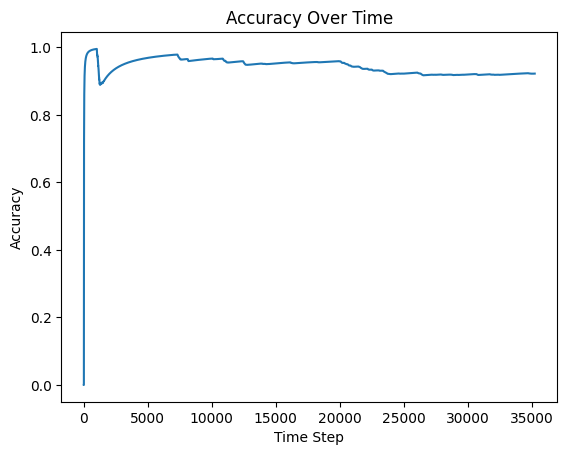

35249 samples analyzed.
Random Forest accuracy: 0.9220119719708361
Precision: 0.8111529692800541
F1-score: 0.7807466214895279


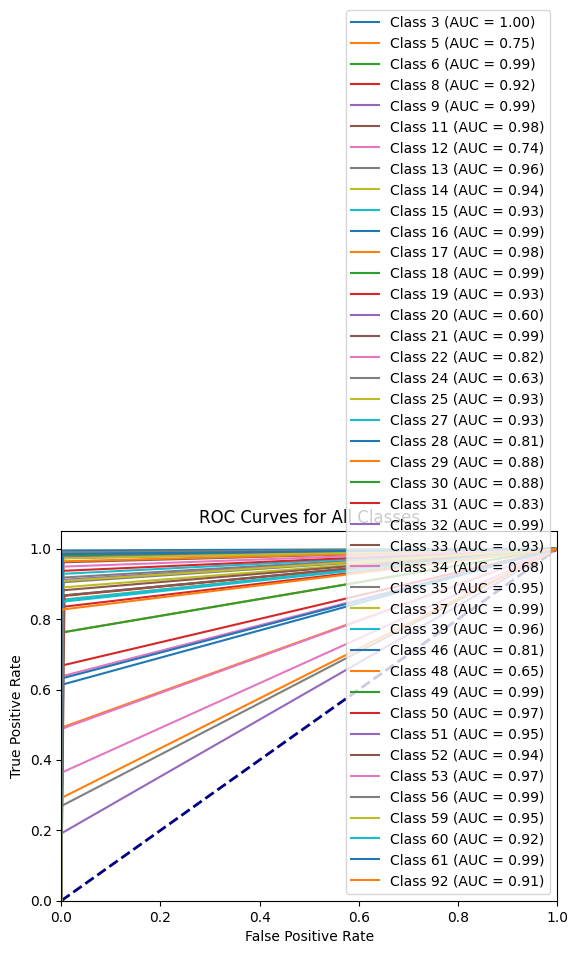

AUC for Class 0: 0.9963878984811374
AUC for Class 1: 0.7452292148824438
AUC for Class 2: 0.9910586852742046
AUC for Class 3: 0.9165507019527136
AUC for Class 4: 0.9861092143117702
AUC for Class 5: 0.9786122553406378
AUC for Class 6: 0.7439024390243902
AUC for Class 7: 0.9567886321792373
AUC for Class 8: 0.9443242409652214
AUC for Class 9: 0.9332764003150295
AUC for Class 10: 0.9913416716545038
AUC for Class 11: 0.9815885168078559
AUC for Class 12: 0.9900842048832802
AUC for Class 13: 0.931534851344466
AUC for Class 14: 0.5955952489970078
AUC for Class 15: 0.9858249037734407
AUC for Class 16: 0.817613258688427
AUC for Class 17: 0.6343129781383573
AUC for Class 18: 0.9272485363333717
AUC for Class 19: 0.9258615633819879
AUC for Class 20: 0.8059075395904021
AUC for Class 21: 0.8799569056602674
AUC for Class 22: 0.8801076373541249
AUC for Class 23: 0.8334713531000973
AUC for Class 24: 0.9870094640777535
AUC for Class 25: 0.9304904598786069
AUC for Class 26: 0.6813685297179485
AUC for Class

In [ ]:
##Con max window size igual a 1000 mejoro bastante el accuracy, ahora bajaremos a 500
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=500, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_500.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_5_500.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_5_500.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

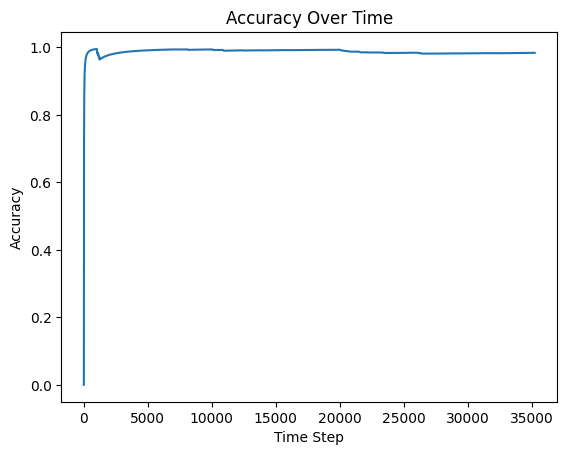

35249 samples analyzed.
Random Forest accuracy: 0.9835456325002128
Precision: 0.9221847126280295
F1-score: 0.9185145974742467


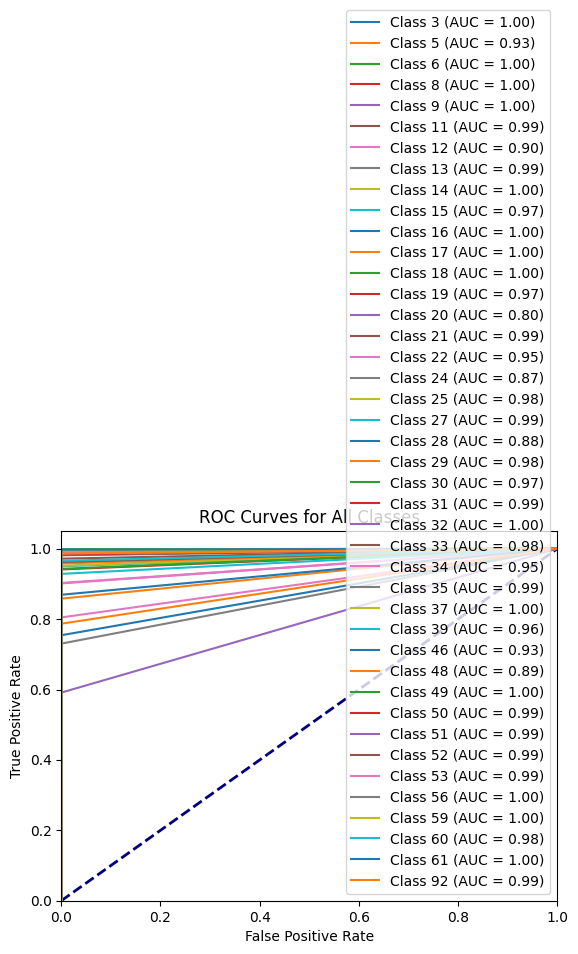

AUC for Class 0: 0.9972642714654795
AUC for Class 1: 0.9288054600980574
AUC for Class 2: 0.9982288919437017
AUC for Class 3: 0.9971304289013209
AUC for Class 4: 0.9961847528480443
AUC for Class 5: 0.9856037305048053
AUC for Class 6: 0.9023254138471855
AUC for Class 7: 0.9936720059522531
AUC for Class 8: 0.9960570606734287
AUC for Class 9: 0.974957300236272
AUC for Class 10: 0.9991991430153193
AUC for Class 11: 0.998074399673344
AUC for Class 12: 0.9988602842231192
AUC for Class 13: 0.9699192913715444
AUC for Class 14: 0.7956094802260167
AUC for Class 15: 0.9902984828916399
AUC for Class 16: 0.9502867533118025
AUC for Class 17: 0.8651320039302942
AUC for Class 18: 0.9756641028584548
AUC for Class 19: 0.991439189429776
AUC for Class 20: 0.8768372118570228
AUC for Class 21: 0.9786820982391609
AUC for Class 22: 0.9713425831515771
AUC for Class 23: 0.9935741812697414
AUC for Class 24: 0.9950051160908095
AUC for Class 25: 0.9806145224557057
AUC for Class 26: 0.9511816414070198
AUC for Class 

In [ ]:
##Con max window size igual a 500 mejoro bastante el accuracy, ahora bajaremos a 100
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=100, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_100.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_5_100.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_5_100.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

In [ ]:
##Con max window size igual a 500 mejoro bastante el accuracy, ahora bajaremos a 100
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=20000, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

#joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_100.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
#plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_5_100.png', dpi=300, bbox_inches='tight')
plt.show()



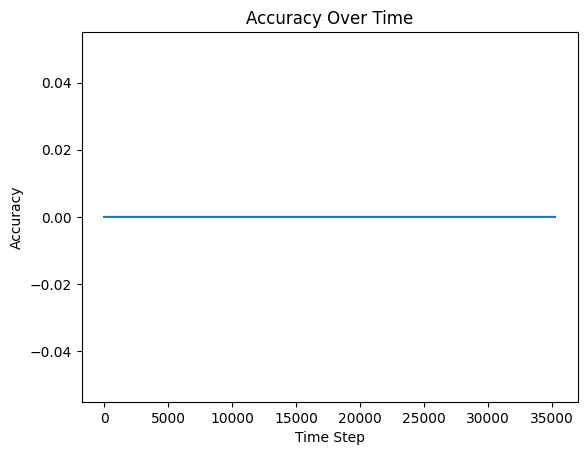

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


35249 samples analyzed.
Random Forest accuracy: 0.0
Precision: 0.0
F1-score: 0.0


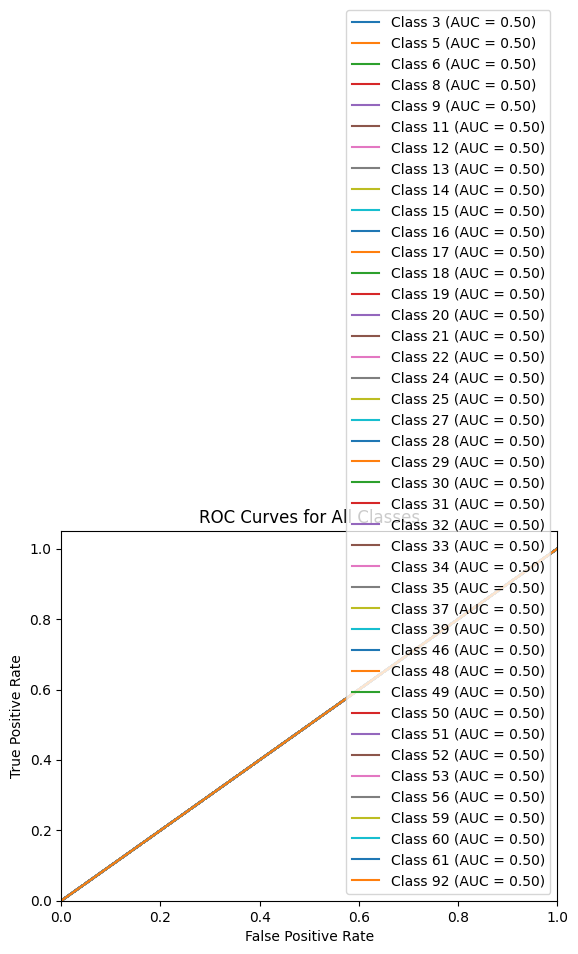

AUC for Class 0: 0.5
AUC for Class 1: 0.5
AUC for Class 2: 0.5
AUC for Class 3: 0.5
AUC for Class 4: 0.5
AUC for Class 5: 0.5
AUC for Class 6: 0.5
AUC for Class 7: 0.5
AUC for Class 8: 0.5
AUC for Class 9: 0.5
AUC for Class 10: 0.5
AUC for Class 11: 0.5
AUC for Class 12: 0.5
AUC for Class 13: 0.5
AUC for Class 14: 0.5
AUC for Class 15: 0.5
AUC for Class 16: 0.5
AUC for Class 17: 0.5
AUC for Class 18: 0.5
AUC for Class 19: 0.5
AUC for Class 20: 0.5
AUC for Class 21: 0.5
AUC for Class 22: 0.5
AUC for Class 23: 0.5
AUC for Class 24: 0.5
AUC for Class 25: 0.5
AUC for Class 26: 0.5
AUC for Class 27: 0.5
AUC for Class 28: 0.5
AUC for Class 29: 0.5
AUC for Class 30: 0.5
AUC for Class 31: 0.5
AUC for Class 32: 0.5
AUC for Class 33: 0.5
AUC for Class 34: 0.5
AUC for Class 35: 0.5
AUC for Class 36: 0.5
AUC for Class 37: 0.5
AUC for Class 38: 0.5
AUC for Class 39: 0.5
AUC for Class 40: 0.5
AUC for Class 41: 0.5
Average AUC (macro): 0.50


In [ ]:
##Con max window size igual a 500 mejoro bastante el accuracy, ahora bajaremos a 1
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=1, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_1.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_5_1.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_5_1.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

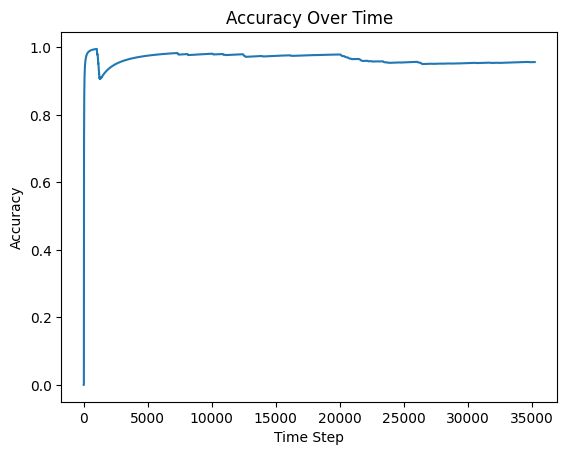

35249 samples analyzed.
Random Forest accuracy: 0.9561122301341882
Precision: 0.8563181795402297
F1-score: 0.8426124967336617


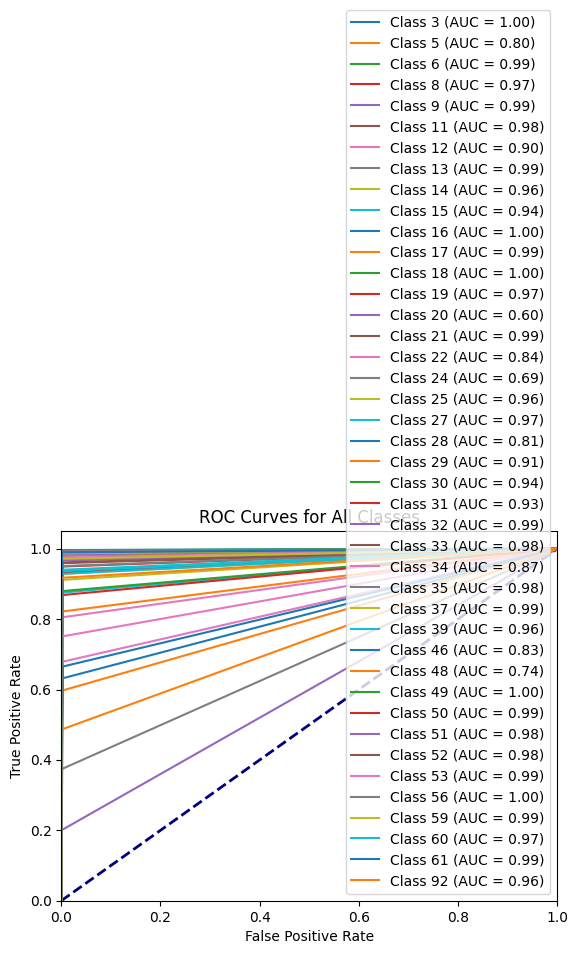

AUC for Class 0: 0.9967238414584685
AUC for Class 1: 0.7976104101449183
AUC for Class 2: 0.994077521454789
AUC for Class 3: 0.9742463646289263
AUC for Class 4: 0.9924064258969415
AUC for Class 5: 0.9834751097957591
AUC for Class 6: 0.9023254138471855
AUC for Class 7: 0.9877796731512619
AUC for Class 8: 0.9639206713808227
AUC for Class 9: 0.9375
AUC for Class 10: 0.9976326970289949
AUC for Class 11: 0.9908183089415705
AUC for Class 12: 0.9977956074665294
AUC for Class 13: 0.9650913653249515
AUC for Class 14: 0.5999430750839643
AUC for Class 15: 0.9863236497834725
AUC for Class 16: 0.8383295680439103
AUC for Class 17: 0.6865295848688624
AUC for Class 18: 0.955417403283205
AUC for Class 19: 0.9669910579700287
AUC for Class 20: 0.8148644701265045
AUC for Class 21: 0.9101972934753197
AUC for Class 22: 0.9393151263012354
AUC for Class 23: 0.9339711531800653
AUC for Class 24: 0.9917753709418926
AUC for Class 25: 0.9783215592186135
AUC for Class 26: 0.8747212908706657
AUC for Class 27: 0.97508

In [ ]:
##Con max window size igual a 500 mejoro bastante el accuracy, ahora bajaremos a 250
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=250, leaf_size=40)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_250.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_sin_16_70_5_250.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_sin_16_70_5_250.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Tomando todos los datos

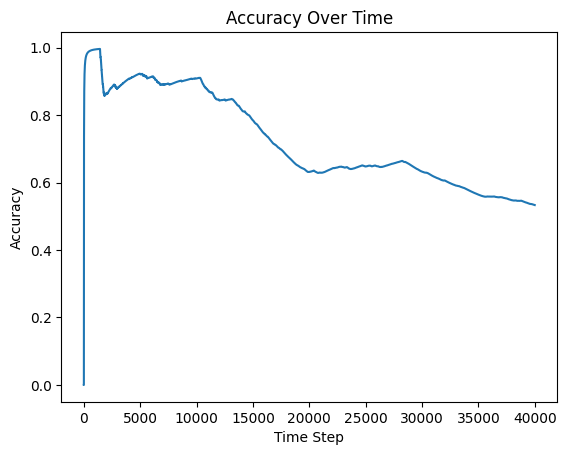

40000 samples analyzed.
Random Forest accuracy: 0.53345
Precision: 0.5029413874576605
F1-score: 0.3037560086431045


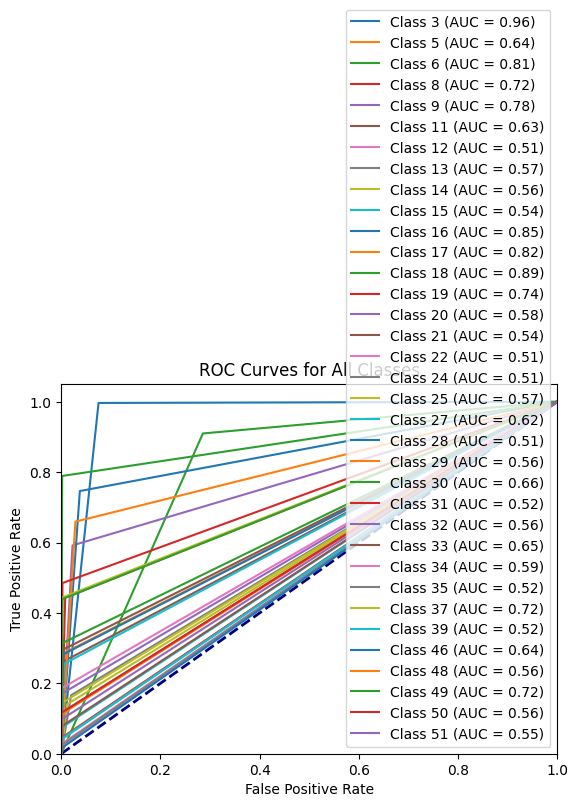

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

# Aleatoriza el DataFrame
df = Datasetsin16.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=None, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 40000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/KNN_TODAS_LAS_FILAS.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_TODAS_LAS_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_TODAS_LAS_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Tomando todos los datos, pero con el dataset random

In [ ]:
np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsin16.sample(frac=1)


In [ ]:
df

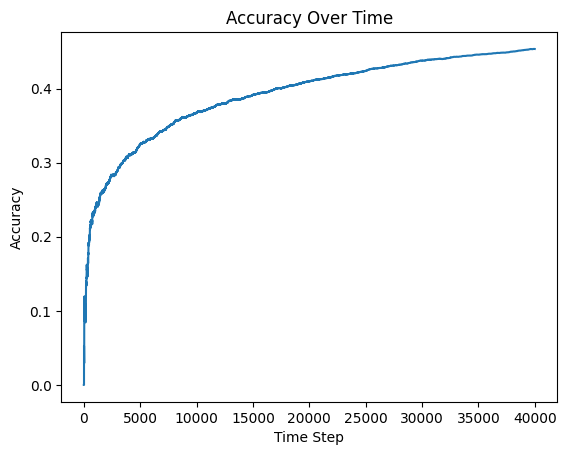

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40000 samples analyzed.
Random Forest accuracy: 0.453425
Precision: 0.3423247664855264
F1-score: 0.29819898566819186


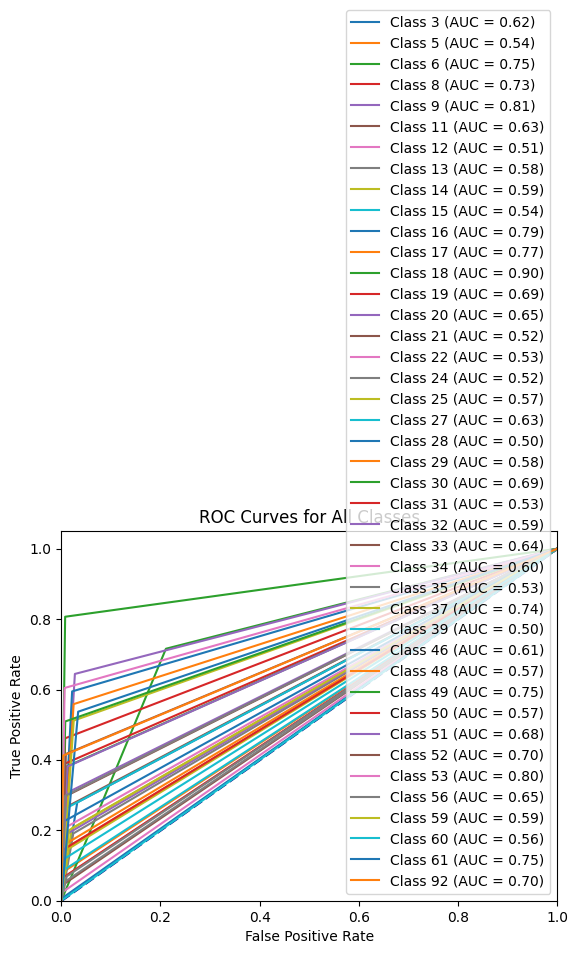

AUC for Class 0: 0.6235106601918791
AUC for Class 1: 0.5389078513058112
AUC for Class 2: 0.7524350538972893
AUC for Class 3: 0.7268051770944238
AUC for Class 4: 0.8084159662293865
AUC for Class 5: 0.6286194689618891
AUC for Class 6: 0.5109859703277297
AUC for Class 7: 0.5833833881075255
AUC for Class 8: 0.592126995445897
AUC for Class 9: 0.5412053510881822
AUC for Class 10: 0.7863925693909656
AUC for Class 11: 0.7667901732724511
AUC for Class 12: 0.8994741962714435
AUC for Class 13: 0.6920405520034295
AUC for Class 14: 0.6490831462723331
AUC for Class 15: 0.5210405250647485
AUC for Class 16: 0.5306837879749882
AUC for Class 17: 0.5235211153227907
AUC for Class 18: 0.5673669238012164
AUC for Class 19: 0.6261452462867727
AUC for Class 20: 0.5027911500049782
AUC for Class 21: 0.5761641406758261
AUC for Class 22: 0.6863565386978019
AUC for Class 23: 0.5310469144123152
AUC for Class 24: 0.5897040819013182
AUC for Class 25: 0.6444711554855385
AUC for Class 26: 0.6001516646612883
AUC for Clas

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsin16.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=None, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 40000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/KNN_TODAS_LAS_FILAS.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_TODAS_LAS_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_TODAS_LAS_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Entrenamiento con el 30 por ciento

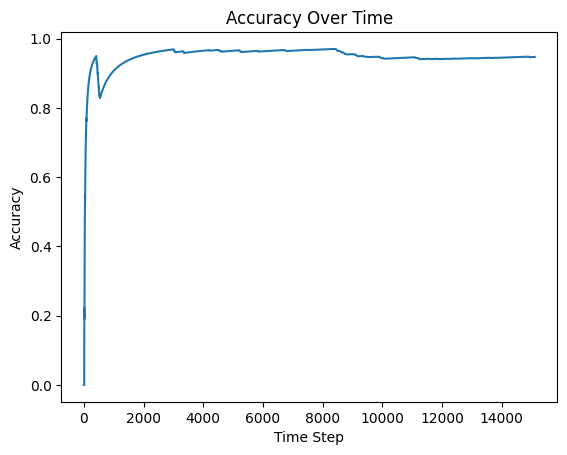

15111 samples analyzed.
Hoeffding accuracy: 0.9471246112103765
Precision: 0.843573920073114
F1-score: 0.8327434926959926


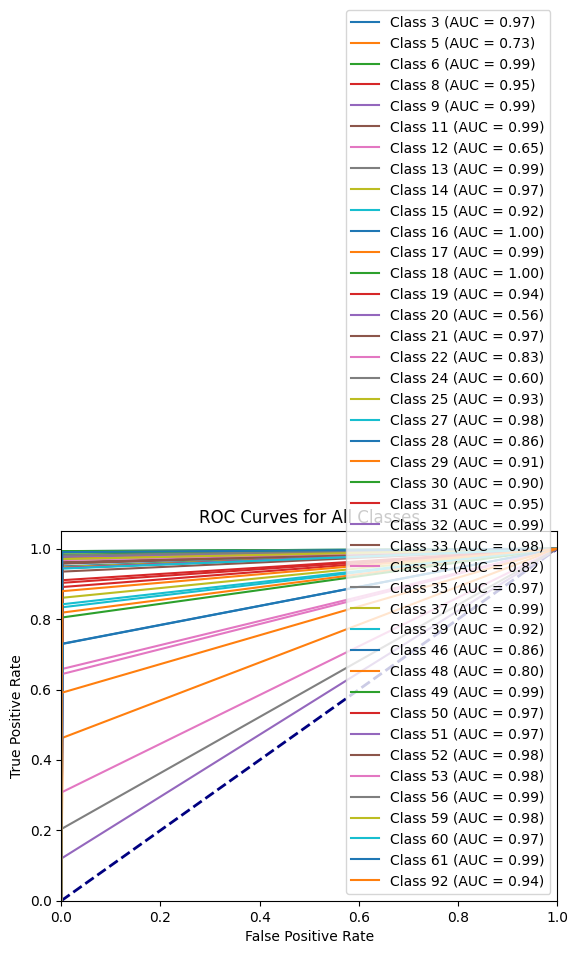

Average AUC (macro): 0.92
Accuracy for Class 3: 94.99%
Accuracy for Class 5: 46.30%
Accuracy for Class 6: 98.31%
Accuracy for Class 8: 91.05%
Accuracy for Class 9: 97.94%
Accuracy for Class 11: 97.59%
Accuracy for Class 12: 30.77%
Accuracy for Class 13: 97.29%
Accuracy for Class 14: 94.78%
Accuracy for Class 15: 83.33%
Accuracy for Class 16: 99.31%
Accuracy for Class 17: 97.10%
Accuracy for Class 18: 99.32%
Accuracy for Class 19: 89.13%
Accuracy for Class 20: 12.00%
Accuracy for Class 21: 93.51%
Accuracy for Class 22: 65.87%
Accuracy for Class 24: 20.41%
Accuracy for Class 25: 86.05%
Accuracy for Class 27: 95.85%
Accuracy for Class 28: 72.97%
Accuracy for Class 29: 81.85%
Accuracy for Class 30: 80.45%
Accuracy for Class 31: 90.30%
Accuracy for Class 32: 97.78%
Accuracy for Class 33: 95.77%
Accuracy for Class 34: 64.39%
Accuracy for Class 35: 94.52%
Accuracy for Class 37: 98.99%
Accuracy for Class 39: 84.21%
Accuracy for Class 46: 73.04%
Accuracy for Class 48: 59.05%
Accuracy for Class 

In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsin16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70_5_100.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_stream_sin_16_30_5_100.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNNs_stream_sin_16_30_5_100.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib


np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsin16.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=None, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 20000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/Random_Forests_5_Actividades_100_por_ciento.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /Random_Forests_5_Actividades_100_por_ciento.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/Random_Forests_5_Actividades_100_por_ciento.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

In [ ]:
import joblib
from skmultiflow.data import SEAGenerator
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Cargar el modelo entrenado
modelo_entrenado = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsin16_70.pkl')

df_nuevo = Datasetsin16_30.copy()

# Suponiendo que tienes las etiquetas verdaderas para el conjunto de datos nuevo en df_nuevo
X_nuevo = df_nuevo.drop("Activity", axis=1)
y_true_nuevo = df_nuevo["Activity"]

y_pred_nuevo = []

for index, row in X_nuevo.iterrows():
    prediction = modelo_entrenado.predict([row])  # Predecir una sola fila a la vez
    y_pred_nuevo.append(prediction[0])

# Convertir la lista de predicciones a un array numpy
y_pred_nuevo = np.array(y_pred_nuevo)

# Calcular métricas de evaluación
accuracy_nuevo = accuracy_score(y_true_nuevo, y_pred_nuevo)
precision_nuevo = precision_score(y_true_nuevo, y_pred_nuevo, average='weighted')
f1_nuevo = f1_score(y_true_nuevo, y_pred_nuevo, average='weighted')

# Imprimir las métricas
print(f'Accuracy en el conjunto de datos nuevo: {accuracy_nuevo}')
print(f'Precision en el conjunto de datos nuevo: {precision_nuevo}')
print(f'F1-score en el conjunto de datos nuevo: {f1_nuevo}')


Accuracy en el conjunto de datos nuevo: 0.0700152207001522
Precision en el conjunto de datos nuevo: 0.00591311827264946
F1-score en el conjunto de datos nuevo: 0.010891314569303477


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
y_pred_nuevo

array([92, 61, 61, ..., 92, 92, 92])

In [ ]:
X_nuevo

,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,X_Gyro_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,0.537785,0.214547,0.238416,0.000000,0.000000,0.000000,-0.079838,0.447208,0.325525,0.000000,...,0.000000,8.739016,8.692726,8.655216,-0.000000,-0.000000,-0.000000,3,1,2
1,0.146831,0.931747,0.136279,0.000000,0.000000,0.000000,0.069386,-0.053622,0.055953,0.000000,...,0.000000,8.687216,8.629506,8.692196,-0.000000,-0.000000,-0.000000,3,1,2
2,0.730725,0.684227,0.181553,0.000000,0.000000,0.000000,-0.258809,-0.241150,0.140762,0.000000,...,0.000000,8.515138,8.476950,8.439441,-0.000000,-0.000000,-0.000000,3,1,2
3,0.279110,0.848683,0.116995,0.000000,0.000000,0.000000,0.302856,-0.623030,0.079638,0.000000,...,0.000000,8.237375,8.065286,8.369879,-0.000000,-0.000000,-0.000000,3,1,2
4,0.617520,0.192193,0.268963,0.000000,0.000000,0.000000,-0.090725,0.466656,0.195675,0.000000,...,0.000000,8.673874,8.671138,8.624196,-0.000000,-0.000000,-0.000000,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15106,0.007558,0.003333,0.003188,0.006162,0.011898,0.007995,0.375582,-0.403672,-0.837405,-0.021141,...,0.006194,7.075795,6.771838,6.747486,4.400783,5.083398,4.540574,2,0,2
15107,0.008312,0.004787,0.004903,0.008939,0.017635,0.011453,0.378643,-0.402928,-0.836702,-0.021448,...,0.008415,7.149399,6.947903,6.977436,4.752563,5.409928,4.987851,2,0,2
15108,0.006371,0.003290,0.002713,0.005254,0.011685,0.005888,0.381591,-0.402140,-0.836287,-0.021571,...,0.004958,7.010564,6.806376,6.727816,4.245103,5.034033,4.327928,2,0,2
15109,0.007988,0.004164,0.003417,0.006838,0.014063,0.008177,0.388996,-0.394938,-0.835420,-0.021659,...,0.006536,7.216335,6.956820,6.845188,4.574885,5.283495,4.762337,2,0,2


In [ ]:
predicciones

array([92])

#####Random

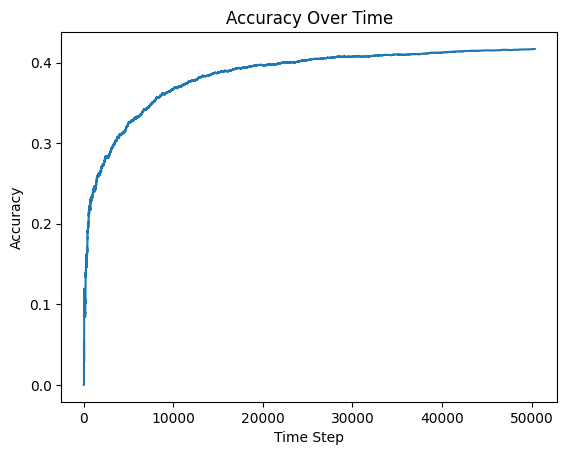

50360 samples analyzed.
Random Forest accuracy: 0.4169380460683082
Precision: 0.30185805165885243
F1-score: 0.26287618508706384


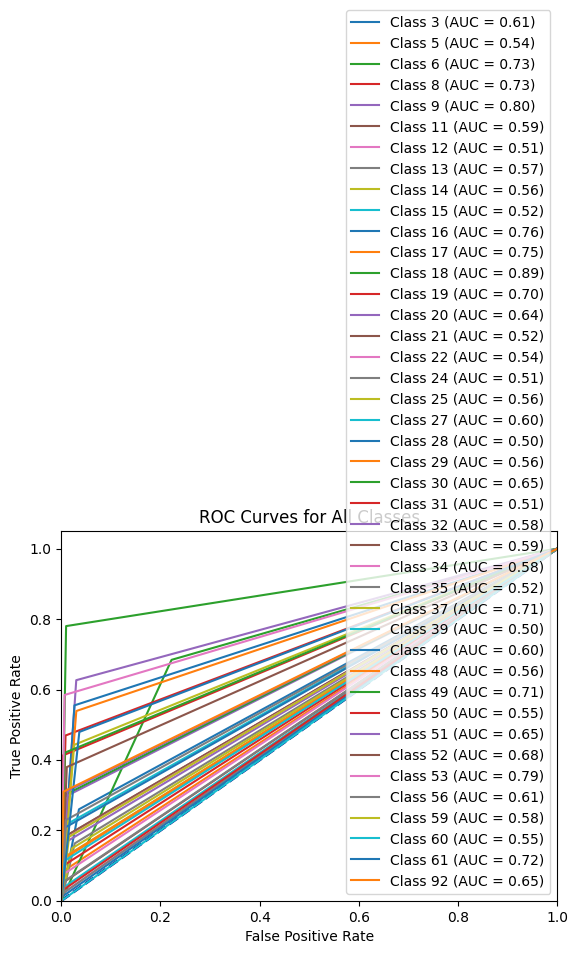

AUC for Class 0: 0.6120408688002015
AUC for Class 1: 0.5400418305709211
AUC for Class 2: 0.7309820499267782
AUC for Class 3: 0.7304024690630986
AUC for Class 4: 0.7981777989235003
AUC for Class 5: 0.5875013357698335
AUC for Class 6: 0.5089312665744902
AUC for Class 7: 0.5678515860959444
AUC for Class 8: 0.5635253850376095
AUC for Class 9: 0.5165838254108509
AUC for Class 10: 0.7642242151777183
AUC for Class 11: 0.7543199957096014
AUC for Class 12: 0.8852231557275175
AUC for Class 13: 0.7049549182430943
AUC for Class 14: 0.6447871483034348
AUC for Class 15: 0.5238833213345991
AUC for Class 16: 0.5355284227381906
AUC for Class 17: 0.5089072785898788
AUC for Class 18: 0.5590335079049957
AUC for Class 19: 0.6030313218249703
AUC for Class 20: 0.5048407944755149
AUC for Class 21: 0.5568107755837151
AUC for Class 22: 0.6472276727364024
AUC for Class 23: 0.5133748736019097
AUC for Class 24: 0.5790137062653593
AUC for Class 25: 0.5876985669097581
AUC for Class 26: 0.5844231595110627
AUC for Cla

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsin16.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=10000, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 60000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/KNN_SIN16_10000_FILAS.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_SIN16_10000_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_SIN16_10000_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

####PRUEBA CON EL DATASET SOLO 16

#####Entrenamiento con el 70 por ciento

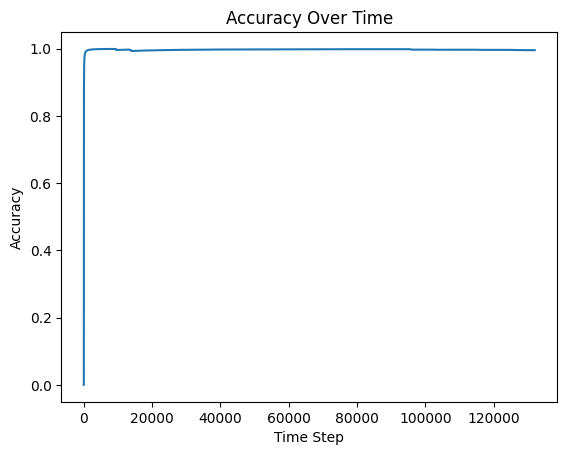

132039 samples analyzed.
Random Forest accuracy: 0.9957512553109309
Precision: 0.8593954816544409
F1-score: 0.8534436612437967


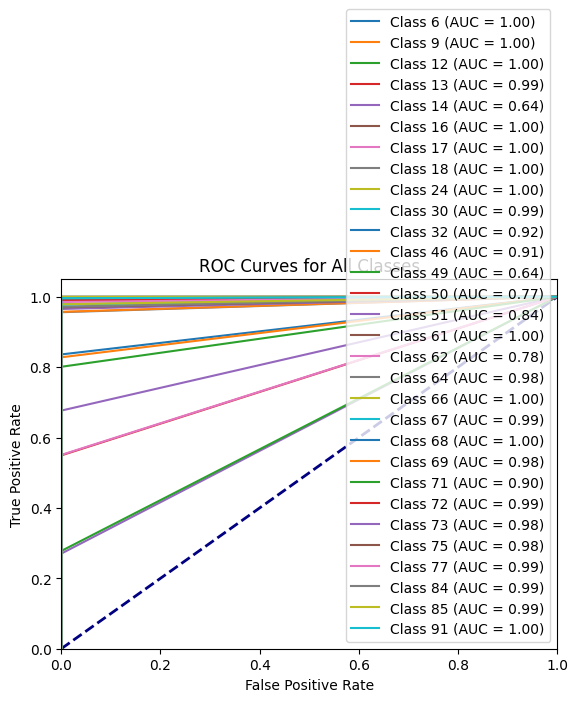

AUC for Class 0: 0.999713404145094
AUC for Class 1: 0.9953103476810121
AUC for Class 2: 0.9965884778362243
AUC for Class 3: 0.9852157533259801
AUC for Class 4: 0.6350669543499955
AUC for Class 5: 0.9996392366446931
AUC for Class 6: 0.9981696156602221
AUC for Class 7: 0.9999275771682624
AUC for Class 8: 0.9989158161038835
AUC for Class 9: 0.989171990906462
AUC for Class 10: 0.9179721146367323
AUC for Class 11: 0.9138003914602406
AUC for Class 12: 0.6388623779550223
AUC for Class 13: 0.7746078042065856
AUC for Class 14: 0.838231506382334
AUC for Class 15: 0.9983224542680986
AUC for Class 16: 0.7752713890838169
AUC for Class 17: 0.9779815483862397
AUC for Class 18: 0.9997121601614667
AUC for Class 19: 0.9883554698185019
AUC for Class 20: 0.997484882129469
AUC for Class 21: 0.9784160066197839
AUC for Class 22: 0.9004437174451142
AUC for Class 23: 0.9947546036318307
AUC for Class 24: 0.9824924489125003
AUC for Class 25: 0.9847531726820774
AUC for Class 26: 0.9923349524702726
AUC for Class 2

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_70.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=100, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsolo16_70.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_Stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_Stream_solo_16_70.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

#####Prueba con el 30 por ciento

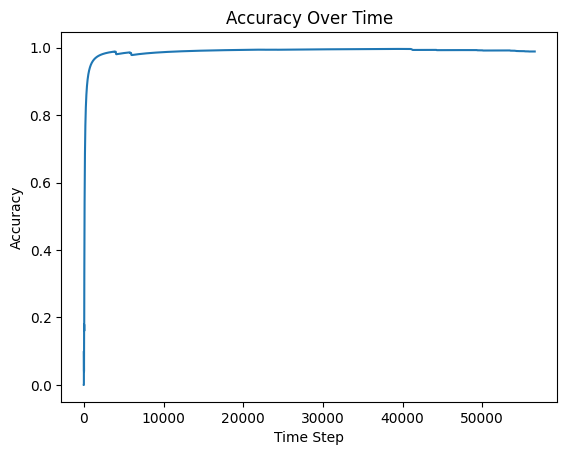

56591 samples analyzed.
Hoeffding accuracy: 0.9885670866392182
Precision: 0.8093452252103674
F1-score: 0.7983340689755237


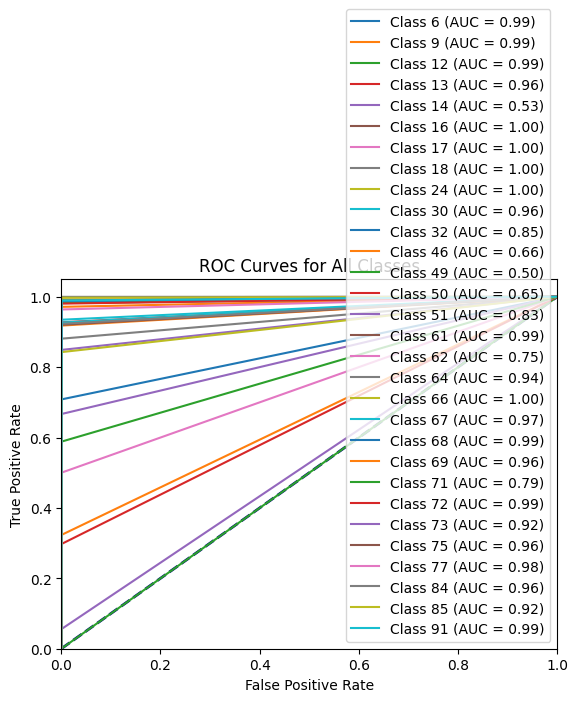

Average AUC (macro): 0.90
Accuracy for Class 6: 98.84%
Accuracy for Class 9: 97.12%
Accuracy for Class 12: 98.18%
Accuracy for Class 13: 92.72%
Accuracy for Class 14: 5.56%
Accuracy for Class 16: 99.86%
Accuracy for Class 17: 99.12%
Accuracy for Class 18: 99.96%
Accuracy for Class 24: 99.11%
Accuracy for Class 30: 92.65%
Accuracy for Class 32: 70.83%
Accuracy for Class 46: 32.35%
Accuracy for Class 49: 0.00%
Accuracy for Class 50: 29.73%
Accuracy for Class 51: 66.67%
Accuracy for Class 61: 98.93%
Accuracy for Class 62: 50.00%
Accuracy for Class 64: 88.08%
Accuracy for Class 66: 99.71%
Accuracy for Class 67: 93.47%
Accuracy for Class 68: 98.73%
Accuracy for Class 69: 91.80%
Accuracy for Class 71: 58.82%
Accuracy for Class 72: 98.05%
Accuracy for Class 73: 84.89%
Accuracy for Class 75: 92.02%
Accuracy for Class 77: 96.38%
Accuracy for Class 84: 92.31%
Accuracy for Class 85: 84.26%
Accuracy for Class 91: 98.93%


In [ ]:
from skmultiflow.data import SEAGenerator
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

df = Datasetsolo16_30.copy()

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = joblib.load('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/knnsolo16_70.pkl')


n_samples = 0
correct_cnt = 0
max_samples = 250000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)



plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Hoeffding accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_stream_solo_16_30.png', dpi=300, bbox_inches='tight')
plt.show()

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

# Obtener los números de clase únicos desde la columna "Activity"
unique_classes = df["Activity"].unique()

# Crear un diccionario que asocie los números de clase con sus etiquetas correspondientes
class_labels_dict = {class_label: class_label for class_label in unique_classes}

# Calcular el accuracy por clase dividiendo el número de muestras correctamente clasificadas por el número total de muestras por clase
class_accuracy_percentage = []
for class_label in unique_classes:
    correct_for_class = sum(1 for true, pred in zip(y_true, y_pred) if true == class_label and true == pred)
    total_for_class = sum(1 for true in y_true if true == class_label)
    accuracy = correct_for_class / total_for_class
    class_accuracy_percentage.append(accuracy)

# Imprimir el accuracy por clase con el número de etiqueta
for class_label in unique_classes:
    accuracy = class_accuracy_percentage[unique_classes.tolist().index(class_label)]
    print(f'Accuracy for Class {class_label}: {accuracy:.2%}')

#####Random

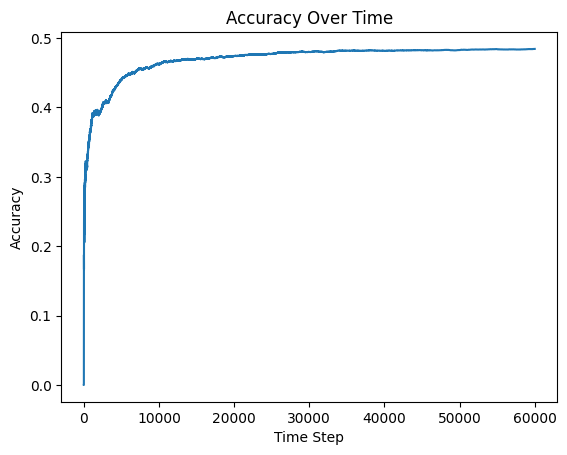

60000 samples analyzed.
Random Forest accuracy: 0.48436666666666667
Precision: 0.2053379252758132
F1-score: 0.14780021566606383


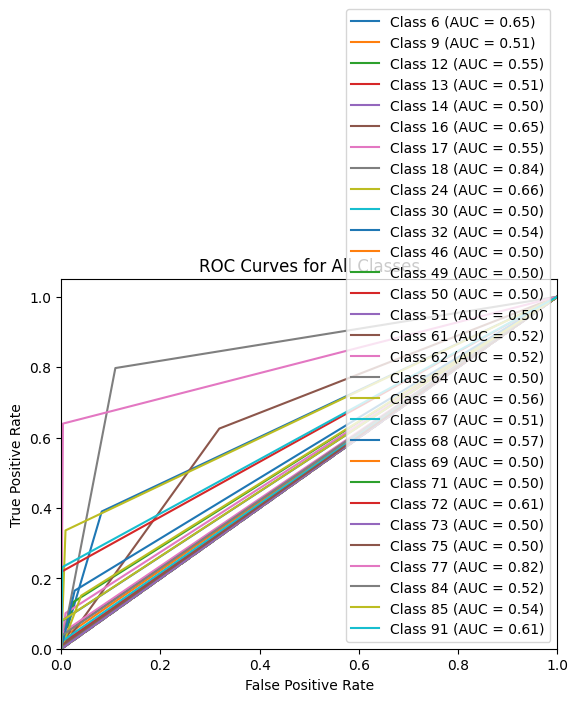

AUC for Class 0: 0.6541441997665641
AUC for Class 1: 0.5141717011423852
AUC for Class 2: 0.5541237321267808
AUC for Class 3: 0.5068768620638152
AUC for Class 4: 0.4999666544399613
AUC for Class 5: 0.6534081284890805
AUC for Class 6: 0.5462585206463246
AUC for Class 7: 0.8441545172221487
AUC for Class 8: 0.663783991254769
AUC for Class 9: 0.49999165818582225
AUC for Class 10: 0.5388275342967198
AUC for Class 11: 0.4999916608292471
AUC for Class 12: 0.4999916649996666
AUC for Class 13: 0.49997498540815477
AUC for Class 14: 0.4999249824959157
AUC for Class 15: 0.5182935609955922
AUC for Class 16: 0.521722457376777
AUC for Class 17: 0.5017167643160768
AUC for Class 18: 0.5553202742631979
AUC for Class 19: 0.5098337716336757
AUC for Class 20: 0.569000175644941
AUC for Class 21: 0.49998331497981113
AUC for Class 22: 0.4999332198070052
AUC for Class 23: 0.6090643346147698
AUC for Class 24: 0.4999415233989942
AUC for Class 25: 0.5043751047890769
AUC for Class 26: 0.8180855577419275
AUC for Cla

In [ ]:
from skmultiflow.lazy import KNNClassifier
from skmultiflow.data import SEAGenerator
from skmultiflow.data import DataStream
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib

np.random.seed(42)

# Aleatoriza el DataFrame
df = Datasetsolo16.sample(frac=1)

target_idx = df.columns.get_loc("Activity")

# Crear el flujo de datos
stream = DataStream(df, target_idx=target_idx)


modelo = KNNClassifier(n_neighbors=5, max_window_size=10000, leaf_size=30)


n_samples = 0
correct_cnt = 0
max_samples = 60000

y_true = []
y_pred = []


accuracy_history = []


while n_samples < max_samples and stream.has_more_samples():

    X, y = stream.next_sample()
    y_pred_batch = modelo.predict(X)

    y_true.append(y[0])
    y_pred.append(y_pred_batch[0])

    if y[0] == y_pred_batch[0]:
        correct_cnt += 1

    modelo = modelo.partial_fit(X, y)
    n_samples += 1


    accuracy = correct_cnt / n_samples
    accuracy_history.append(accuracy)

joblib.dump(modelo, '/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Modelos/KNN_SOLO16_10000_FILAS.pkl')


plt.figure()
plt.plot(range(len(accuracy_history)), accuracy_history)
plt.xlabel('Time Step')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Time')
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/Graficas Accuracy /KNN_SOLO16_10000_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

###################################

# Calcular métricas
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')


print('{} samples analyzed.'.format(n_samples))
print('Random Forest accuracy: {}'.format(correct_cnt / n_samples))
print('Precision: {}'.format(precision))
print('F1-score: {}'.format(f1))

# Calcular métricas por clase
n_classes = len(np.unique(y_true))
roc_auc_scores = []

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]  # Convierte a binario
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]  # Convierte a binario
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    roc_auc_scores.append(auc_class)

plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

for class_label in np.unique(y_true):
    y_true_class = [1 if label == class_label else 0 for label in y_true]
    y_pred_class = [1 if pred == class_label else 0 for pred in y_pred]
    fpr, tpr, _ = roc_curve(y_true_class, y_pred_class)
    auc_class = roc_auc_score(y_true_class, y_pred_class)
    plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {auc_class:.2f})')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Classes')
plt.legend(loc="lower right")
plt.savefig('/content/drive/MyDrive/TESIS_DATASET/Datasets definitivos_CSV/ROC/KNN_SOLO16_10000_FILAS.png', dpi=300, bbox_inches='tight')
plt.show()

# Imprimir AUC por clase
for class_label, auc_class in enumerate(roc_auc_scores):
    print(f'AUC for Class {class_label}: {auc_class}')

average_auc_macro = np.mean(roc_auc_scores)
print(f'Average AUC (macro): {average_auc_macro:.2f}')

## Intento para dividir el dataset en 10 partes iguales

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import random

df = Dataset.copy()

df = df.fillna(0)

unique_datasets = df['Dataset'].unique()
unique_activities = df['Activity'].unique()

dfs = []

for dataset in unique_datasets:
    for activity in unique_activities:

        subset = df[(df['Dataset'] == dataset) & (df['Activity'] == activity)]

        subset_parts = np.array_split(subset, 10)


        for i, part in enumerate(subset_parts):
            if len(dfs) <= i:
                dfs.append(part)
            else:
                dfs[i] = pd.concat([dfs[i], part])

random_seed = 42

for i in range(10):
    dfs[i] = dfs[i].sample(frac=1, random_state=random_seed)

for i in range(10):
    dfs[i] = dfs[i].drop(columns=['Dataset', 'segmento'])

df1, df2, df3, df4, df5, df6, df7, df8, df9, df10 = dfs


In [ ]:
df4

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
193608,61,0.018866,0.058380,0.057718,0.000000,0.000000,0.000000,0.091736,0.469009,-0.558921,...,0.000000,3.129032,4.343917,4.558483,-0.000000,-0.000000,-0.000000,3,0,1
93963,16,1.728710,1.313005,1.427617,0.533008,1.640641,0.481567,0.527538,4.108654,7.081544,...,0.333982,7.988716,7.660105,7.932846,8.182633,8.239311,8.122633,2,0,2
50546,16,0.012206,0.010570,0.021905,0.000000,0.000000,0.000000,-0.498578,0.622491,0.176131,...,0.000000,2.484154,2.344438,3.526140,-0.000000,-0.000000,-0.000000,3,0,1
49414,16,0.006834,0.009286,0.013632,0.000000,0.000000,0.000000,-0.327383,0.293562,0.854978,...,0.000000,1.719796,2.289173,2.878216,-0.000000,-0.000000,-0.000000,3,0,1
36808,13,0.096361,0.086897,0.085361,0.000000,0.000000,0.000000,-0.056492,0.121822,0.952474,...,0.000000,5.339304,5.211869,5.133753,-0.000000,-0.000000,-0.000000,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223490,68,0.522904,0.208401,0.294620,0.000000,0.000000,0.000000,0.005540,0.461408,-0.401478,...,0.000000,5.631003,5.217017,5.779315,-0.000000,-0.000000,-0.000000,3,0,1
12011,6,0.694927,0.330419,0.551333,0.000000,0.000000,0.000000,0.156553,0.278871,-0.173668,...,0.000000,6.975350,6.717652,7.091684,-0.000000,-0.000000,-0.000000,3,0,1
39485,15,1.373840,0.706733,0.534570,1.977227,1.119598,1.656982,1.118106,-0.201999,-0.060115,...,1.238515,8.617506,8.054937,7.977375,8.441099,8.065175,8.397099,2,1,2
205714,66,0.007106,0.007590,0.011680,0.000000,0.000000,0.000000,1.107285,-0.213235,-0.000264,...,0.000000,1.722799,1.875287,2.506658,-0.000000,-0.000000,-0.000000,3,0,1


####Creacion de 10 archivos random

In [ ]:
import pandas as pd
import numpy as np

df = Dataset.copy()

df_list = []

num_aleatorizaciones = 10

random_seed = 42

for i in range(num_aleatorizaciones):

    np.random.seed(random_seed + i)

    df_random = df.sample(frac=1)

    df_list.append(df_random)

df1, df2, df3, df4, df5, df6, df7, df8, df9, df10 = df_list

In [ ]:
df5

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
108351,18,0.057689,0.575994,0.217342,0.011654,0.011947,0.010788,-0.245775,-0.477861,0.707951,...,0.008450,6.577852,6.984801,7.251028,7.823076,7.816586,7.823076,2,2,7
131132,18,0.008259,0.007058,0.012929,0.000000,0.000000,0.000000,-1.007309,-0.252203,-0.023194,...,0.000000,1.977439,1.816956,2.743713,-0.000000,-0.000000,-0.000000,3,0,1
125681,18,0.007045,0.007473,0.013135,0.000000,0.000000,0.000000,0.024748,-0.893495,0.746636,...,0.000000,1.670261,1.954334,2.764347,-0.000000,-0.000000,-0.000000,3,0,1
214704,67,0.029381,0.069845,0.086646,0.000000,0.000000,0.000000,1.144641,-0.074646,0.240647,...,0.000000,3.255262,4.691344,4.815209,-0.000000,-0.000000,-0.000000,3,0,1
27006,9,0.662677,0.867036,0.530203,1.652428,2.195002,1.998281,0.249189,-1.094432,0.145228,...,1.683784,7.573592,7.342321,7.573592,7.565592,7.573592,7.573592,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84410,16,0.009342,0.072447,0.080539,0.000000,0.000000,0.000000,-0.865610,-0.678273,-0.017476,...,0.000000,2.131296,2.482873,3.402337,-0.000000,-0.000000,-0.000000,3,0,1
56692,16,0.346295,0.131018,0.540393,0.000000,0.000000,0.000000,-0.119994,0.496498,0.111320,...,0.000000,6.216145,5.587673,5.909115,-0.000000,-0.000000,-0.000000,3,0,1
30248,12,0.052199,0.055764,0.075441,0.000000,0.000000,0.000000,-0.670781,0.256921,-0.453969,...,0.000000,4.420144,4.759241,5.259373,-0.000000,-0.000000,-0.000000,3,0,1
219973,68,0.200860,0.119764,0.452502,0.000000,0.000000,0.000000,-0.404145,0.384124,-0.318895,...,0.000000,4.094950,4.615944,5.249157,-0.000000,-0.000000,-0.000000,3,0,1


#####Aleatorizar pero que 5 filas se mantengas continuas

In [ ]:
df = Datasetsin16_70.copy()

actividades_unicas = df['Activity'].unique()

filas_aleatorias = []


for actividad in actividades_unicas:

    filas_actividad = df[df['Activity'] == actividad]

    if len(filas_actividad) >= 5:

        filas_actividad = filas_actividad.sample(frac=1)

    filas_aleatorias.append(filas_actividad)

df_aleatorizado = pd.concat(filas_aleatorias)

df_aleatorizado.reset_index(drop=True, inplace=True)

In [ ]:
df_aleatorizado

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,3,0.089726,0.089969,0.068236,0.195537,0.247366,0.182909,-0.653662,0.397655,0.417572,...,0.148416,7.968275,7.981784,7.981784,7.973784,7.965784,7.973784,2,0,1
1,3,0.059965,0.047102,0.075058,0.187416,0.263467,0.171514,-0.565354,0.572209,0.201623,...,0.107360,7.670009,7.522738,7.690235,7.954765,7.930765,7.898765,2,0,1
2,3,0.113669,0.059483,0.110229,0.255976,0.272078,0.170106,0.659812,0.525896,0.092553,...,0.133601,7.981784,7.981784,7.981784,7.981784,7.981784,7.960275,2,0,1
3,3,0.661752,0.277295,0.214343,0.690475,0.325166,0.795396,-0.466064,0.165505,0.373507,...,0.342832,7.077367,7.083417,7.124553,7.333426,7.259387,7.275224,2,2,1
4,3,0.163391,0.092723,0.100061,0.239676,0.161316,0.247725,-0.103415,0.681858,0.107469,...,0.187842,6.623439,6.332783,6.366641,6.350274,6.350274,6.350274,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35244,92,0.003854,0.002994,0.007763,0.016503,0.007801,0.004503,0.518902,0.597275,0.142954,...,0.003503,7.619128,7.628837,7.638547,7.600108,7.488142,7.456290,2,0,2
35245,92,0.039523,0.059053,0.074679,0.206963,0.134394,0.052425,-0.092029,-1.137831,0.398879,...,0.038807,7.231163,7.336078,7.439664,7.463645,7.059131,6.713095,2,0,2
35246,92,0.004691,0.005354,0.005236,0.018624,0.016056,0.012114,0.662697,-0.801786,-0.488435,...,0.026776,6.877321,7.111109,6.926894,4.994887,4.953217,4.542544,2,0,2
35247,92,0.007047,0.003436,0.004252,0.010869,0.015742,0.007417,-0.490373,-0.956201,0.495938,...,0.007772,6.889651,6.458263,6.772913,6.235086,6.339091,6.014174,2,0,2


In [ ]:
df_30 = Datasetsin16_30.copy()

actividades_unicas = df_30['Activity'].unique()

filas_aleatorias = []

for actividad in actividades_unicas:

    filas_actividad = df_30[df_30['Activity'] == actividad]

    if len(filas_actividad) >= 5:
        filas_actividad = filas_actividad.sample(frac=1)

    filas_aleatorias.append(filas_actividad)


df_aleatorizado_30 = pd.concat(filas_aleatorias)

df_aleatorizado_30.reset_index(drop=True, inplace=True)

In [ ]:
df_aleatorizado

,Activity,X_Acc_std,Y_Acc_std,Z_Acc_std,X_Gyro_std,Y_Gyro_std,Z_Gyro_std,X_Acc_mean,Y_Acc_mean,Z_Acc_mean,...,Z_Gyro_abslt,X_Acc_entropy,Y_Acc_entropy,Z_Acc_entropy,X_Gyro_entropy,Y_Gyro_entropy,Z_Gyro_entropy,Sensor_Type,Left_Right,Ubication
0,3,0.089726,0.089969,0.068236,0.195537,0.247366,0.182909,-0.653662,0.397655,0.417572,...,0.148416,7.968275,7.981784,7.981784,7.973784,7.965784,7.973784,2,0,1
1,3,0.059965,0.047102,0.075058,0.187416,0.263467,0.171514,-0.565354,0.572209,0.201623,...,0.107360,7.670009,7.522738,7.690235,7.954765,7.930765,7.898765,2,0,1
2,3,0.113669,0.059483,0.110229,0.255976,0.272078,0.170106,0.659812,0.525896,0.092553,...,0.133601,7.981784,7.981784,7.981784,7.981784,7.981784,7.960275,2,0,1
3,3,0.661752,0.277295,0.214343,0.690475,0.325166,0.795396,-0.466064,0.165505,0.373507,...,0.342832,7.077367,7.083417,7.124553,7.333426,7.259387,7.275224,2,2,1
4,3,0.163391,0.092723,0.100061,0.239676,0.161316,0.247725,-0.103415,0.681858,0.107469,...,0.187842,6.623439,6.332783,6.366641,6.350274,6.350274,6.350274,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35244,92,0.003854,0.002994,0.007763,0.016503,0.007801,0.004503,0.518902,0.597275,0.142954,...,0.003503,7.619128,7.628837,7.638547,7.600108,7.488142,7.456290,2,0,2
35245,92,0.039523,0.059053,0.074679,0.206963,0.134394,0.052425,-0.092029,-1.137831,0.398879,...,0.038807,7.231163,7.336078,7.439664,7.463645,7.059131,6.713095,2,0,2
35246,92,0.004691,0.005354,0.005236,0.018624,0.016056,0.012114,0.662697,-0.801786,-0.488435,...,0.026776,6.877321,7.111109,6.926894,4.994887,4.953217,4.542544,2,0,2
35247,92,0.007047,0.003436,0.004252,0.010869,0.015742,0.007417,-0.490373,-0.956201,0.495938,...,0.007772,6.889651,6.458263,6.772913,6.235086,6.339091,6.014174,2,0,2
